In [44]:
from nearest_neighbor import get_most_relevant_embeddings
from nearest_neighbor import get_most_relevant_embeddings_nl
from sentence_transformers import SentenceTransformer, LoggingHandler
from IPython.display import Image
from shutil import copy2
import scipy
import json
import logging
import os
import numpy as np


In [2]:
home_dataset_path = '/home/toby/Screen2Vec/datasets/filtered_traces/'

In [3]:
# load the Sentence-BERT model
logging.basicConfig(format='%(asctime)s - %(message)s',
                            datefmt='%Y-%m-%d %H:%M:%S',
                            level=logging.INFO,
                            handlers=[LoggingHandler()])
sentence_bert_model = SentenceTransformer('bert-base-nli-mean-tokens')

2020-09-11 17:24:13 - Load pretrained SentenceTransformer: bert-base-nli-mean-tokens
2020-09-11 17:24:13 - Did not find a '/' or '\' in the name. Assume to download model from server.
2020-09-11 17:24:13 - Load SentenceTransformer from folder: /home/toby/.cache/torch/sentence_transformers/public.ukp.informatik.tu-darmstadt.de_reimers_sentence-transformers_v0.2_bert-base-nli-mean-tokens.zip
2020-09-11 17:24:13 - loading configuration file /home/toby/.cache/torch/sentence_transformers/public.ukp.informatik.tu-darmstadt.de_reimers_sentence-transformers_v0.2_bert-base-nli-mean-tokens.zip/0_BERT/config.json
2020-09-11 17:24:13 - Model config BertConfig {
  "attention_probs_dropout_prob": 0.1,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "type

In [4]:
# load the pre-computed embeddings
screen2vec_embedding_path = 'output/precomp_model4descr.json'
with open(screen2vec_embedding_path) as f:
        screen2vec_embeddings = json.load(f, encoding='utf-8')
        
textonly_embedding_path = 'output/precomp_text_baseline.json'
with open(textonly_embedding_path) as f:
        textonly_embeddings = json.load(f, encoding='utf-8')
        
layoutonly_embedding_path = 'output/precomp_layout_baseline.json'
with open(layoutonly_embedding_path) as f:
        layoutonly_embeddings = json.load(f, encoding='utf-8')

In [89]:
#print (list(textonly_embeddings.keys())[420])
print (len(textonly_embeddings.keys()))

a = (textonly_embeddings['in.droom/trace_0/view_hierarchies/349.json'])
b = (textonly_embeddings['com.cinemark.mobile/trace_0/view_hierarchies/2751.json'])
c = (layoutonly_embeddings['in.droom/trace_0/view_hierarchies/349.json'])
d = (layoutonly_embeddings['com.cinemark.mobile/trace_0/view_hierarchies/2751.json'])

print (np.linalg.norm(screen2vec_embeddings['in.droom/trace_0/view_hierarchies/349.json']))
print (np.linalg.norm(screen2vec_embeddings['com.cinemark.mobile/trace_0/view_hierarchies/2751.json']))
print (np.linalg.norm(screen2vec_embeddings['com.nordstrom.rack.app/trace_0/view_hierarchies/2.json']))
print (np.linalg.norm(textonly_embeddings['in.droom/trace_0/view_hierarchies/349.json']))
print (np.linalg.norm(textonly_embeddings['com.cinemark.mobile/trace_0/view_hierarchies/2751.json']))
print (np.linalg.norm(textonly_embeddings['com.nordstrom.rack.app/trace_0/view_hierarchies/2.json']))
print (np.linalg.norm(layoutonly_embeddings['in.droom/trace_0/view_hierarchies/349.json']))
print (np.linalg.norm(layoutonly_embeddings['com.cinemark.mobile/trace_0/view_hierarchies/2751.json']))
print (np.linalg.norm(layoutonly_embeddings['com.nordstrom.rack.app/trace_0/view_hierarchies/2.json']))


# print (scipy.spatial.distance.cosine(a, b))

66261
20.247458944772095
20.28960708843932
19.887913629468176
11.657102476026425
11.116078519720995
12.207429814742632
7.968273194365859
7.606263117410499
8.341038213861303


In [6]:
def get_embedding_from_text(text, text_embedding_dict, sentence_bert_model):
    if not text_embedding_dict is None and text in text_embedding_dict:
        return text_embedding_dict[text]
    else:
        return sentence_bert_model.encode([text])[0]

In [72]:
def get_screenshot_path_for_screen_path (screen_path):
    split_path = screen_path.split('/')
    return '/'.join(split_path[0:len(split_path)-1]) + '/../screenshots/' + split_path[len(split_path)-1].replace('.json', '.jpg')
     
def get_app_package_name_from_screen_path (screen_path):
    split_path = screen_path.split('/')
    return split_path[len(split_path)-4]

def show_rico_image(file_path):
    display(Image(filename=file_path, height=480, width=270))
    print (file_path)
    
def get_id_from_path(file_path):
    selected_screen_splitted = file_path.split('/')
    selected_screen_id = '-'.join(selected_screen_splitted[len(selected_screen_splitted)-4:len(selected_screen_splitted)])
    return selected_screen_id.replace('.json', '')

def get_relative_path_from_full_path(file_path):
    selected_screen_splitted = file_path.split('/')
    relative_path = '/'.join(selected_screen_splitted[len(selected_screen_splitted)-4:len(selected_screen_splitted)])
    return relative_path

def get_full_path_from_relative_path_if_not_available(file_path, home_dataset_path):
    if (not os.path.exists(file_path)):
        return home_dataset_path + file_path
    else:
        return file_path
    

Source Screen:


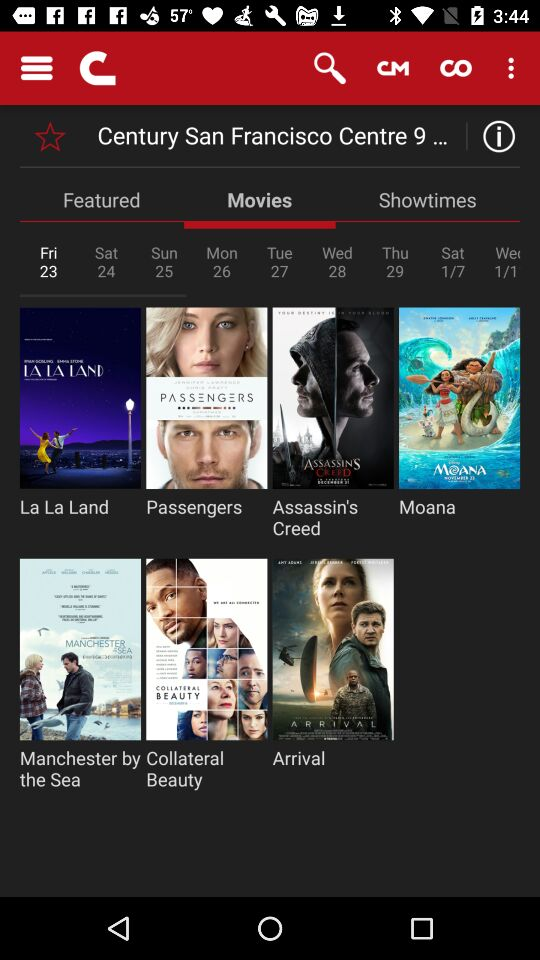

/home/toby/Screen2Vec/datasets/filtered_traces/com.cinemark.mobile/trace_0/view_hierarchies/../screenshots/2751.jpg
package name:  com.cinemark.mobile




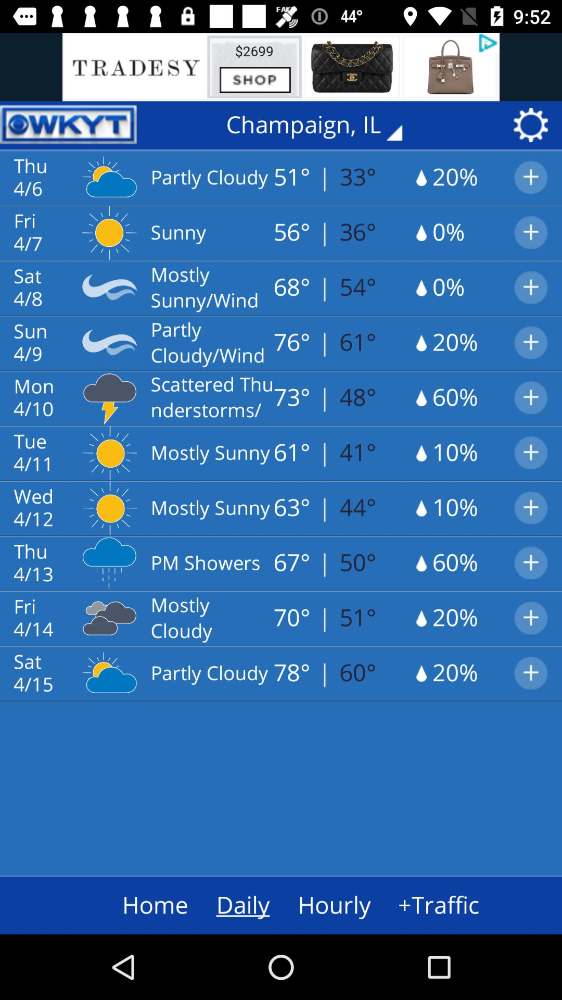

/home/toby/Screen2Vec/datasets/filtered_traces/com.wkyt.android.weather/trace_0/view_hierarchies/../screenshots/166.jpg
score:  0.05182844746429893
package name:  com.wkyt.android.weather




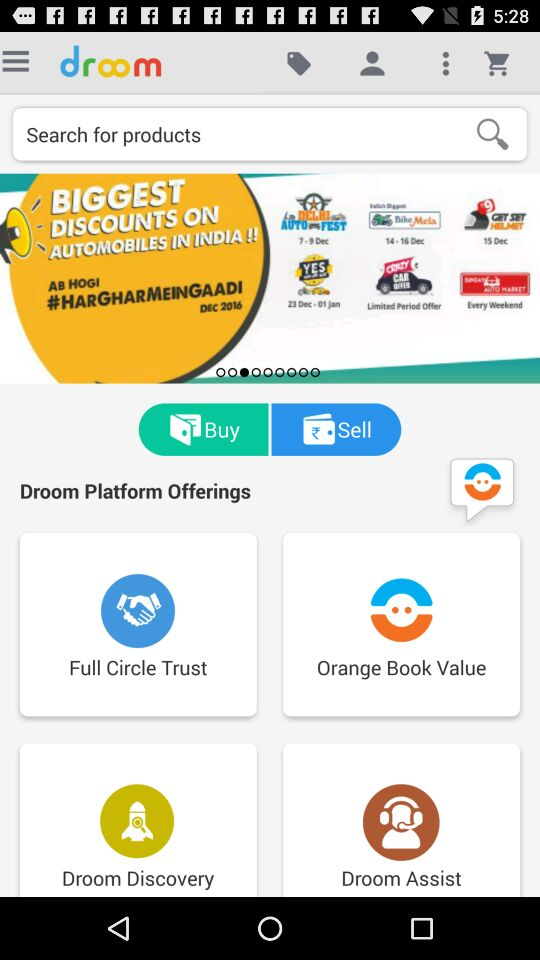

/home/toby/Screen2Vec/datasets/filtered_traces/in.droom/trace_0/view_hierarchies/../screenshots/349.jpg
score:  0.055040682578609945
package name:  in.droom




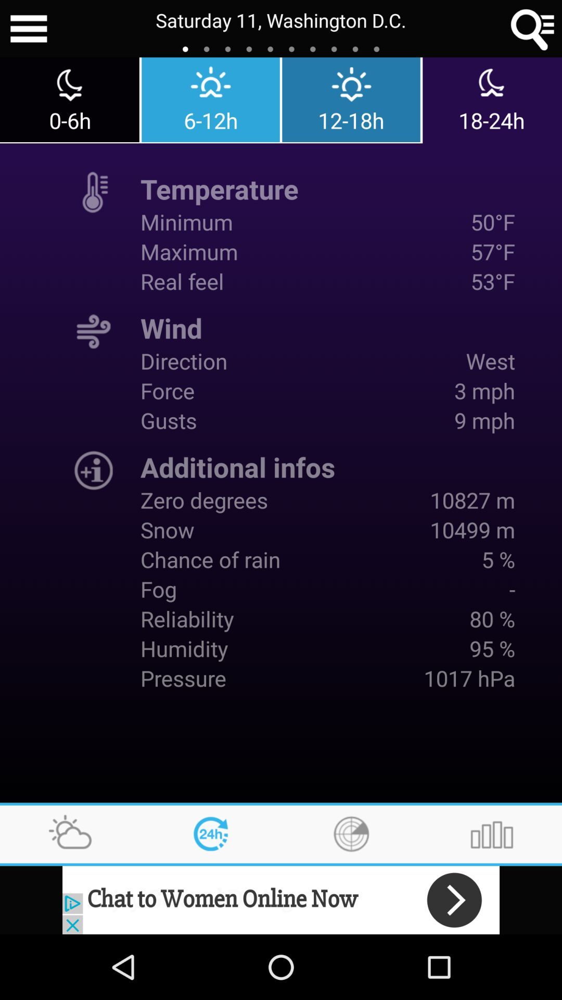

/home/toby/Screen2Vec/datasets/filtered_traces/com.idmobile.usameteo/trace_0/view_hierarchies/../screenshots/172.jpg
score:  0.06071606047933986
package name:  com.idmobile.usameteo




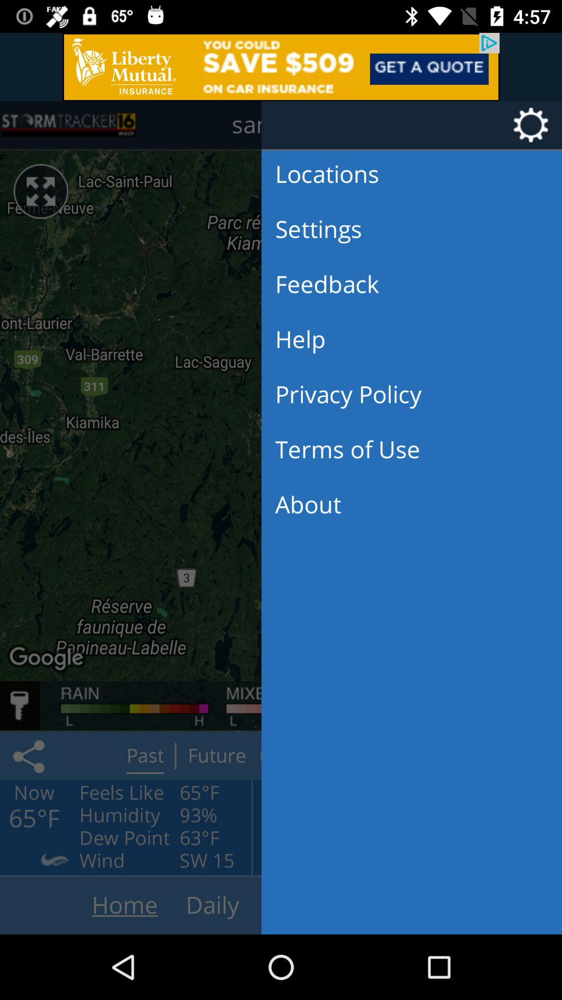

/home/toby/Screen2Vec/datasets/filtered_traces/com.wnep.android.weather/trace_0/view_hierarchies/../screenshots/229.jpg
score:  0.06398303973379094
package name:  com.wnep.android.weather




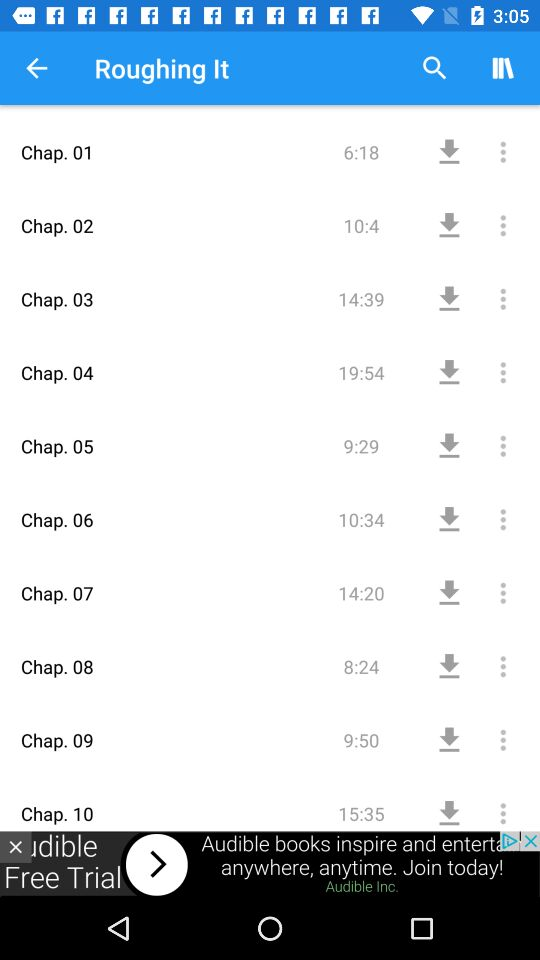

/home/toby/Screen2Vec/datasets/filtered_traces/com.oodles.download.free.ebooks.reader/trace_0/view_hierarchies/../screenshots/3866.jpg
score:  0.06861781243966159
package name:  com.oodles.download.free.ebooks.reader




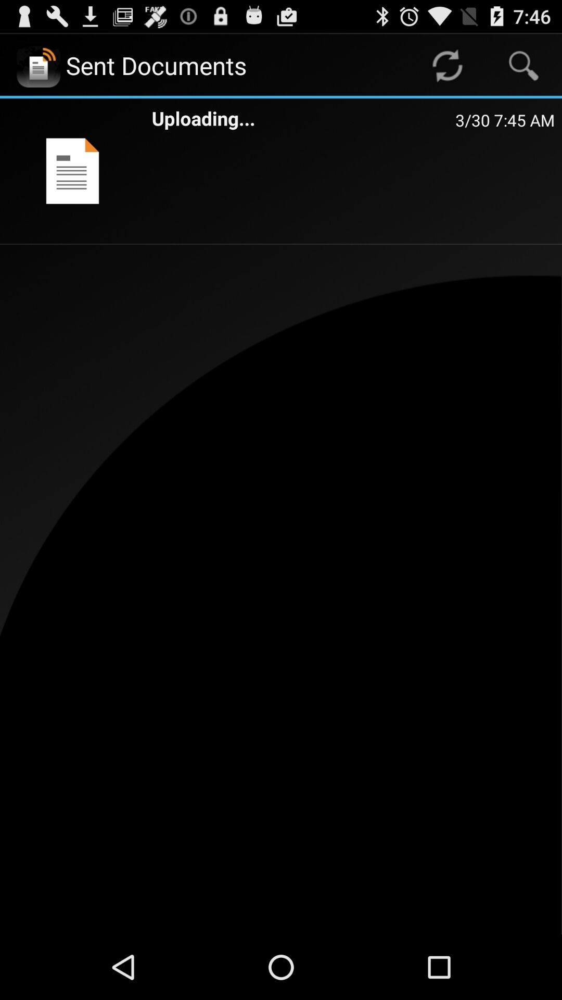

/home/toby/Screen2Vec/datasets/filtered_traces/com.eleostech.driveaxle/trace_0/view_hierarchies/../screenshots/902.jpg
score:  0.07826537477006656
package name:  com.eleostech.driveaxle




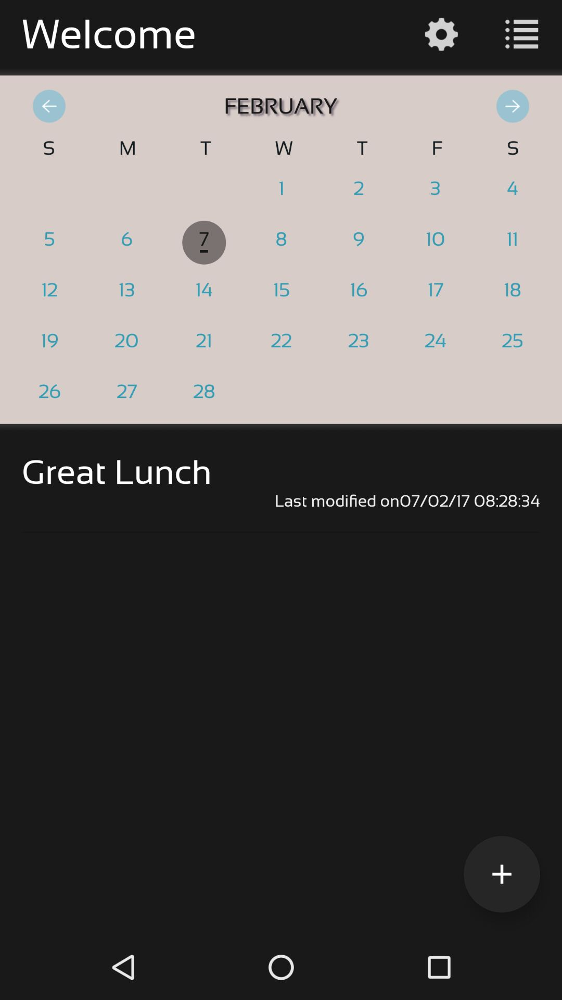

/home/toby/Screen2Vec/datasets/filtered_traces/com.Glitter.Private.Secret.Diary/trace_0/view_hierarchies/../screenshots/586.jpg
score:  0.08849492775994616
package name:  com.Glitter.Private.Secret.Diary




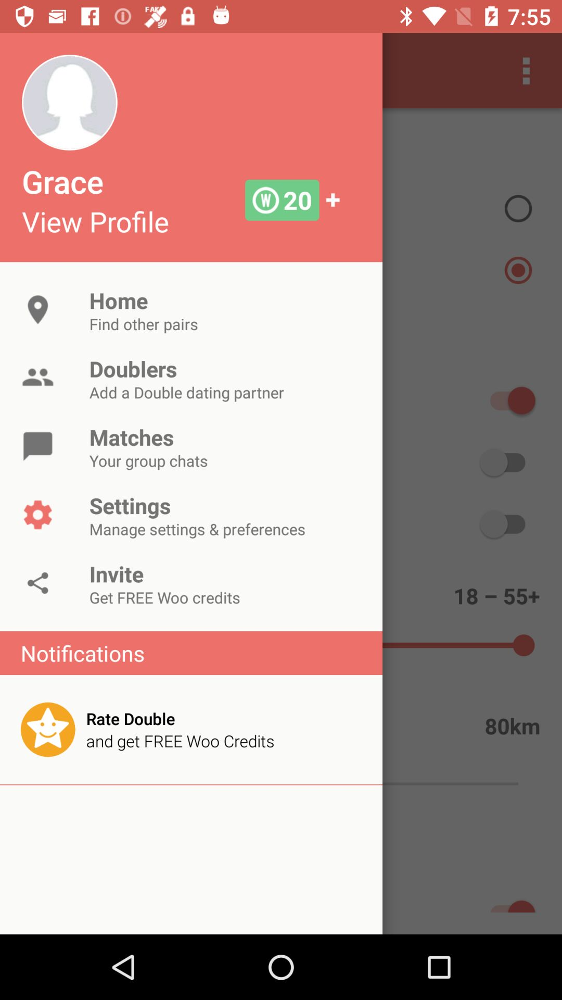

/home/toby/Screen2Vec/datasets/filtered_traces/com.joindouble.android/trace_0/view_hierarchies/../screenshots/236.jpg
score:  0.09221070142952514
package name:  com.joindouble.android




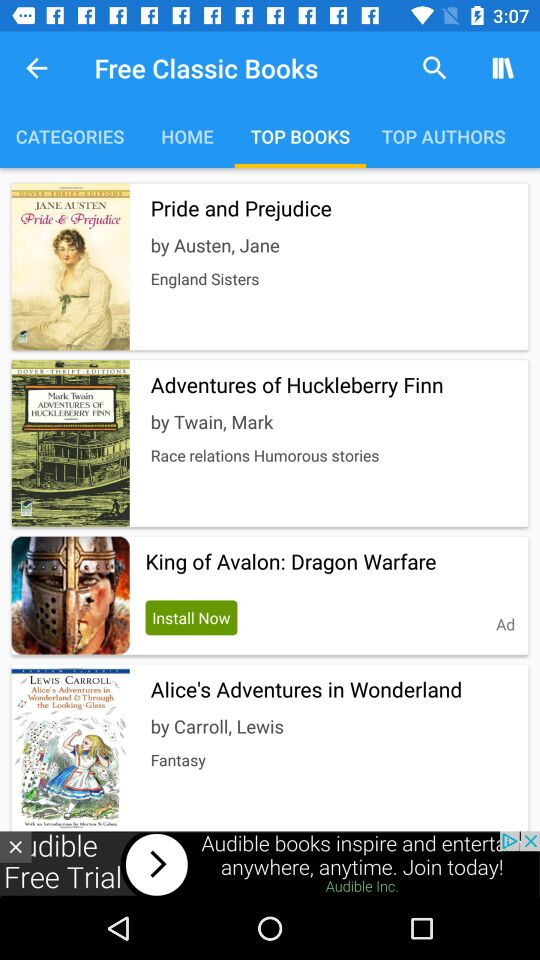

/home/toby/Screen2Vec/datasets/filtered_traces/com.oodles.download.free.ebooks.reader/trace_0/view_hierarchies/../screenshots/5610.jpg
score:  0.10584775305415117
package name:  com.oodles.download.free.ebooks.reader




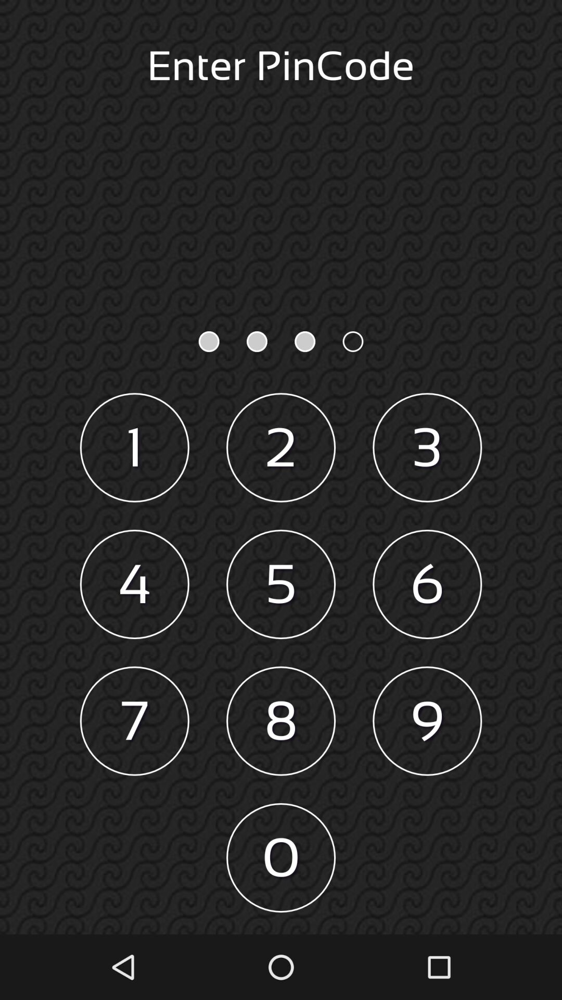

/home/toby/Screen2Vec/datasets/filtered_traces/com.Glitter.Private.Secret.Diary/trace_0/view_hierarchies/../screenshots/131.jpg
score:  0.11883462037032544
package name:  com.Glitter.Private.Secret.Diary


[{'rico_id': 'com.wkyt.android.weather/trace_0/view_hierarchies/166.json', 'score': 0.05182844746429893}, {'rico_id': 'in.droom/trace_0/view_hierarchies/349.json', 'score': 0.055040682578609945}, {'rico_id': 'com.idmobile.usameteo/trace_0/view_hierarchies/172.json', 'score': 0.06071606047933986}, {'rico_id': 'com.wnep.android.weather/trace_0/view_hierarchies/229.json', 'score': 0.06398303973379094}, {'rico_id': 'com.oodles.download.free.ebooks.reader/trace_0/view_hierarchies/3866.json', 'score': 0.06861781243966159}, {'rico_id': 'com.eleostech.driveaxle/trace_0/view_hierarchies/902.json', 'score': 0.07826537477006656}, {'rico_id': 'com.Glitter.Private.Secret.Diary/trace_0/view_hierarchies/586.json', 'score': 0.08849492775994616}, {'rico_id': 'com.joindouble.android/trace_0/view_hiera

In [29]:
# Test the screen nearest neighbors
selected_screen = '/home/toby/Screen2Vec/datasets/filtered_traces/com.cinemark.mobile/trace_0/view_hierarchies/2751.json'
# selected_screen = '/home/toby/Screen2Vec/datasets/filtered_traces/com.nordstrom.rack.app/trace_0/view_hierarchies/630.json'
embedding_to_use = textonly_embeddings
n = 10

print ('Source Screen:')
show_rico_image(get_screenshot_path_for_screen_path(selected_screen))
print ('package name: ', get_app_package_name_from_screen_path(selected_screen))
print ('\n')

results = (get_most_relevant_embeddings(get_relative_path_from_full_path(selected_screen), embedding_to_use, n, home_dataset_path, filter_duplicated_activity=True))
for result in results:
    show_rico_image(get_screenshot_path_for_screen_path(get_full_path_from_relative_path_if_not_available(result['rico_id'], home_dataset_path)))
    print ('score: ', result['score'])
    print ('package name: ', get_app_package_name_from_screen_path(result['rico_id']))
    print ('\n')
    
print (results)

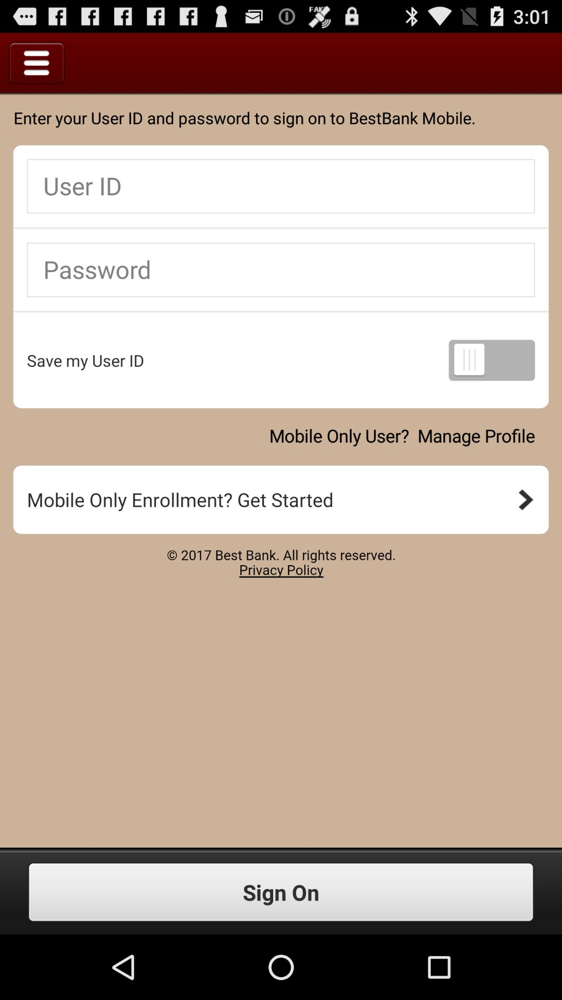

/home/toby/Screen2Vec/datasets/filtered_traces/com.mfoundry.mb.android.mb_152_00001/trace_0/view_hierarchies/../screenshots/9.jpg
score:  0.9029590580808358
package name:  com.mfoundry.mb.android.mb_152_00001




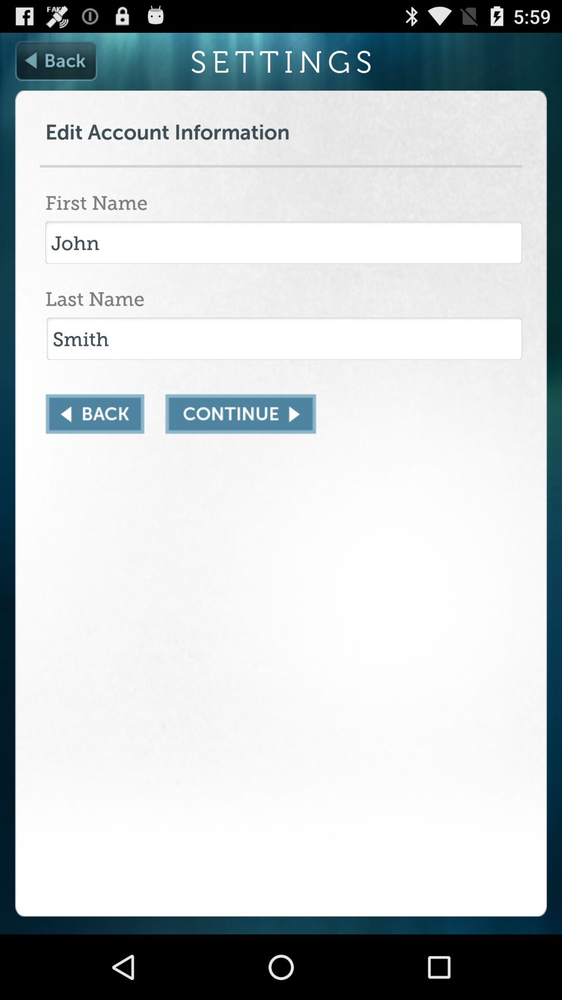

/home/toby/Screen2Vec/datasets/filtered_traces/joelosteen.android.phone.JOMApp/trace_0/view_hierarchies/../screenshots/1155.jpg
score:  0.9040641788138366
package name:  joelosteen.android.phone.JOMApp




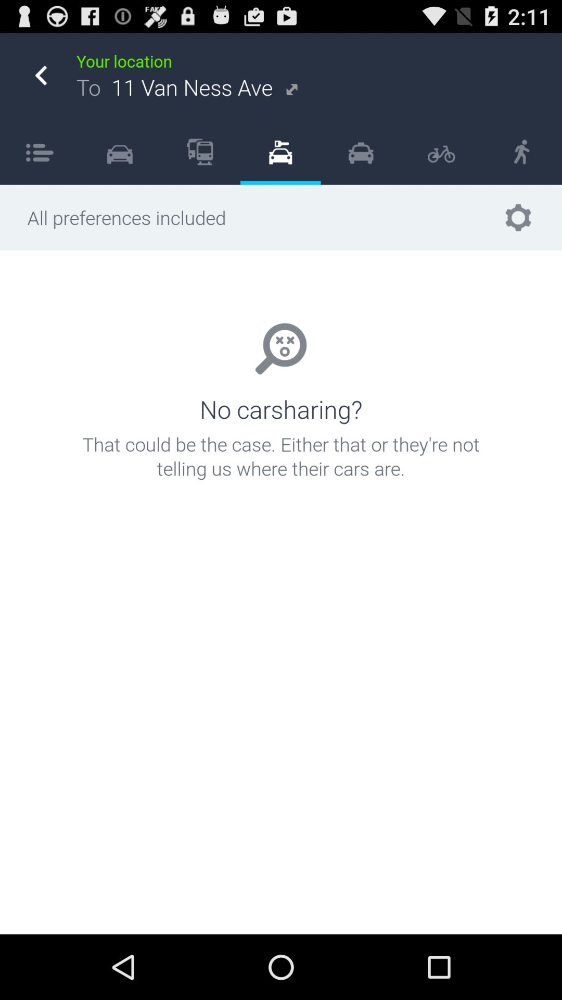

/home/toby/Screen2Vec/datasets/filtered_traces/com.nezdroid.cardashdroid/trace_0/view_hierarchies/../screenshots/698.jpg
score:  0.9054842880111682
package name:  com.nezdroid.cardashdroid




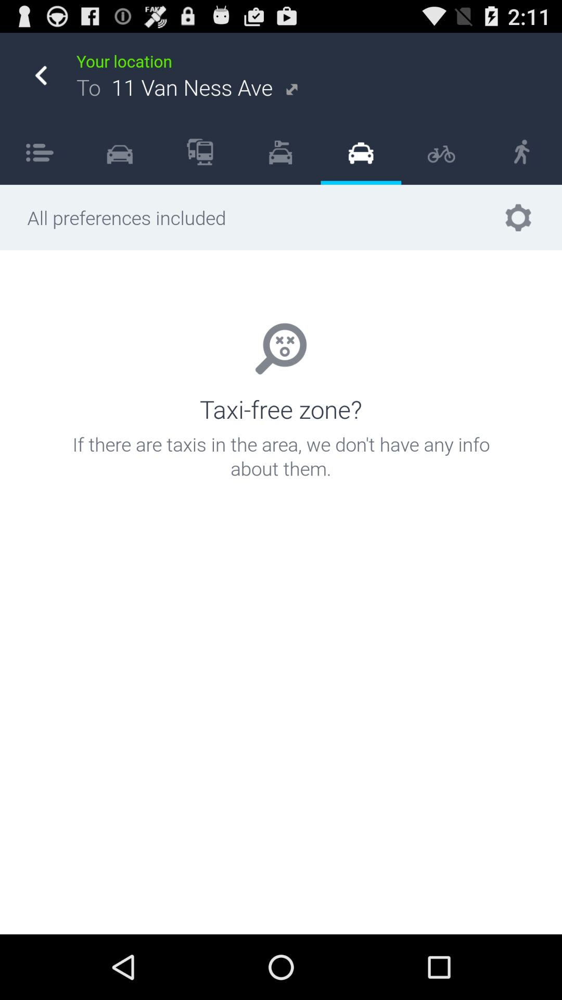

/home/toby/Screen2Vec/datasets/filtered_traces/com.nezdroid.cardashdroid/trace_0/view_hierarchies/../screenshots/700.jpg
score:  0.9054842904381304
package name:  com.nezdroid.cardashdroid




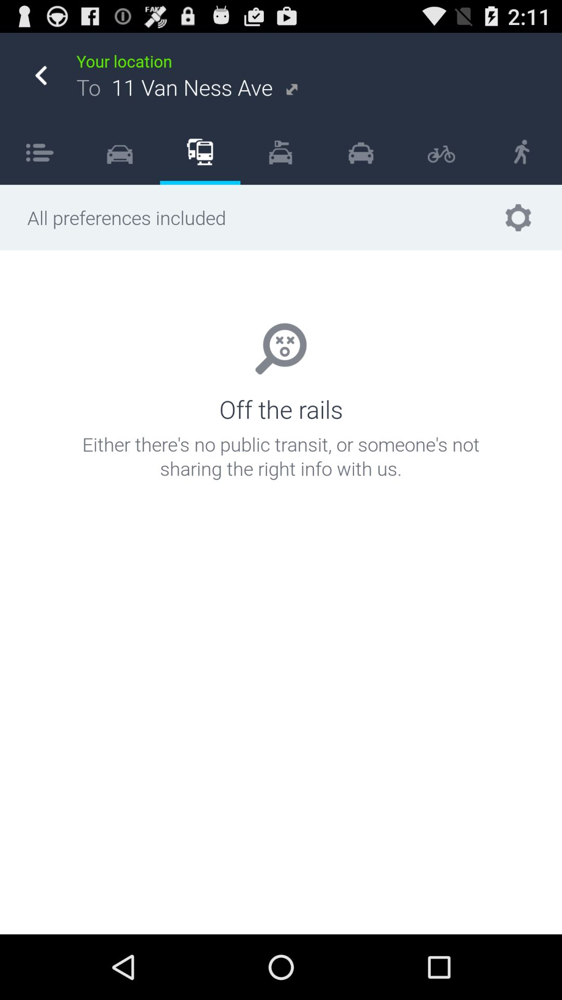

/home/toby/Screen2Vec/datasets/filtered_traces/com.nezdroid.cardashdroid/trace_0/view_hierarchies/../screenshots/696.jpg
score:  0.9054842904381304
package name:  com.nezdroid.cardashdroid


[{'rico_id': 'com.mfoundry.mb.android.mb_152_00001/trace_0/view_hierarchies/9.json', 'score': 0.9029590580808358}, {'rico_id': 'joelosteen.android.phone.JOMApp/trace_0/view_hierarchies/1155.json', 'score': 0.9040641788138366}, {'rico_id': 'com.nezdroid.cardashdroid/trace_0/view_hierarchies/698.json', 'score': 0.9054842880111682}, {'rico_id': 'com.nezdroid.cardashdroid/trace_0/view_hierarchies/700.json', 'score': 0.9054842904381304}, {'rico_id': 'com.nezdroid.cardashdroid/trace_0/view_hierarchies/696.json', 'score': 0.9054842904381304}]


In [13]:
# Test the NL nearest neighbors
utterance = 'check flights'
utterance_embedding = get_embedding_from_text(utterance, None, sentence_bert_model)
n = 5


results = (get_most_relevant_embeddings_nl(utterance_embedding, screen2vec_embeddings, n))
for result in results:
    show_rico_image(get_screenshot_path_for_screen_path(get_full_path_from_relative_path_if_not_available(result['rico_id'], home_dataset_path)))
    print ('score: ', result['score'])
    print ('package name: ', get_app_package_name_from_screen_path(result['rico_id']))
    print ('\n')
    
print (results)


In [78]:
def get_hierachy_for_json_path(json_path, home_dataset_path):
    with open(get_full_path_from_relative_path_if_not_available(json_path, home_dataset_path)) as f:
        data = json.load(f)
        return data
    
def get_most_relevant_embeddings(src_id, rico_id_embedding_dict: dict, n: int, home_dataset_path, filter_duplicated_activity = False):
    try:
        src_embedding = rico_id_embedding_dict[src_id]
    except KeyError as e:
        # this is only for testing nearest neighbors, NOT VALID
        try:
            src_id = src_id.split("/")
            front = src_id[:-4]
            back = src_id[-4:]
            front = "/".join(front)
            back = "/".join(back)
            src_id = "//".join([front,back])
            src_embedding = rico_id_embedding_dict[src_id]
        except KeyError as e:
            src_embedding = list(rico_id_embedding_dict.values())[0]
            
    screen_info_similarity_list = []
    app_name_1 = src_id.split("/")[-4]
    for rico_id, embedding in rico_id_embedding_dict.items():
        if (embedding is None or src_embedding is None):
            continue
        if ((isinstance(embedding, int)) and embedding == 0):
            continue
        if ((isinstance(src_embedding, int)) and src_embedding == 0):
            continue
        app_name_2 = rico_id.split("/")[-4]
        if app_name_1 == app_name_2:
            continue
        entry = {}
        entry['rico_id'] = rico_id
        entry['score'] = scipy.spatial.distance.cosine(src_embedding, embedding)
        if (entry['rico_id'] is not None and not np.isnan (entry['score'])):  
            screen_info_similarity_list.append(entry)
    screen_info_similarity_list.sort(key=lambda x: x['score'])
    # for entry in screen_info_similarity_list[0:100]:
    #    print (entry['score'], ' ', entry['rico_id'])
    
    if filter_duplicated_activity:
        filtered_result = []      
        activity_name_set = set()
        for entry in screen_info_similarity_list:
            json_data = get_hierachy_for_json_path(entry['rico_id'], home_dataset_path)
            activity_name = json_data['activity_name']
            if (activity_name not in activity_name_set):
                activity_name_set.add(activity_name)
                filtered_result.append(entry)
            if (len(filtered_result) >= n):
                break
        return filtered_result
    return screen_info_similarity_list[0:n if n <= len(screen_info_similarity_list) else len(screen_info_similarity_list)]

Source Screen:


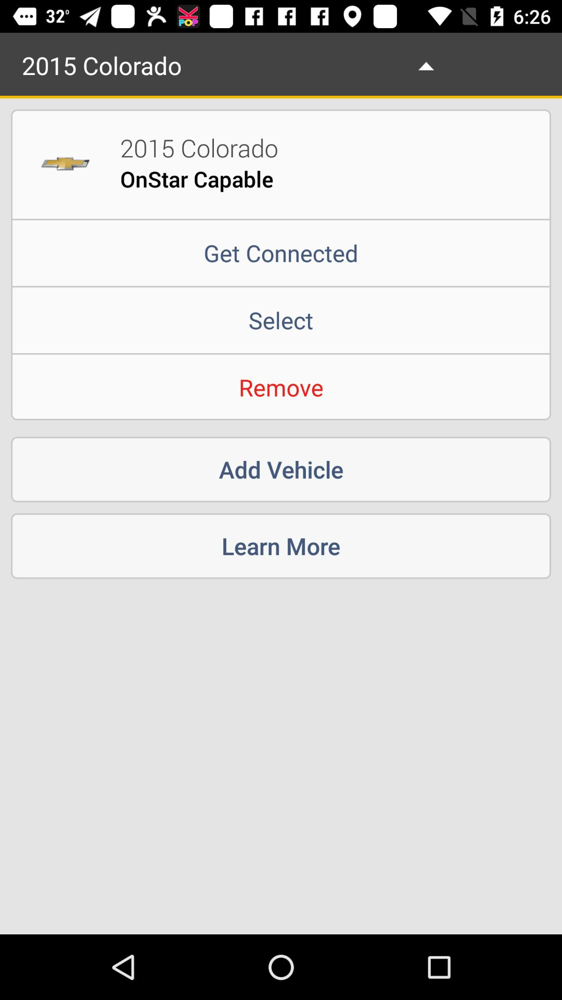

/home/toby/Screen2Vec/datasets/filtered_traces/com.gm.chevrolet.nomad.ownership/trace_0/view_hierarchies/../screenshots/183.jpg

package name:  com.gm.chevrolet.nomad.ownership
screen id:  com.gm.chevrolet.nomad.ownership-trace_0-view_hierarchies-183




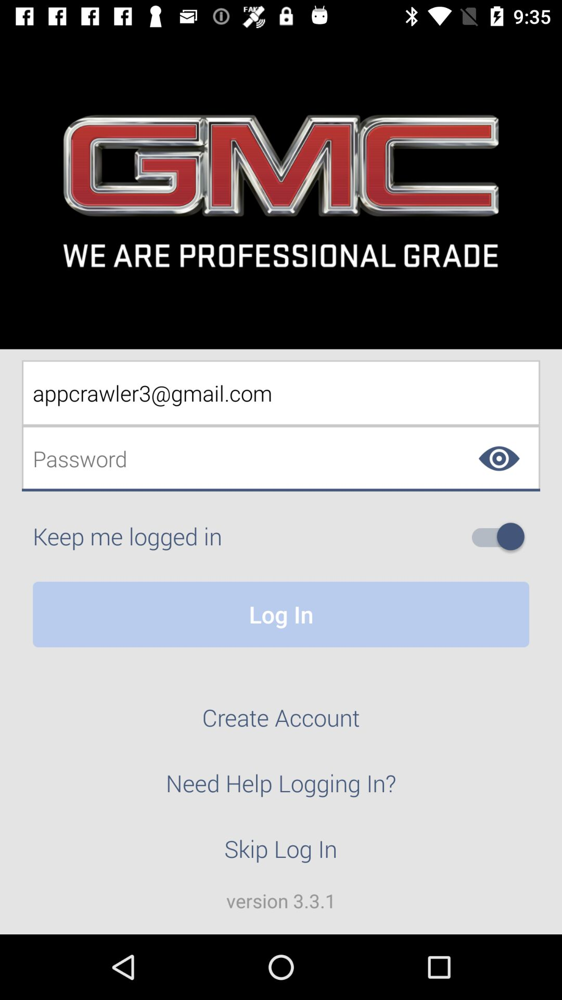

/home/toby/Screen2Vec/datasets/filtered_traces/com.gm.gmc.nomad.ownership/trace_0/view_hierarchies/../screenshots/646.jpg
score:  0.06609808975728138
model name:  screen2vec
package name:  com.gm.gmc.nomad.ownership
screen id:  com.gm.gmc.nomad.ownership-trace_0-view_hierarchies-646




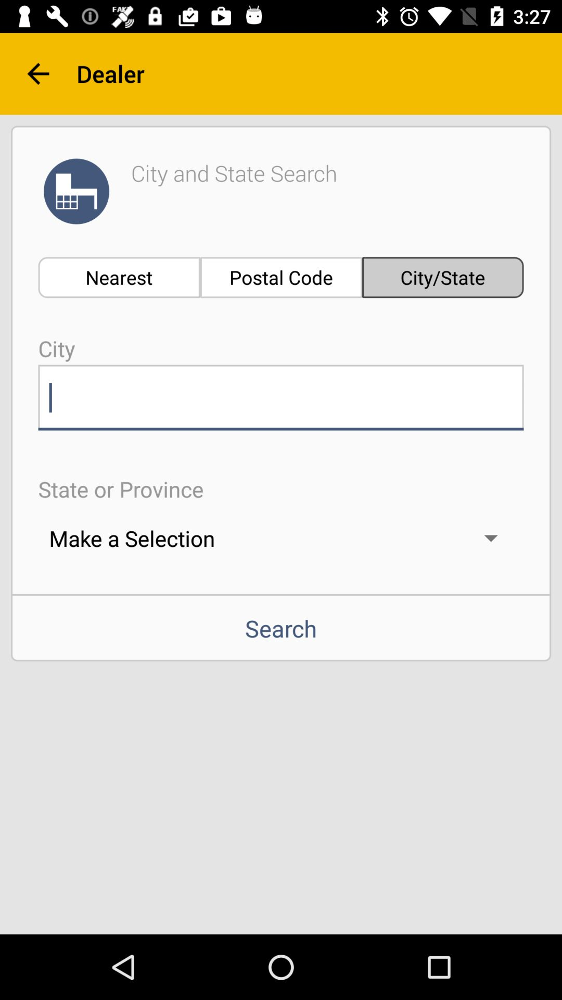

/home/toby/Screen2Vec/datasets/filtered_traces/com.gm.cadillac.nomad.ownership/trace_0/view_hierarchies/../screenshots/675.jpg
score:  0.09129699335641572
model name:  screen2vec
package name:  com.gm.cadillac.nomad.ownership
screen id:  com.gm.cadillac.nomad.ownership-trace_0-view_hierarchies-675




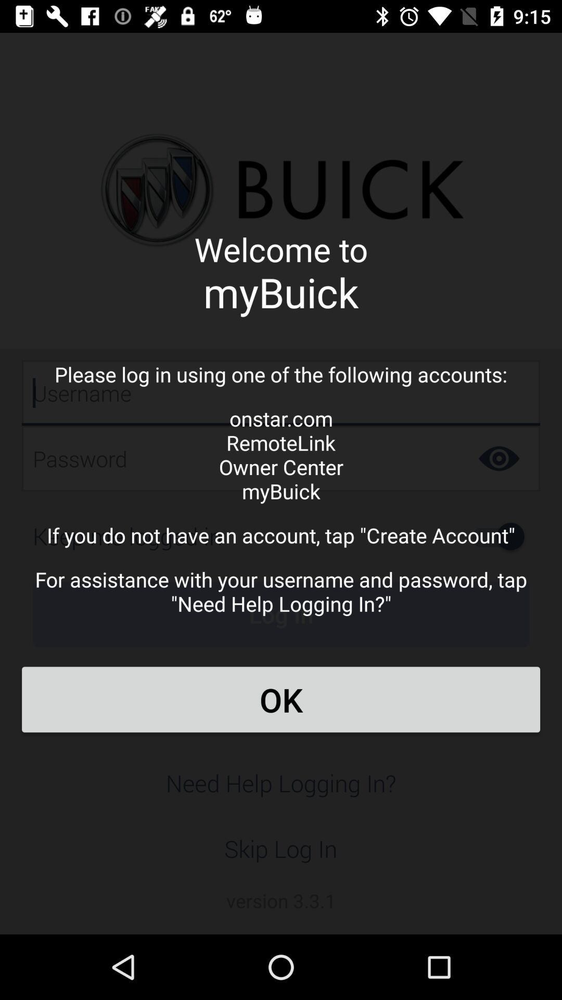

/home/toby/Screen2Vec/datasets/filtered_traces/com.gm.buick.nomad.ownership/trace_0/view_hierarchies/../screenshots/158.jpg
score:  0.09483743551291701
model name:  screen2vec
package name:  com.gm.buick.nomad.ownership
screen id:  com.gm.buick.nomad.ownership-trace_0-view_hierarchies-158




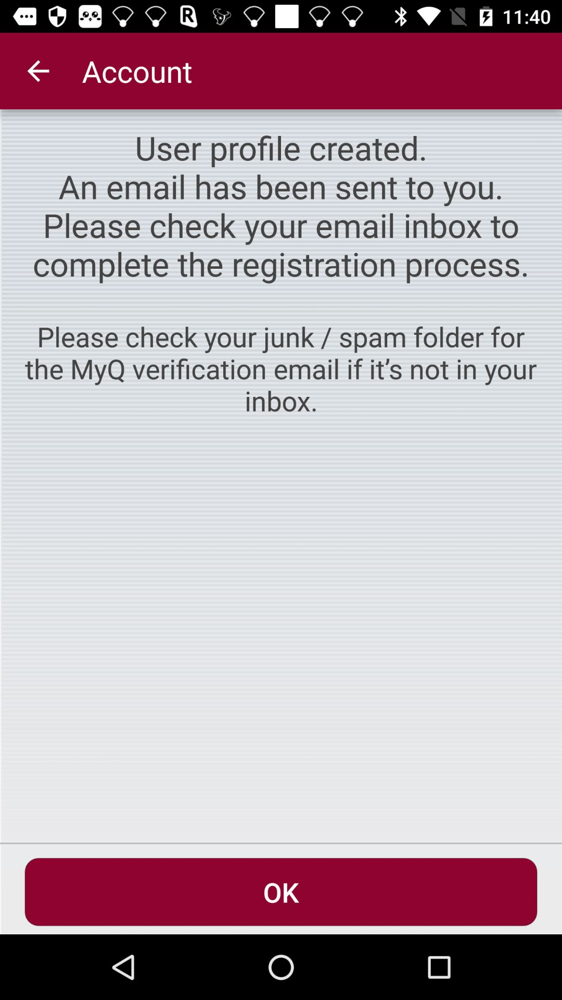

/home/toby/Screen2Vec/datasets/filtered_traces/com.chamberlain.android.liftmaster.myq/trace_0/view_hierarchies/../screenshots/328.jpg
score:  0.12973595126288473
model name:  screen2vec
package name:  com.chamberlain.android.liftmaster.myq
screen id:  com.chamberlain.android.liftmaster.myq-trace_0-view_hierarchies-328




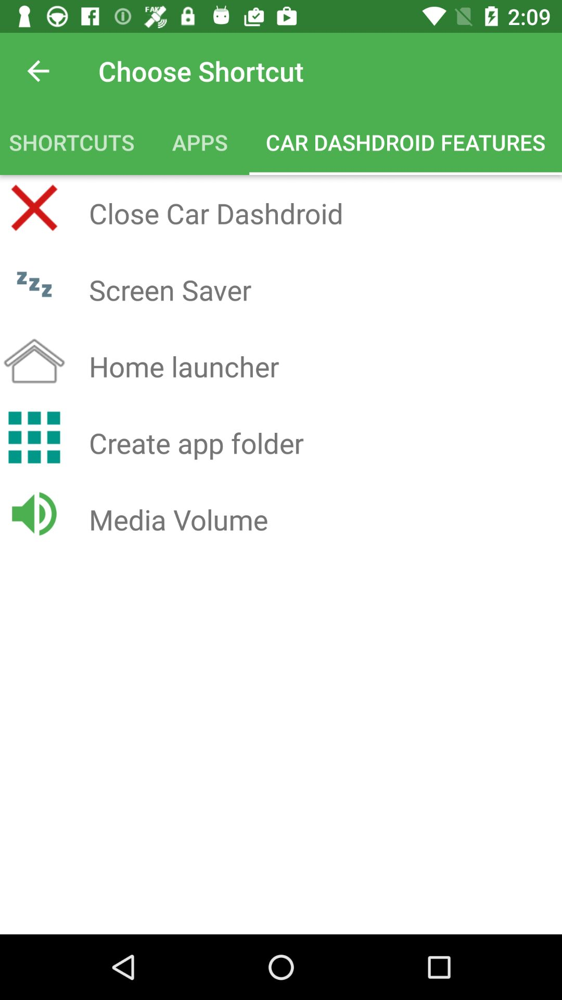

/home/toby/Screen2Vec/datasets/filtered_traces/com.nezdroid.cardashdroid/trace_0/view_hierarchies/../screenshots/403.jpg
score:  0.1319318769937472
model name:  screen2vec
package name:  com.nezdroid.cardashdroid
screen id:  com.nezdroid.cardashdroid-trace_0-view_hierarchies-403


[{'rico_id': 'com.gm.gmc.nomad.ownership/trace_0/view_hierarchies/646.json', 'score': 0.06609808975728138}, {'rico_id': 'com.gm.cadillac.nomad.ownership/trace_0/view_hierarchies/675.json', 'score': 0.09129699335641572}, {'rico_id': 'com.gm.buick.nomad.ownership/trace_0/view_hierarchies/158.json', 'score': 0.09483743551291701}, {'rico_id': 'com.chamberlain.android.liftmaster.myq/trace_0/view_hierarchies/328.json', 'score': 0.12973595126288473}, {'rico_id': 'com.nezdroid.cardashdroid/trace_0/view_hierarchies/403.json', 'score': 0.1319318769937472}] 


Source Screen:


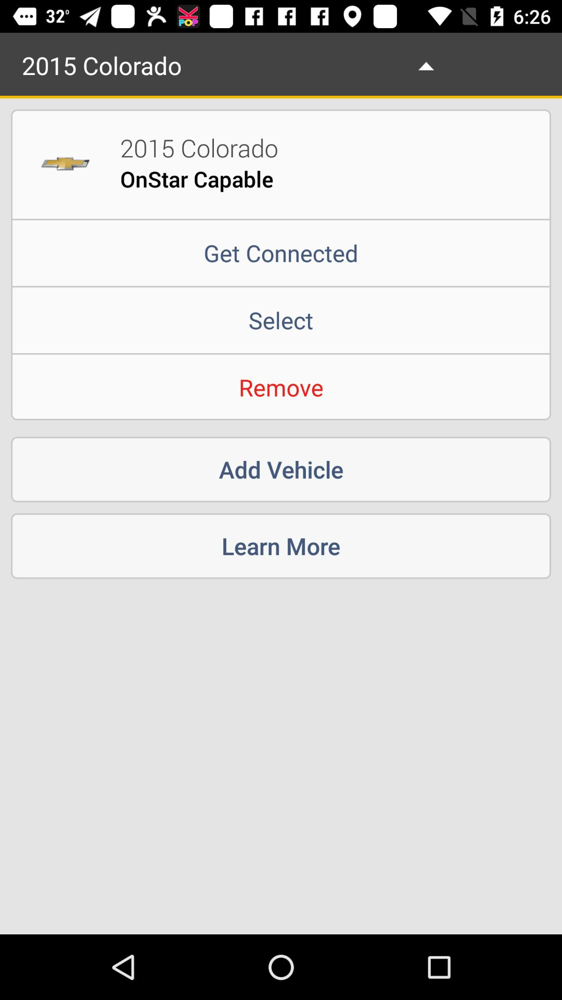

/home/toby/Screen2Vec/datasets/filtered_traces/com.gm.chevrolet.nomad.ownership/trace_0/view_hierarchies/../screenshots/183.jpg

package name:  com.gm.chevrolet.nomad.ownership
screen id:  com.gm.chevrolet.nomad.ownership-trace_0-view_hierarchies-183




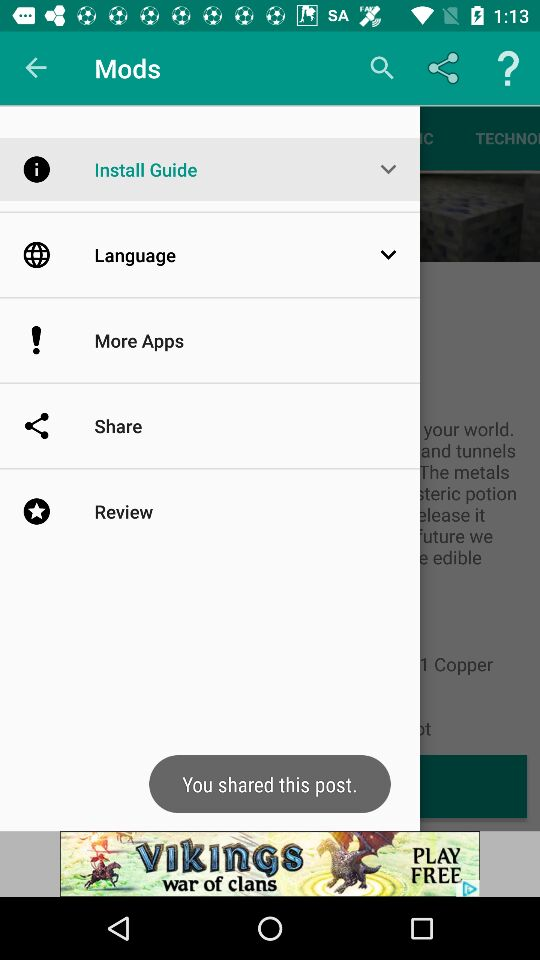

/home/toby/Screen2Vec/datasets/filtered_traces/mcpe.mods.modsforminecraft.lari/trace_0/view_hierarchies/../screenshots/2264.jpg
score:  0.038916404649102065
model name:  textonly
package name:  mcpe.mods.modsforminecraft.lari
screen id:  mcpe.mods.modsforminecraft.lari-trace_0-view_hierarchies-2264




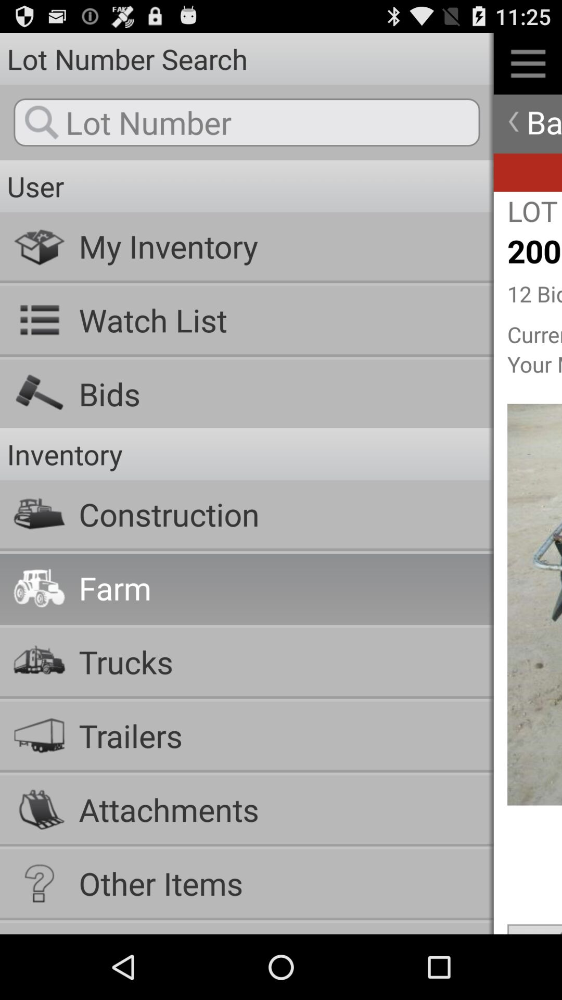

/home/toby/Screen2Vec/datasets/filtered_traces/sandhills.auctiontime.app/trace_0/view_hierarchies/../screenshots/427.jpg
score:  0.042965343541964685
model name:  textonly
package name:  sandhills.auctiontime.app
screen id:  sandhills.auctiontime.app-trace_0-view_hierarchies-427




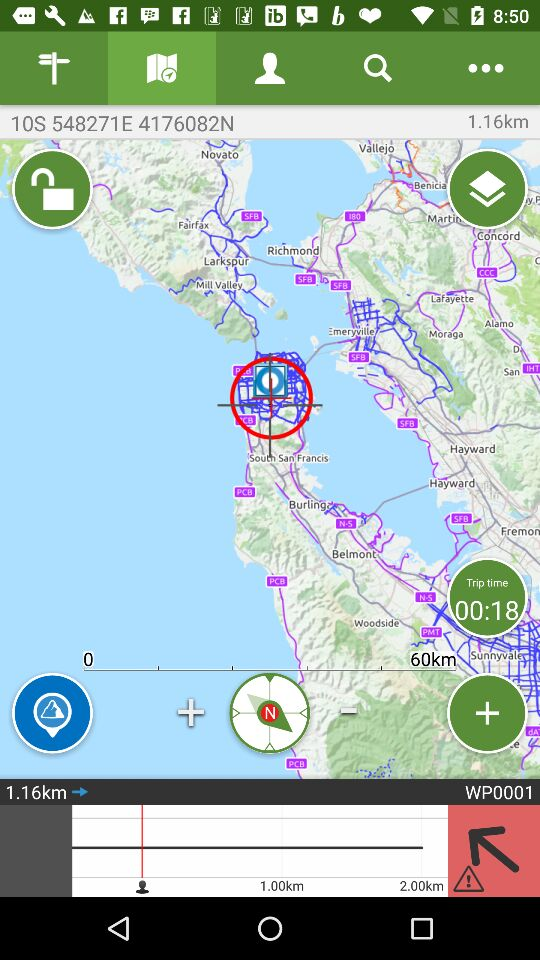

/home/toby/Screen2Vec/datasets/filtered_traces/com.augmentra.viewranger.android/trace_0/view_hierarchies/../screenshots/3199.jpg
score:  0.04449435658622469
model name:  textonly
package name:  com.augmentra.viewranger.android
screen id:  com.augmentra.viewranger.android-trace_0-view_hierarchies-3199




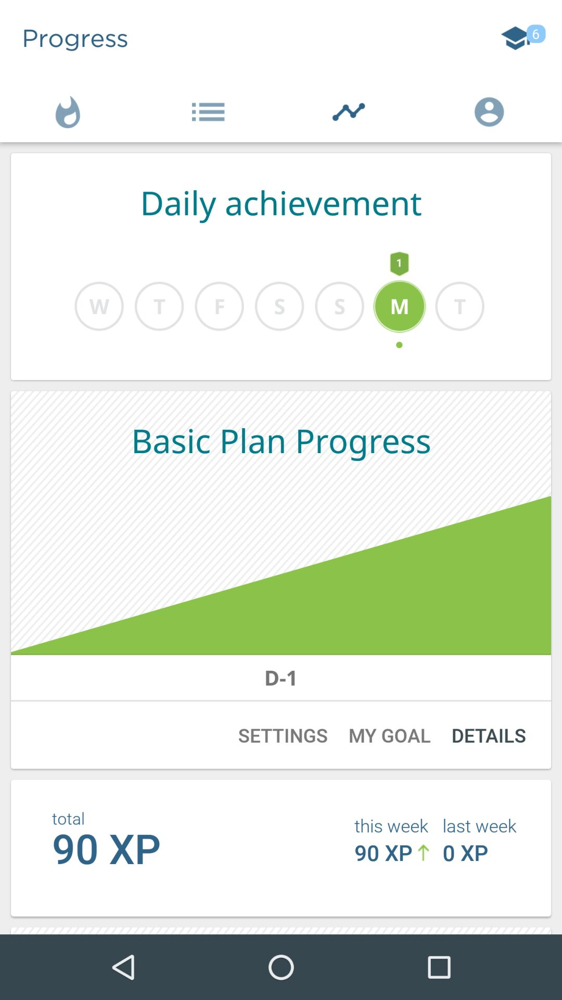

/home/toby/Screen2Vec/datasets/filtered_traces/com.eyeexamtest.eyecareplus/trace_1/view_hierarchies/../screenshots/556.jpg
score:  0.04491580060921674
model name:  textonly
package name:  com.eyeexamtest.eyecareplus
screen id:  com.eyeexamtest.eyecareplus-trace_1-view_hierarchies-556




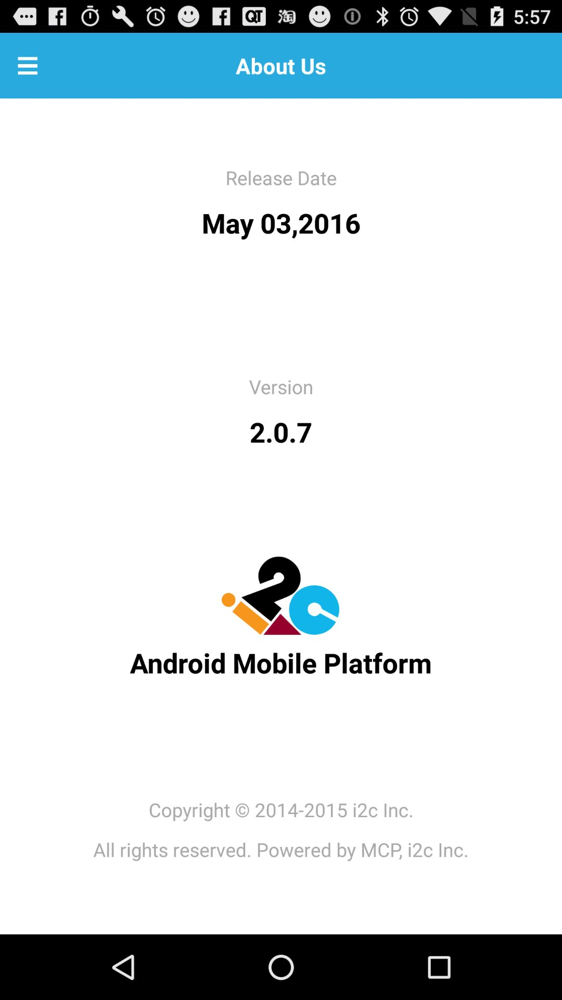

/home/toby/Screen2Vec/datasets/filtered_traces/com.i2c.mcp.achievecard/trace_0/view_hierarchies/../screenshots/253.jpg
score:  0.04494574888413516
model name:  textonly
package name:  com.i2c.mcp.achievecard
screen id:  com.i2c.mcp.achievecard-trace_0-view_hierarchies-253


[{'rico_id': 'mcpe.mods.modsforminecraft.lari/trace_0/view_hierarchies/2264.json', 'score': 0.038916404649102065}, {'rico_id': 'sandhills.auctiontime.app/trace_0/view_hierarchies/427.json', 'score': 0.042965343541964685}, {'rico_id': 'com.augmentra.viewranger.android/trace_0/view_hierarchies/3199.json', 'score': 0.04449435658622469}, {'rico_id': 'com.eyeexamtest.eyecareplus/trace_1/view_hierarchies/556.json', 'score': 0.04491580060921674}, {'rico_id': 'com.i2c.mcp.achievecard/trace_0/view_hierarchies/253.json', 'score': 0.04494574888413516}] 


Source Screen:


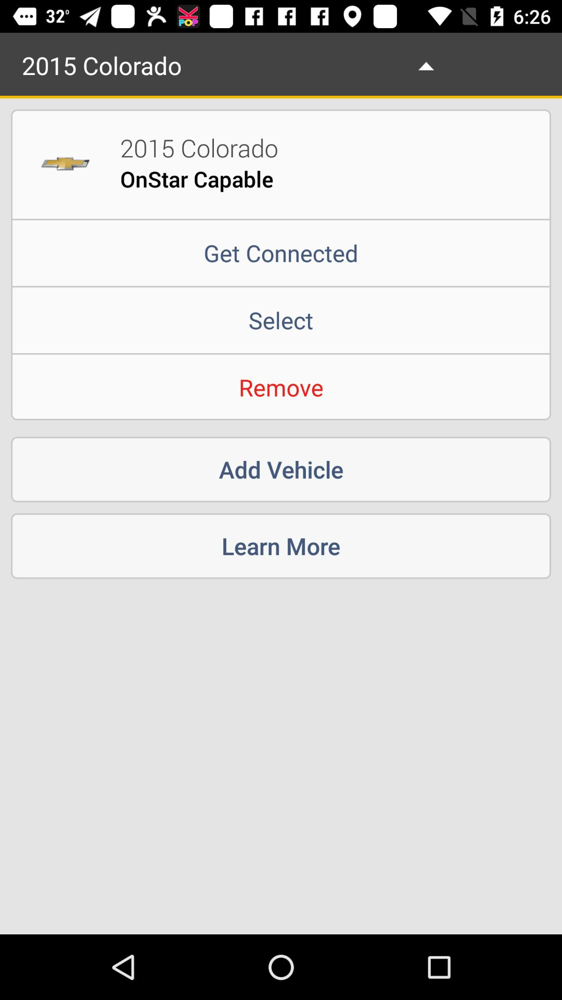

/home/toby/Screen2Vec/datasets/filtered_traces/com.gm.chevrolet.nomad.ownership/trace_0/view_hierarchies/../screenshots/183.jpg

package name:  com.gm.chevrolet.nomad.ownership
screen id:  com.gm.chevrolet.nomad.ownership-trace_0-view_hierarchies-183




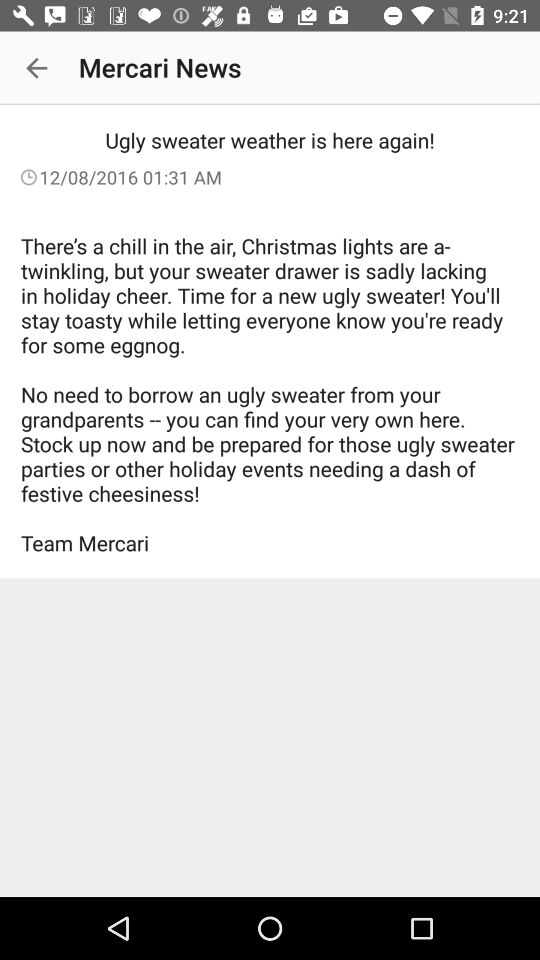

/home/toby/Screen2Vec/datasets/filtered_traces/com.mercariapp.mercari/trace_0/view_hierarchies/../screenshots/2647.jpg
score:  0.04603141590656723
model name:  layoutonly
package name:  com.mercariapp.mercari
screen id:  com.mercariapp.mercari-trace_0-view_hierarchies-2647




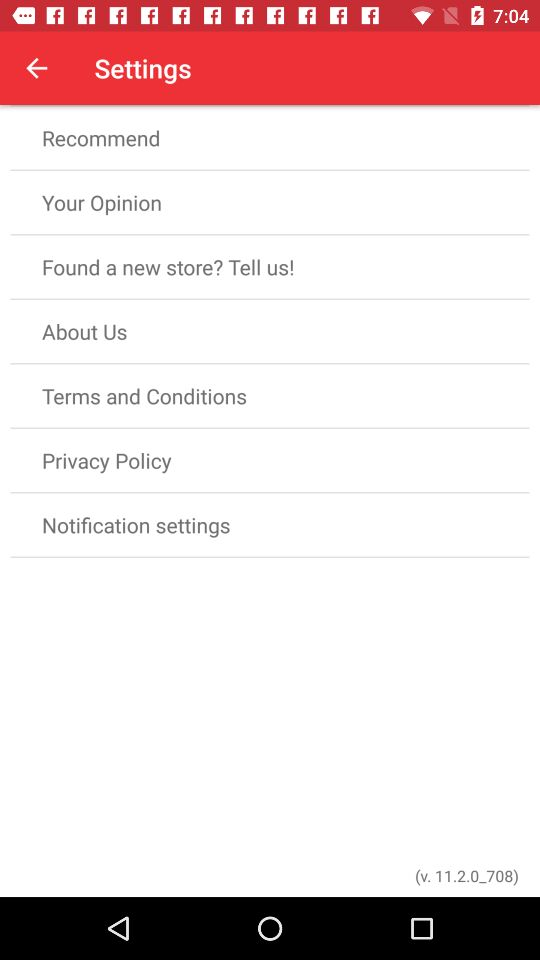

/home/toby/Screen2Vec/datasets/filtered_traces/com.retale.android/trace_0/view_hierarchies/../screenshots/1784.jpg
score:  0.051461676384864985
model name:  layoutonly
package name:  com.retale.android
screen id:  com.retale.android-trace_0-view_hierarchies-1784




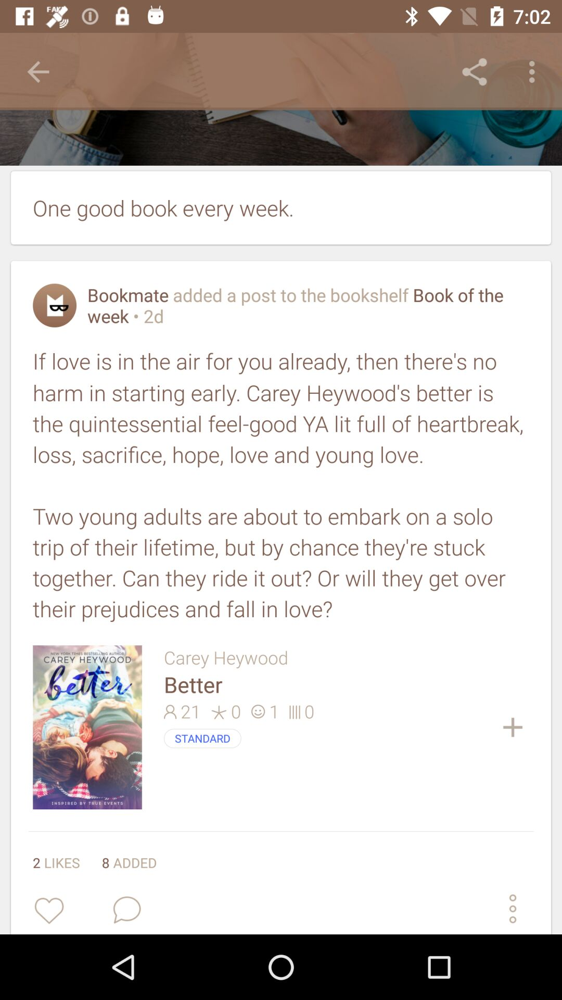

/home/toby/Screen2Vec/datasets/filtered_traces/com.bookmate/trace_0/view_hierarchies/../screenshots/737.jpg
score:  0.051590179650600976
model name:  layoutonly
package name:  com.bookmate
screen id:  com.bookmate-trace_0-view_hierarchies-737




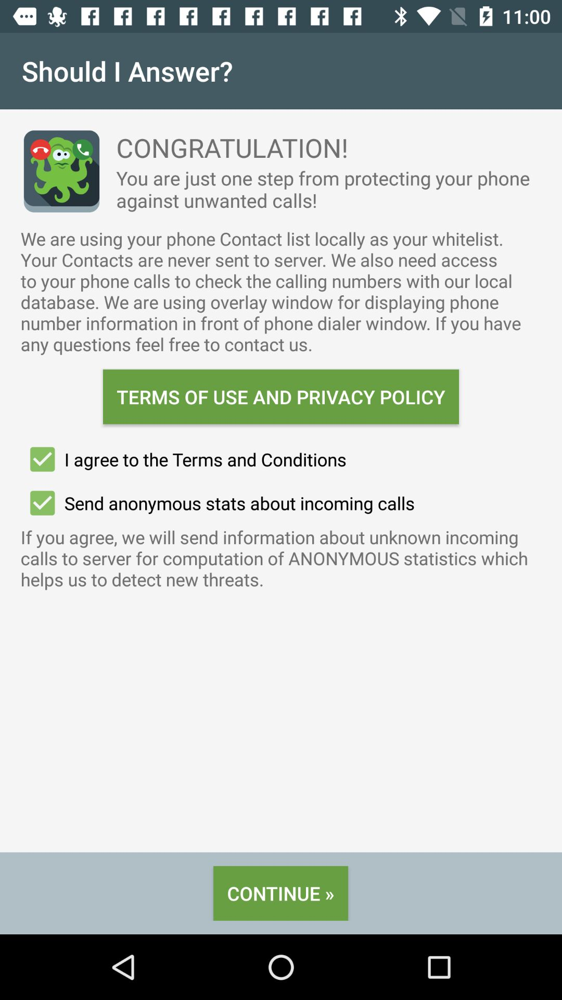

/home/toby/Screen2Vec/datasets/filtered_traces/org.mistergroup.muzutozvednout/trace_0/view_hierarchies/../screenshots/15.jpg
score:  0.055512643378821225
model name:  layoutonly
package name:  org.mistergroup.muzutozvednout
screen id:  org.mistergroup.muzutozvednout-trace_0-view_hierarchies-15




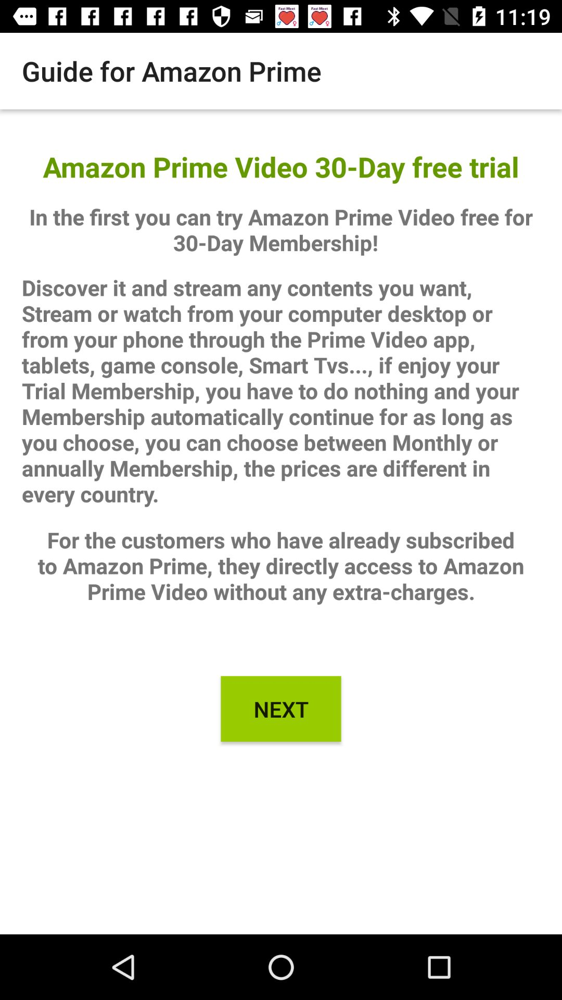

/home/toby/Screen2Vec/datasets/filtered_traces/com.guideforamazonprime/trace_0/view_hierarchies/../screenshots/504.jpg
score:  0.05635671492154004
model name:  layoutonly
package name:  com.guideforamazonprime
screen id:  com.guideforamazonprime-trace_0-view_hierarchies-504


[{'rico_id': 'com.mercariapp.mercari/trace_0/view_hierarchies/2647.json', 'score': 0.04603141590656723}, {'rico_id': 'com.retale.android/trace_0/view_hierarchies/1784.json', 'score': 0.051461676384864985}, {'rico_id': 'com.bookmate/trace_0/view_hierarchies/737.json', 'score': 0.051590179650600976}, {'rico_id': 'org.mistergroup.muzutozvednout/trace_0/view_hierarchies/15.json', 'score': 0.055512643378821225}, {'rico_id': 'com.guideforamazonprime/trace_0/view_hierarchies/504.json', 'score': 0.05635671492154004}] 


Source Screen:


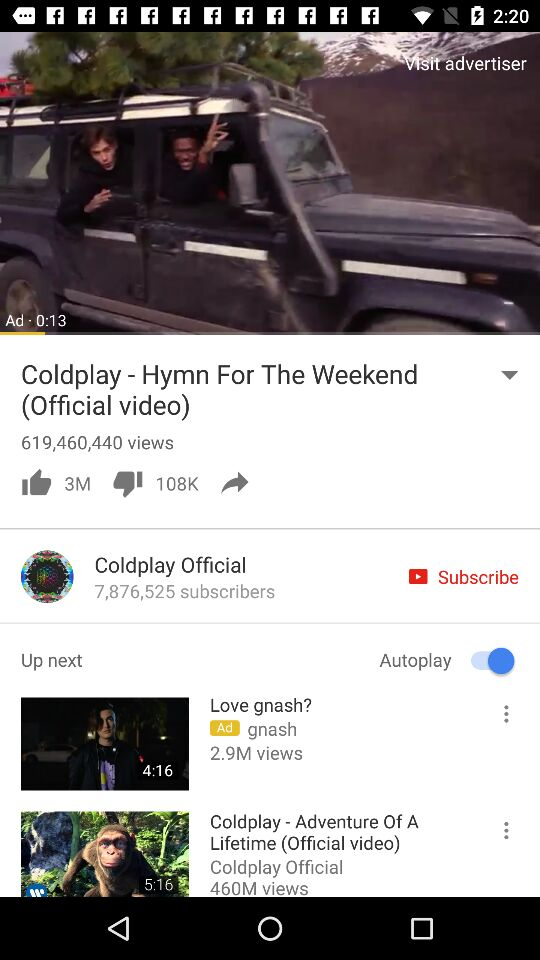

/home/toby/Screen2Vec/datasets/filtered_traces/com.google.android.youtube/trace_0/view_hierarchies/../screenshots/334.jpg

package name:  com.google.android.youtube
screen id:  com.google.android.youtube-trace_0-view_hierarchies-334




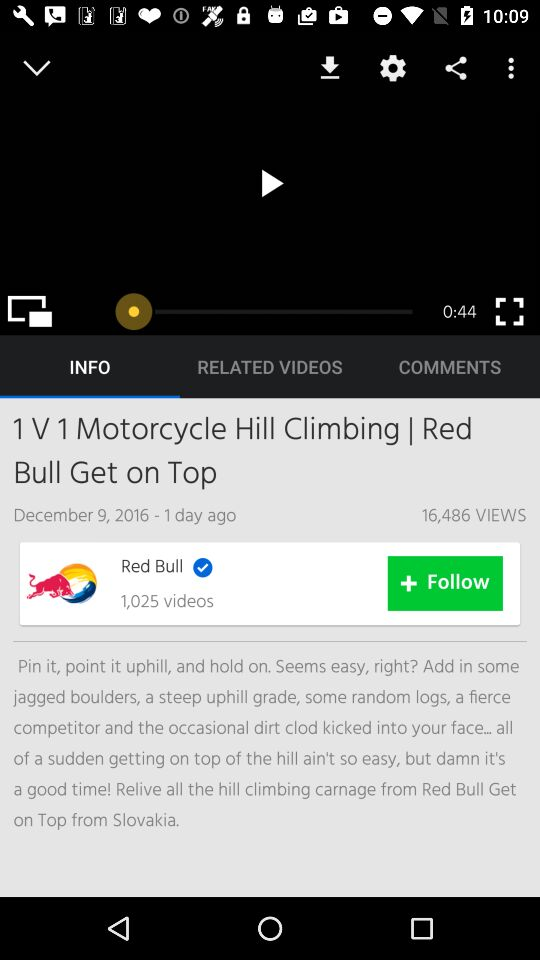

/home/toby/Screen2Vec/datasets/filtered_traces/com.dailymotion.dailymotion/trace_1/view_hierarchies/../screenshots/825.jpg
score:  0.11478226412858472
model name:  screen2vec
package name:  com.dailymotion.dailymotion
screen id:  com.dailymotion.dailymotion-trace_1-view_hierarchies-825




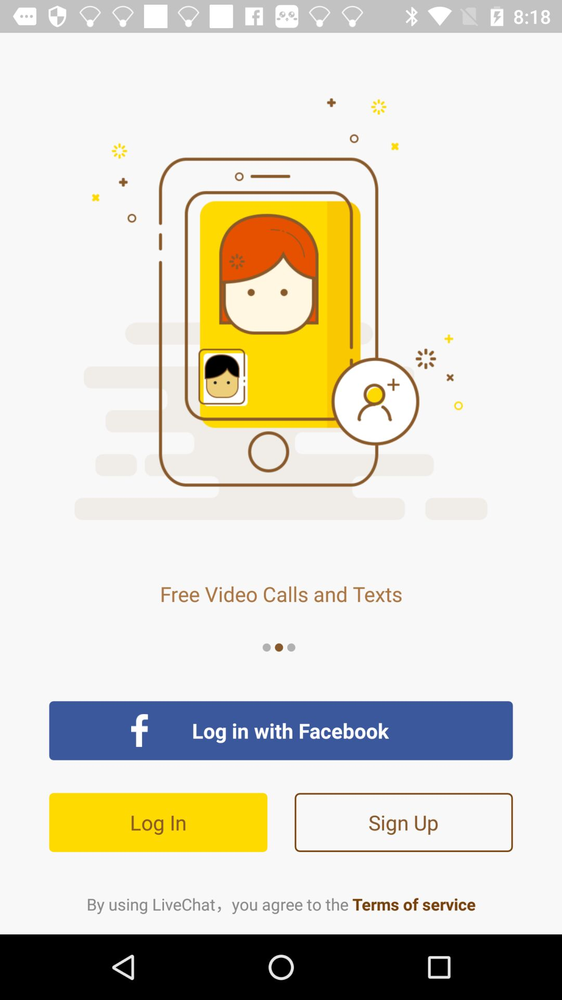

/home/toby/Screen2Vec/datasets/filtered_traces/com.rcplatform.livechat/trace_0/view_hierarchies/../screenshots/25.jpg
score:  0.12484154828739158
model name:  screen2vec
package name:  com.rcplatform.livechat
screen id:  com.rcplatform.livechat-trace_0-view_hierarchies-25




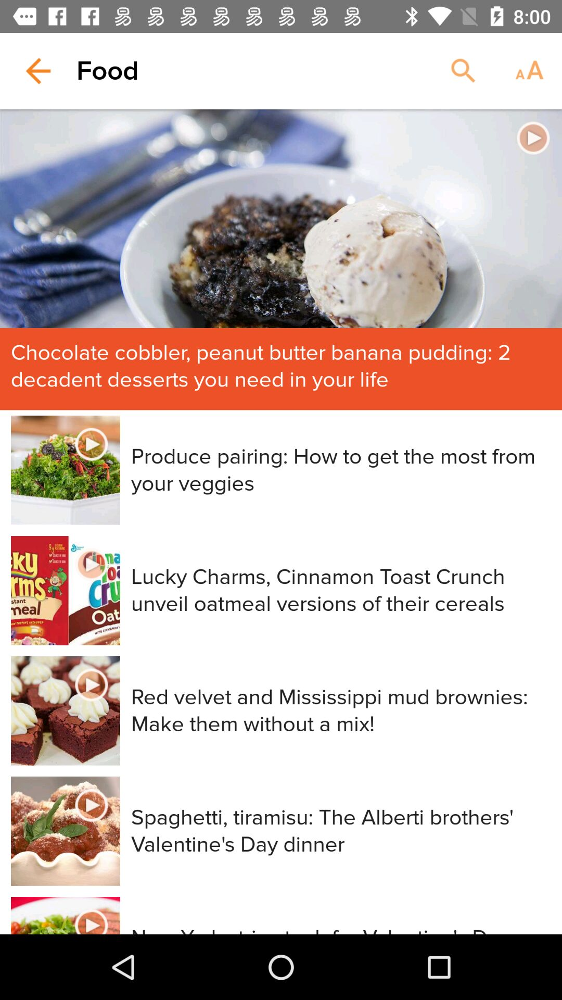

/home/toby/Screen2Vec/datasets/filtered_traces/com.nbcnews.today/trace_0/view_hierarchies/../screenshots/196.jpg
score:  0.128210518533164
model name:  screen2vec
package name:  com.nbcnews.today
screen id:  com.nbcnews.today-trace_0-view_hierarchies-196




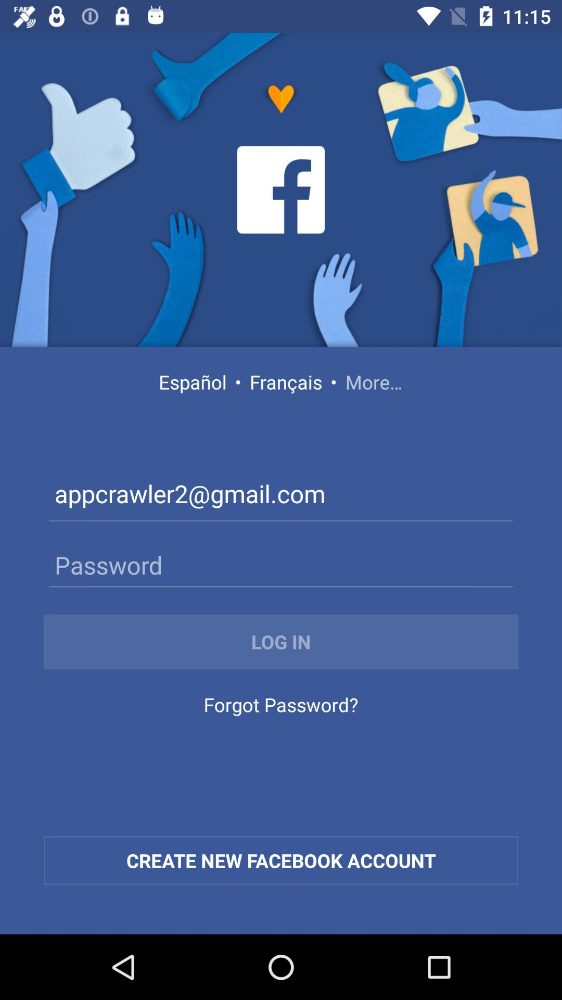

/home/toby/Screen2Vec/datasets/filtered_traces/com.facebook.katana/trace_0/view_hierarchies/../screenshots/117.jpg
score:  0.12841505356527594
model name:  screen2vec
package name:  com.facebook.katana
screen id:  com.facebook.katana-trace_0-view_hierarchies-117




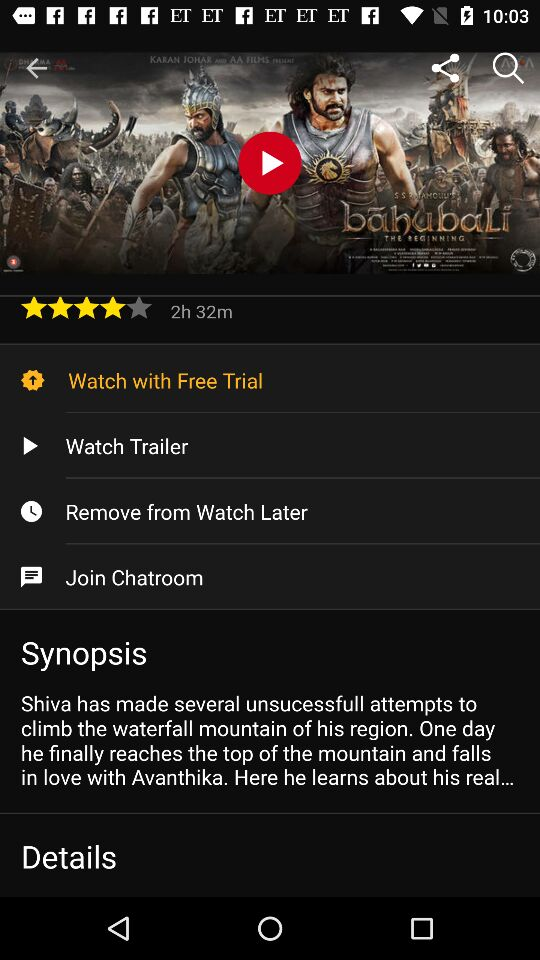

/home/toby/Screen2Vec/datasets/filtered_traces/com.spuul.android/trace_0/view_hierarchies/../screenshots/3410.jpg
score:  0.13616565799400915
model name:  screen2vec
package name:  com.spuul.android
screen id:  com.spuul.android-trace_0-view_hierarchies-3410


[{'rico_id': 'com.dailymotion.dailymotion/trace_1/view_hierarchies/825.json', 'score': 0.11478226412858472}, {'rico_id': 'com.rcplatform.livechat/trace_0/view_hierarchies/25.json', 'score': 0.12484154828739158}, {'rico_id': 'com.nbcnews.today/trace_0/view_hierarchies/196.json', 'score': 0.128210518533164}, {'rico_id': 'com.facebook.katana/trace_0/view_hierarchies/117.json', 'score': 0.12841505356527594}, {'rico_id': 'com.spuul.android/trace_0/view_hierarchies/3410.json', 'score': 0.13616565799400915}] 


Source Screen:


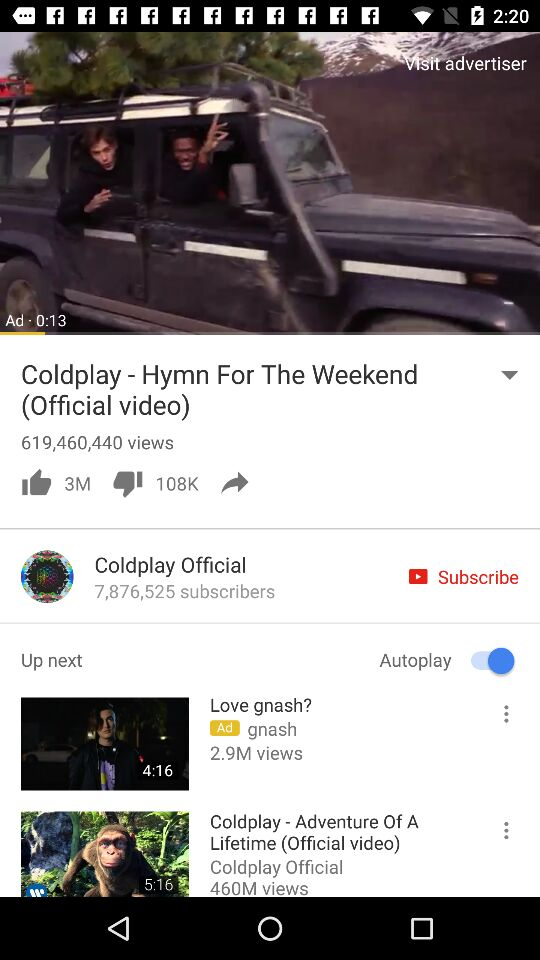

/home/toby/Screen2Vec/datasets/filtered_traces/com.google.android.youtube/trace_0/view_hierarchies/../screenshots/334.jpg

package name:  com.google.android.youtube
screen id:  com.google.android.youtube-trace_0-view_hierarchies-334




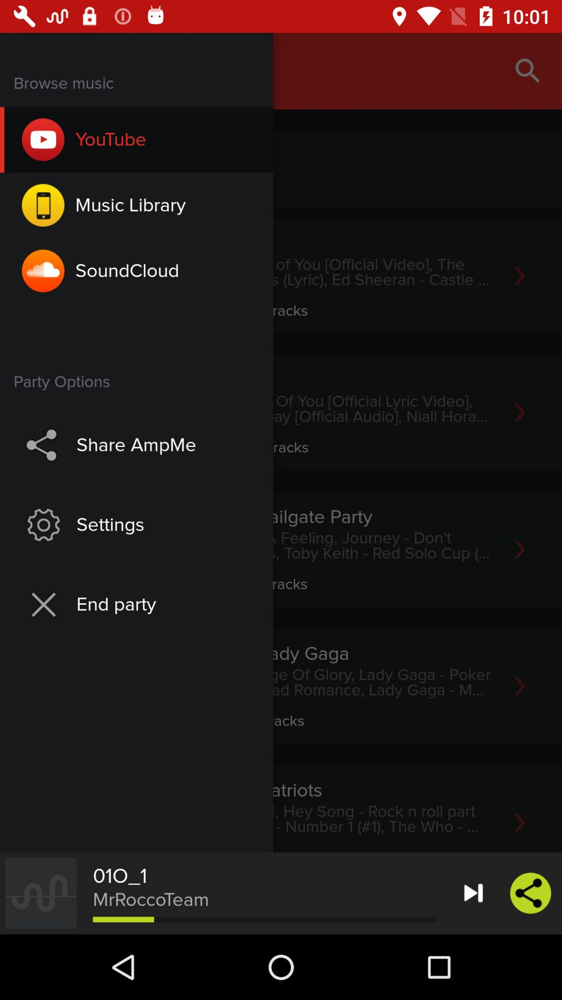

/home/toby/Screen2Vec/datasets/filtered_traces/com.amp.android/trace_0/view_hierarchies/../screenshots/1206.jpg
score:  0.04412560116719988
model name:  textonly
package name:  com.amp.android
screen id:  com.amp.android-trace_0-view_hierarchies-1206




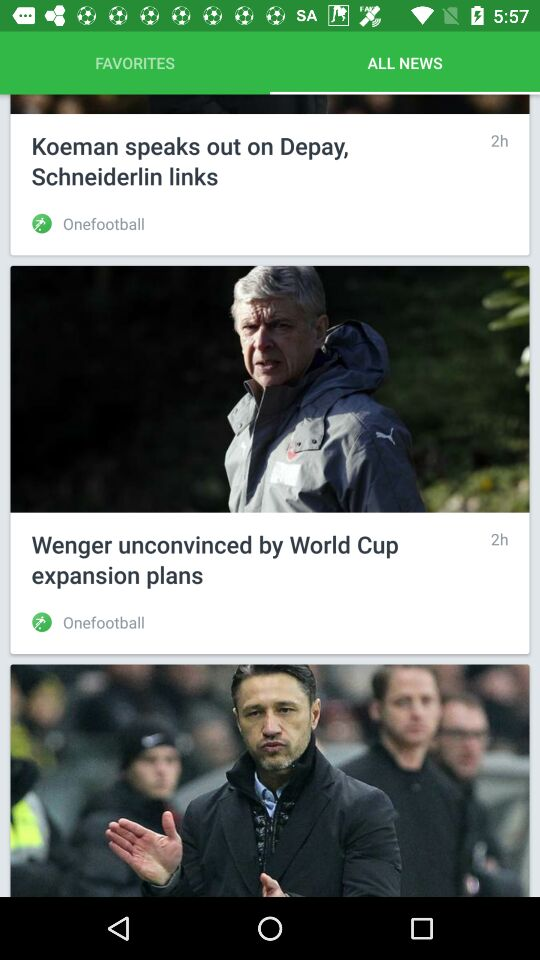

/home/toby/Screen2Vec/datasets/filtered_traces/de.motain.iliga/trace_1/view_hierarchies/../screenshots/1773.jpg
score:  0.04576002585500982
model name:  textonly
package name:  de.motain.iliga
screen id:  de.motain.iliga-trace_1-view_hierarchies-1773




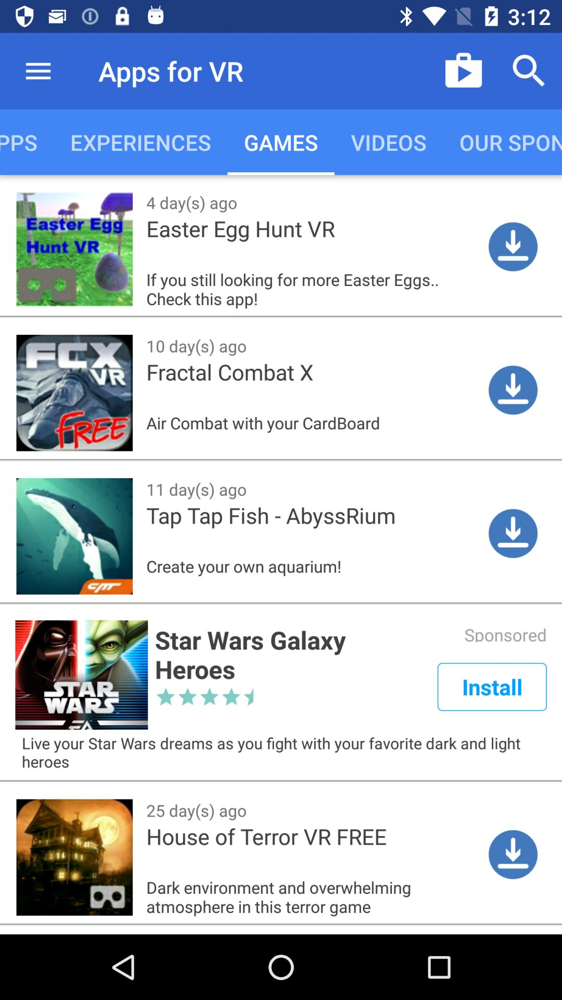

/home/toby/Screen2Vec/datasets/filtered_traces/com.acowboys.cardboardvr/trace_0/view_hierarchies/../screenshots/86.jpg
score:  0.04624178425460168
model name:  textonly
package name:  com.acowboys.cardboardvr
screen id:  com.acowboys.cardboardvr-trace_0-view_hierarchies-86




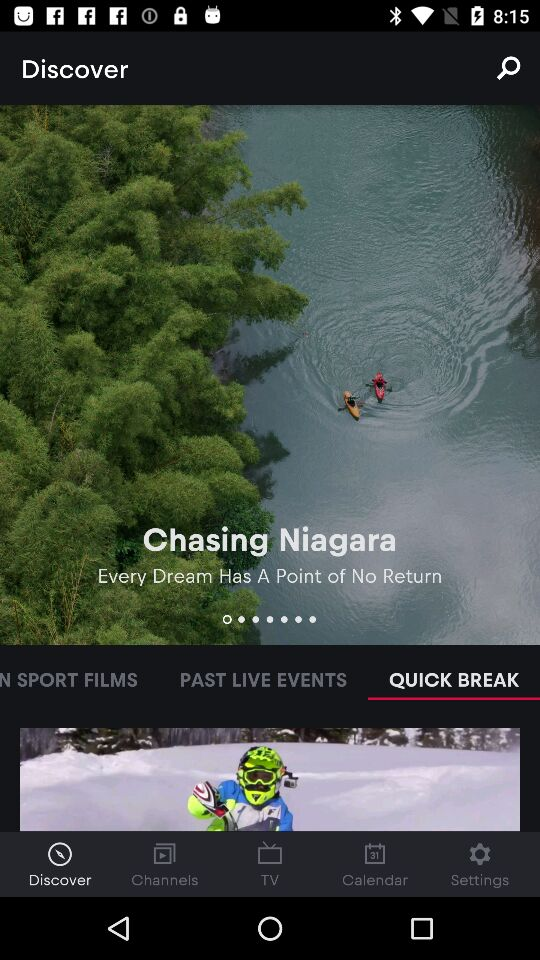

/home/toby/Screen2Vec/datasets/filtered_traces/com.nousguide.android.rbtv/trace_1/view_hierarchies/../screenshots/187.jpg
score:  0.04697293799523328
model name:  textonly
package name:  com.nousguide.android.rbtv
screen id:  com.nousguide.android.rbtv-trace_1-view_hierarchies-187




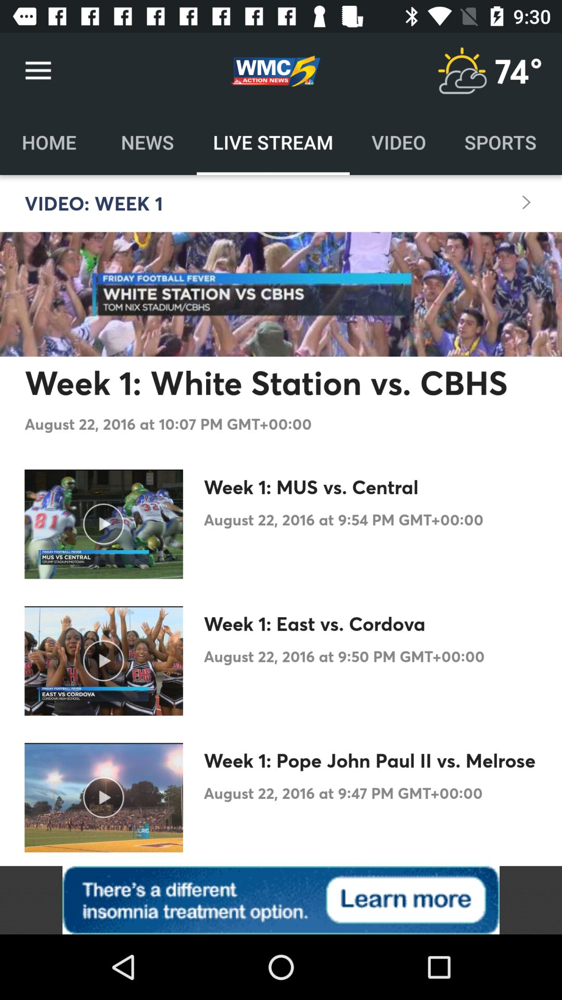

/home/toby/Screen2Vec/datasets/filtered_traces/com.raycom.wmc/trace_0/view_hierarchies/../screenshots/1099.jpg
score:  0.04712026098670552
model name:  textonly
package name:  com.raycom.wmc
screen id:  com.raycom.wmc-trace_0-view_hierarchies-1099


[{'rico_id': 'com.amp.android/trace_0/view_hierarchies/1206.json', 'score': 0.04412560116719988}, {'rico_id': 'de.motain.iliga/trace_1/view_hierarchies/1773.json', 'score': 0.04576002585500982}, {'rico_id': 'com.acowboys.cardboardvr/trace_0/view_hierarchies/86.json', 'score': 0.04624178425460168}, {'rico_id': 'com.nousguide.android.rbtv/trace_1/view_hierarchies/187.json', 'score': 0.04697293799523328}, {'rico_id': 'com.raycom.wmc/trace_0/view_hierarchies/1099.json', 'score': 0.04712026098670552}] 


Source Screen:


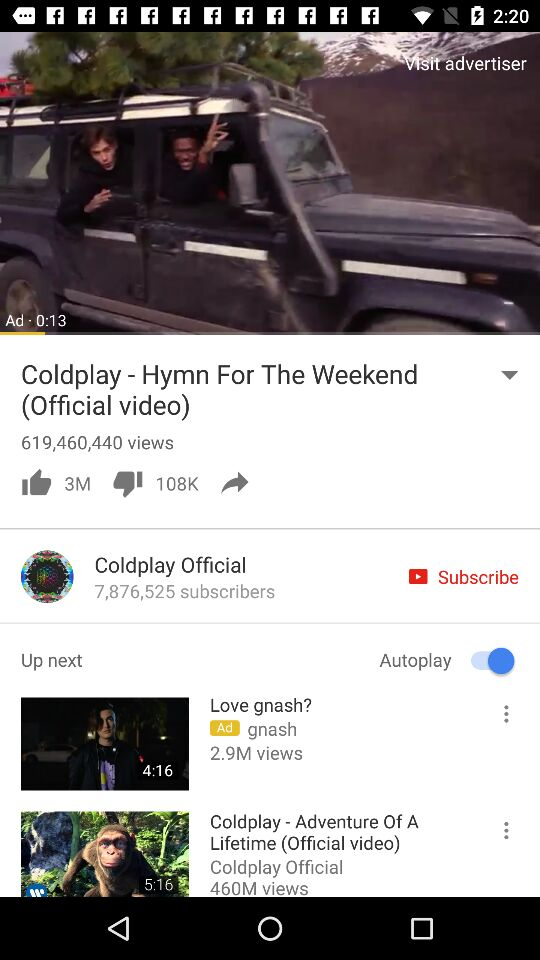

/home/toby/Screen2Vec/datasets/filtered_traces/com.google.android.youtube/trace_0/view_hierarchies/../screenshots/334.jpg

package name:  com.google.android.youtube
screen id:  com.google.android.youtube-trace_0-view_hierarchies-334




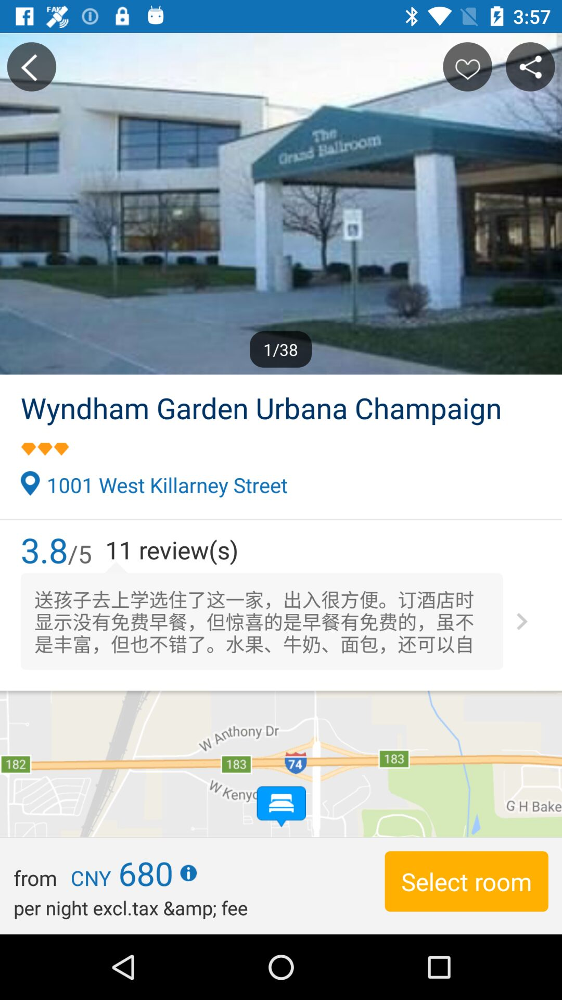

/home/toby/Screen2Vec/datasets/filtered_traces/ctrip.english/trace_0/view_hierarchies/../screenshots/385.jpg
score:  0.06731886530701736
model name:  layoutonly
package name:  ctrip.english
screen id:  ctrip.english-trace_0-view_hierarchies-385




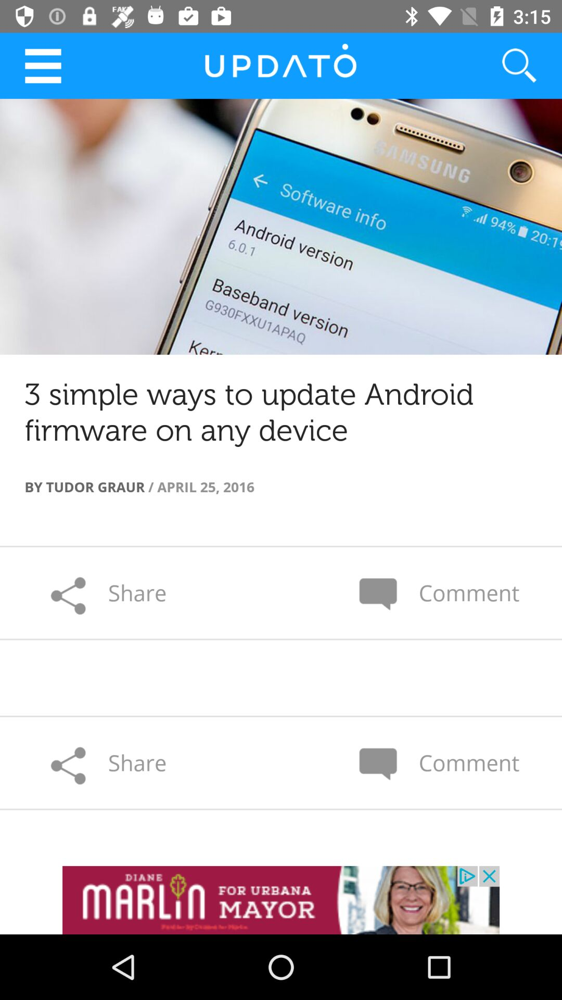

/home/toby/Screen2Vec/datasets/filtered_traces/samsungupdate.com/trace_0/view_hierarchies/../screenshots/592.jpg
score:  0.0717384128565196
model name:  layoutonly
package name:  samsungupdate.com
screen id:  samsungupdate.com-trace_0-view_hierarchies-592




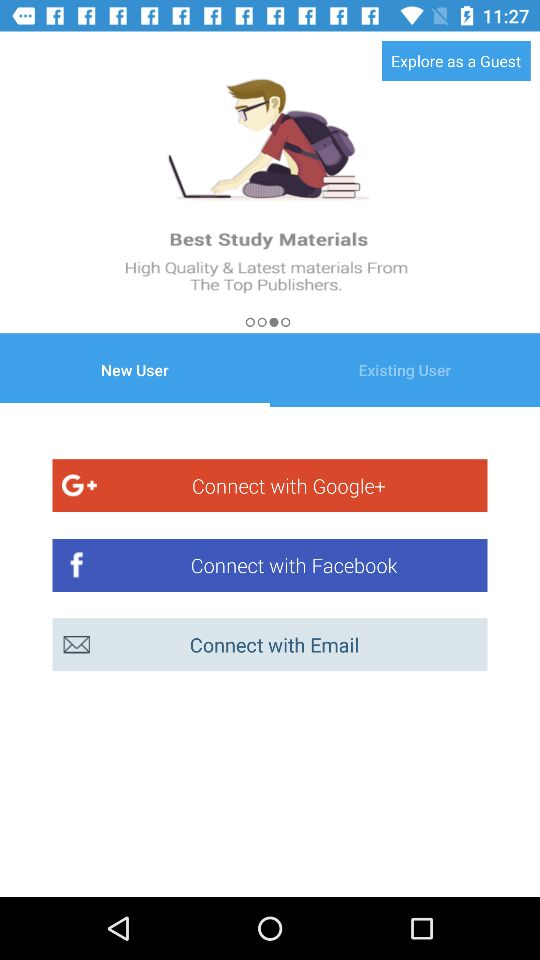

/home/toby/Screen2Vec/datasets/filtered_traces/com.hinkhoj.questionbank/trace_0/view_hierarchies/../screenshots/41.jpg
score:  0.07286492435803427
model name:  layoutonly
package name:  com.hinkhoj.questionbank
screen id:  com.hinkhoj.questionbank-trace_0-view_hierarchies-41




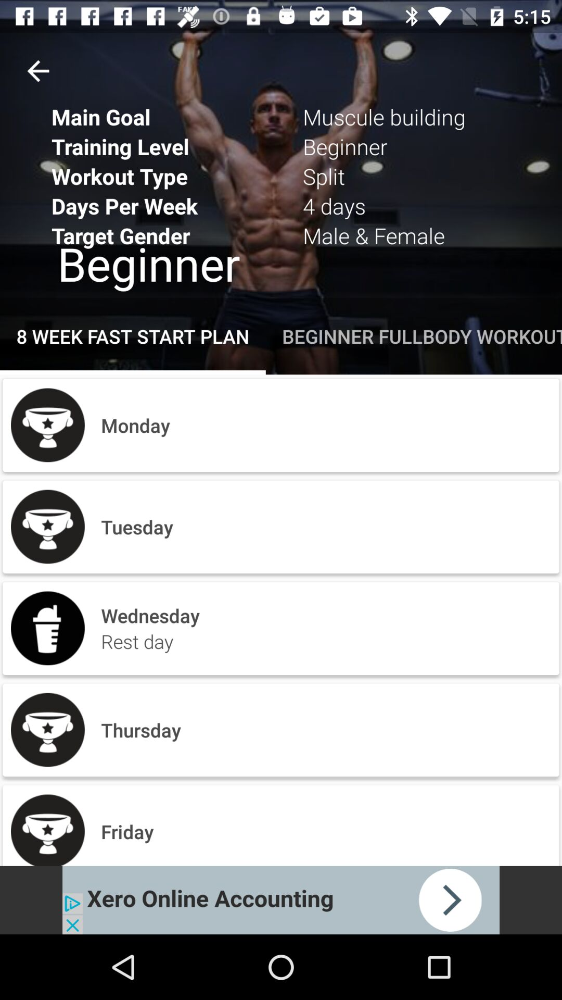

/home/toby/Screen2Vec/datasets/filtered_traces/ru.adhocapp.gymapp/trace_0/view_hierarchies/../screenshots/632.jpg
score:  0.07564511749001468
model name:  layoutonly
package name:  ru.adhocapp.gymapp
screen id:  ru.adhocapp.gymapp-trace_0-view_hierarchies-632




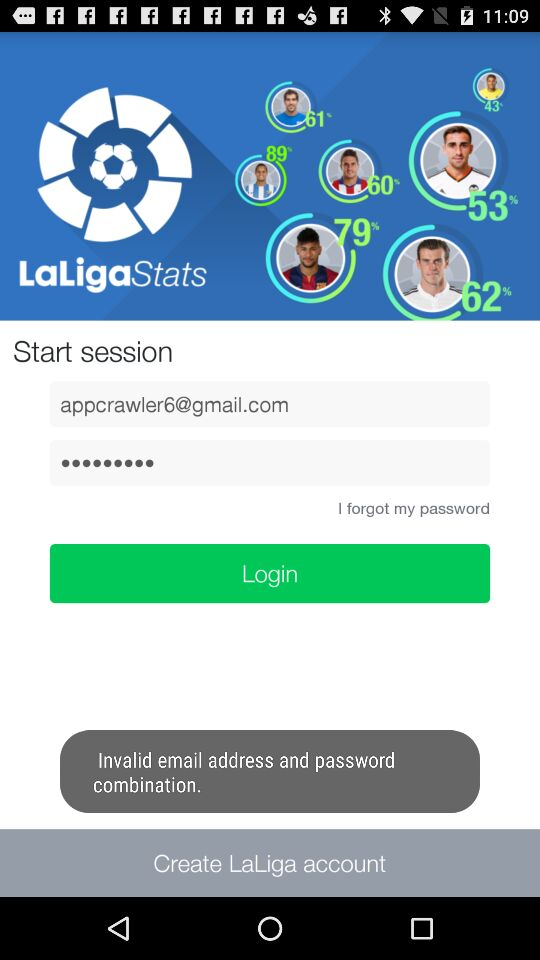

/home/toby/Screen2Vec/datasets/filtered_traces/es.ligabbva.gi.main/trace_1/view_hierarchies/../screenshots/494.jpg
score:  0.07738230382815037
model name:  layoutonly
package name:  es.ligabbva.gi.main
screen id:  es.ligabbva.gi.main-trace_1-view_hierarchies-494


[{'rico_id': 'ctrip.english/trace_0/view_hierarchies/385.json', 'score': 0.06731886530701736}, {'rico_id': 'samsungupdate.com/trace_0/view_hierarchies/592.json', 'score': 0.0717384128565196}, {'rico_id': 'com.hinkhoj.questionbank/trace_0/view_hierarchies/41.json', 'score': 0.07286492435803427}, {'rico_id': 'ru.adhocapp.gymapp/trace_0/view_hierarchies/632.json', 'score': 0.07564511749001468}, {'rico_id': 'es.ligabbva.gi.main/trace_1/view_hierarchies/494.json', 'score': 0.07738230382815037}] 


Source Screen:


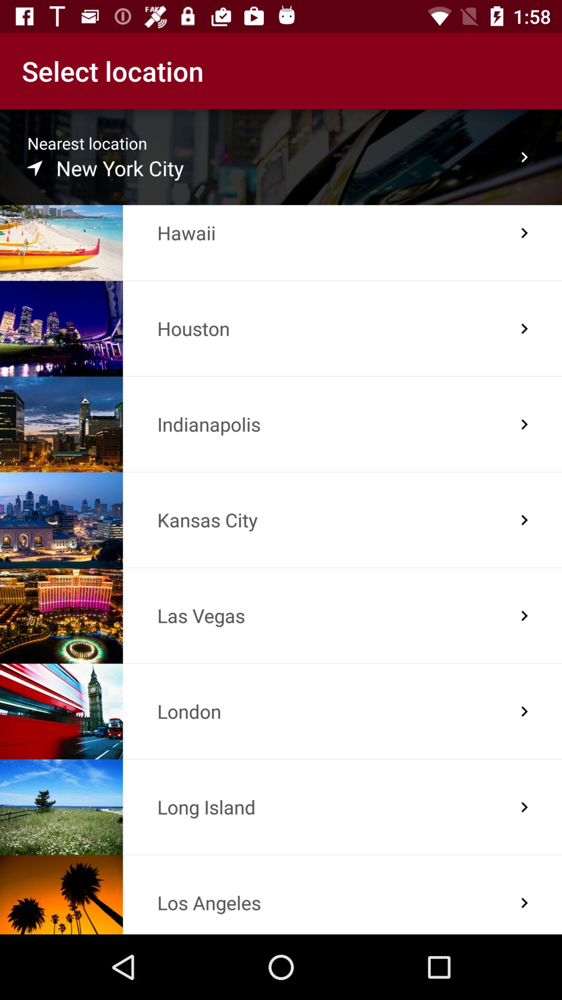

/home/toby/Screen2Vec/datasets/filtered_traces/com.google.zagat/trace_0/view_hierarchies/../screenshots/101.jpg

package name:  com.google.zagat
screen id:  com.google.zagat-trace_0-view_hierarchies-101




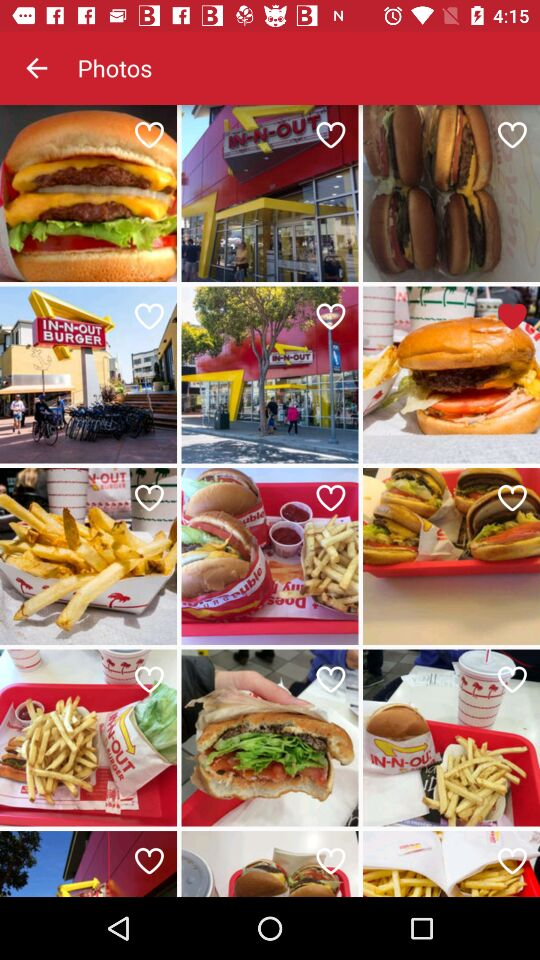

/home/toby/Screen2Vec/datasets/filtered_traces/com.application.zomato/trace_0/view_hierarchies/../screenshots/1621.jpg
score:  0.08133647022170476
model name:  screen2vec
package name:  com.application.zomato
screen id:  com.application.zomato-trace_0-view_hierarchies-1621




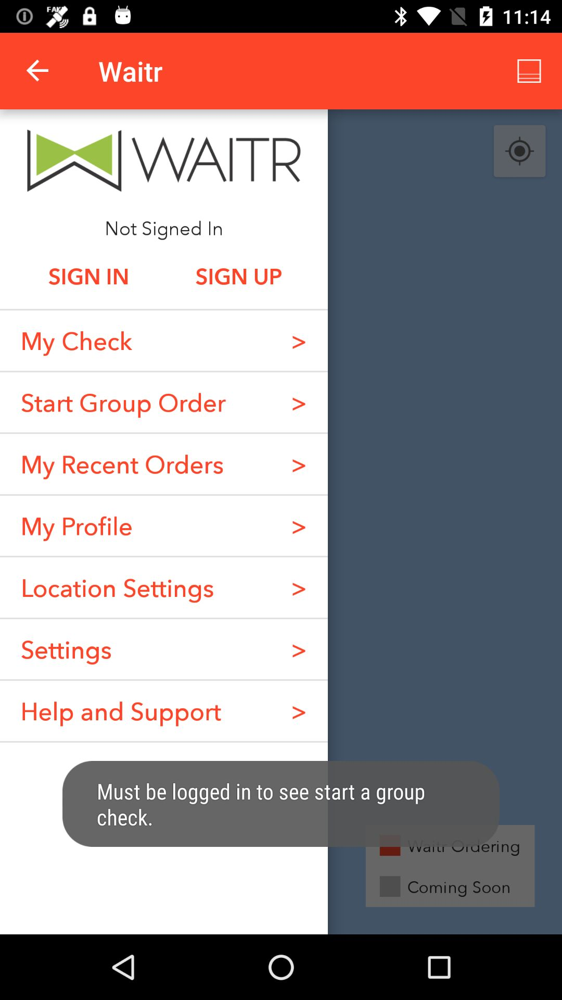

/home/toby/Screen2Vec/datasets/filtered_traces/com.waitrapp/trace_0/view_hierarchies/../screenshots/2212.jpg
score:  0.08949162132186828
model name:  screen2vec
package name:  com.waitrapp
screen id:  com.waitrapp-trace_0-view_hierarchies-2212




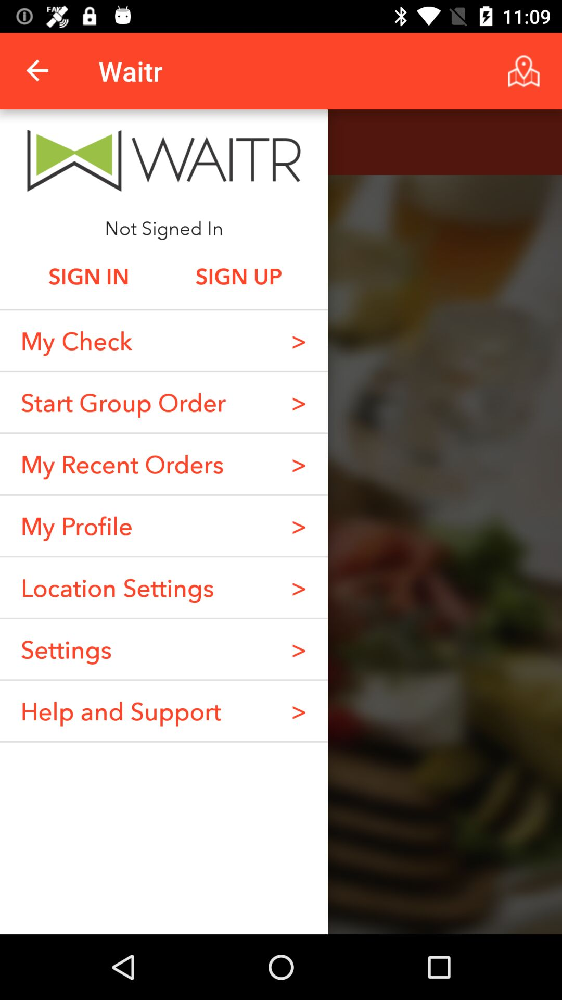

/home/toby/Screen2Vec/datasets/filtered_traces/com.waitrapp/trace_0/view_hierarchies/../screenshots/432.jpg
score:  0.09303607457506147
model name:  screen2vec
package name:  com.waitrapp
screen id:  com.waitrapp-trace_0-view_hierarchies-432




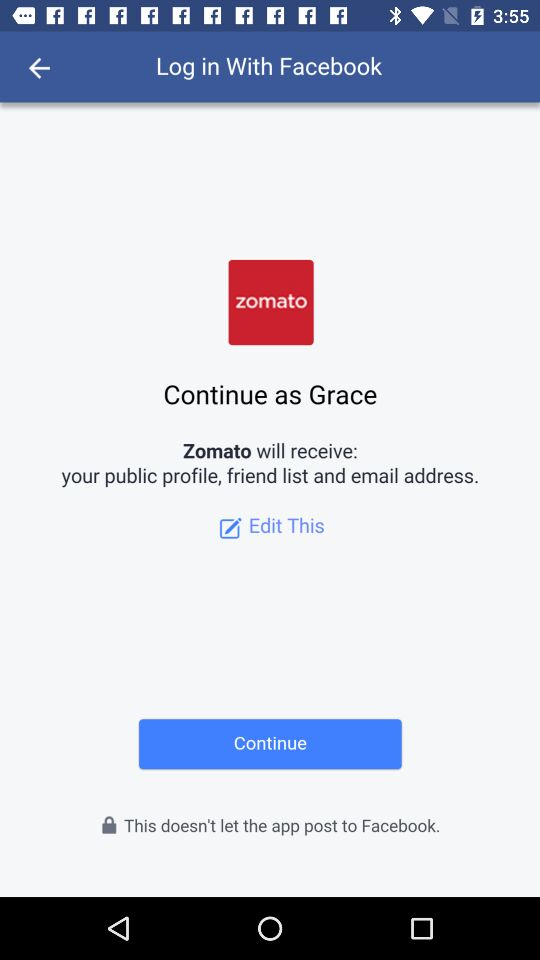

/home/toby/Screen2Vec/datasets/filtered_traces/com.application.zomato/trace_1/view_hierarchies/../screenshots/333.jpg
score:  0.11749693277676365
model name:  screen2vec
package name:  com.application.zomato
screen id:  com.application.zomato-trace_1-view_hierarchies-333




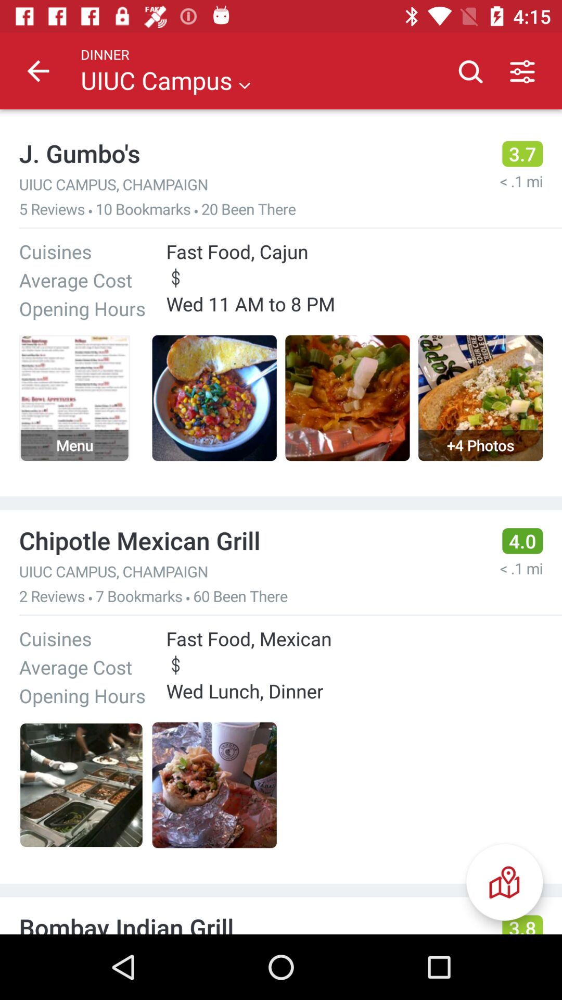

/home/toby/Screen2Vec/datasets/filtered_traces/com.application.zomato/trace_2/view_hierarchies/../screenshots/221.jpg
score:  0.11877526076494482
model name:  screen2vec
package name:  com.application.zomato
screen id:  com.application.zomato-trace_2-view_hierarchies-221


[{'rico_id': 'com.application.zomato/trace_0/view_hierarchies/1621.json', 'score': 0.08133647022170476}, {'rico_id': 'com.waitrapp/trace_0/view_hierarchies/2212.json', 'score': 0.08949162132186828}, {'rico_id': 'com.waitrapp/trace_0/view_hierarchies/432.json', 'score': 0.09303607457506147}, {'rico_id': 'com.application.zomato/trace_1/view_hierarchies/333.json', 'score': 0.11749693277676365}, {'rico_id': 'com.application.zomato/trace_2/view_hierarchies/221.json', 'score': 0.11877526076494482}] 


Source Screen:


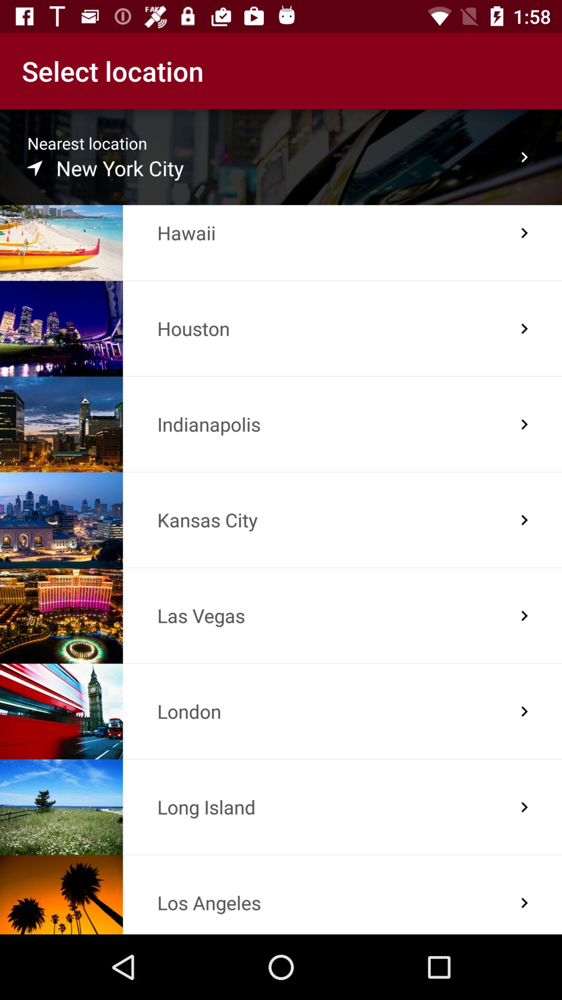

/home/toby/Screen2Vec/datasets/filtered_traces/com.google.zagat/trace_0/view_hierarchies/../screenshots/101.jpg

package name:  com.google.zagat
screen id:  com.google.zagat-trace_0-view_hierarchies-101




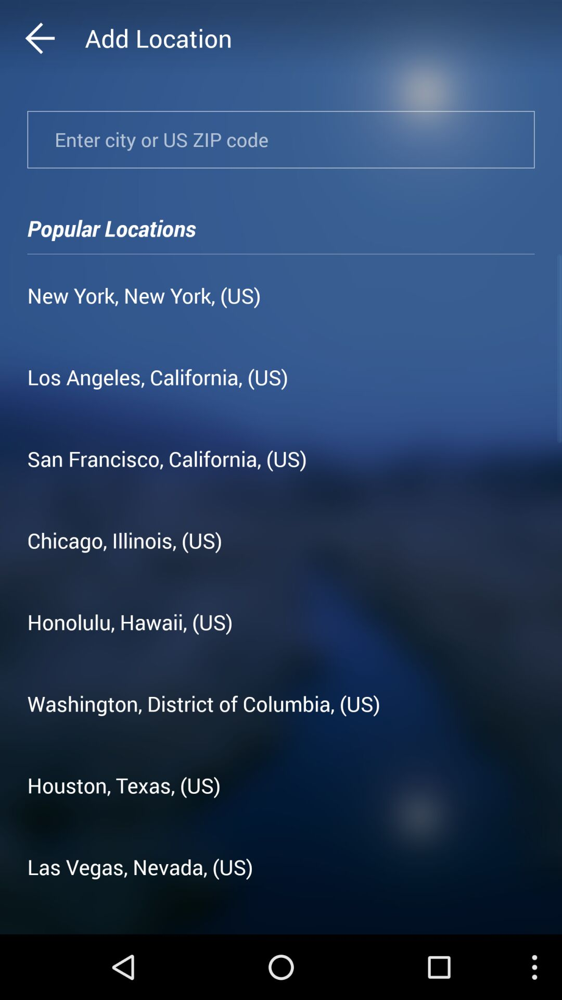

/home/toby/Screen2Vec/datasets/filtered_traces/com.gau.go.launcherex.gowidget.weatherwidget/trace_0/view_hierarchies/../screenshots/189.jpg
score:  0.03597887014749934
model name:  textonly
package name:  com.gau.go.launcherex.gowidget.weatherwidget
screen id:  com.gau.go.launcherex.gowidget.weatherwidget-trace_0-view_hierarchies-189




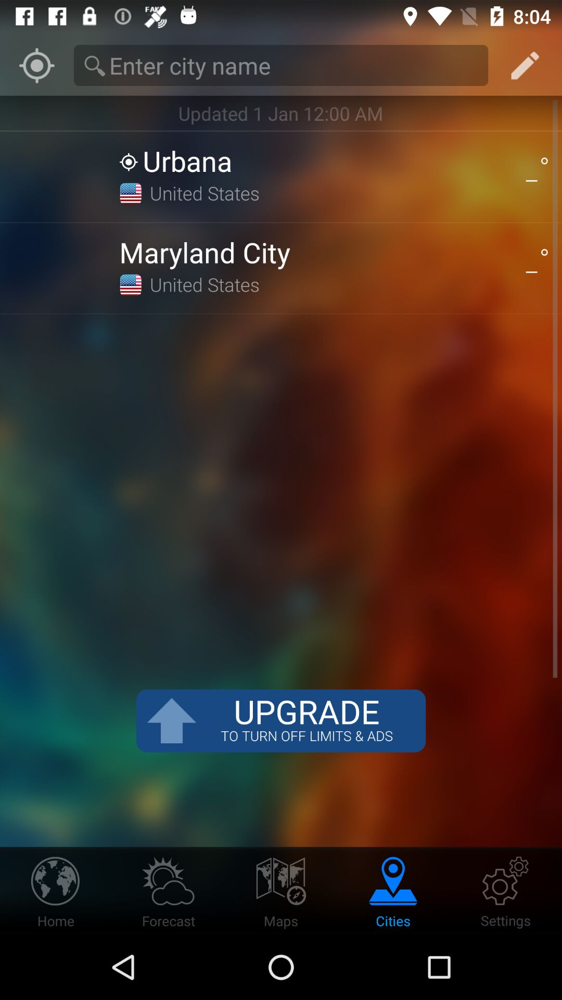

/home/toby/Screen2Vec/datasets/filtered_traces/com.weathernowapp.weathernow/trace_0/view_hierarchies/../screenshots/614.jpg
score:  0.03645839706705978
model name:  textonly
package name:  com.weathernowapp.weathernow
screen id:  com.weathernowapp.weathernow-trace_0-view_hierarchies-614




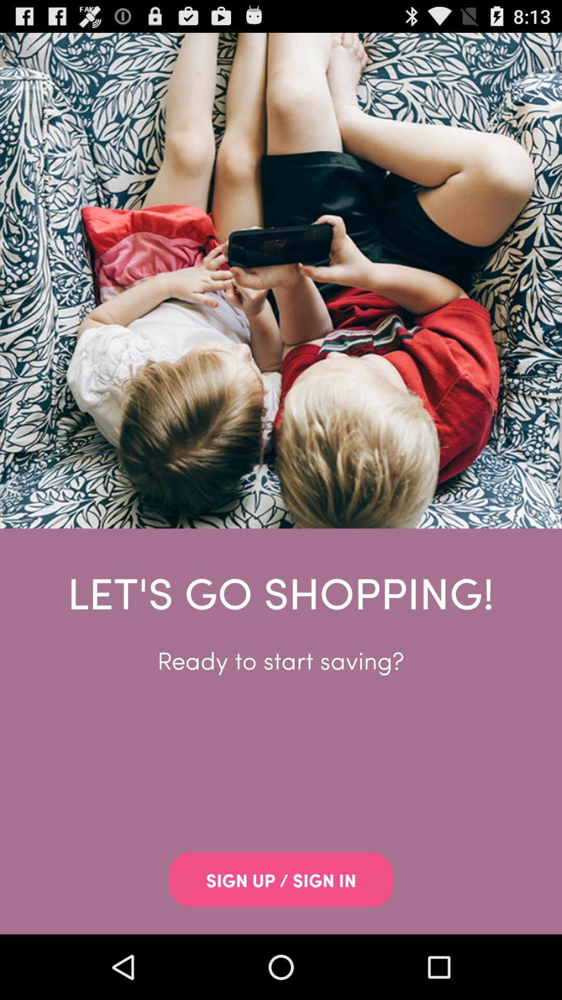

/home/toby/Screen2Vec/datasets/filtered_traces/com.boxed.prod/trace_0/view_hierarchies/../screenshots/192.jpg
score:  0.036670907634682615
model name:  textonly
package name:  com.boxed.prod
screen id:  com.boxed.prod-trace_0-view_hierarchies-192




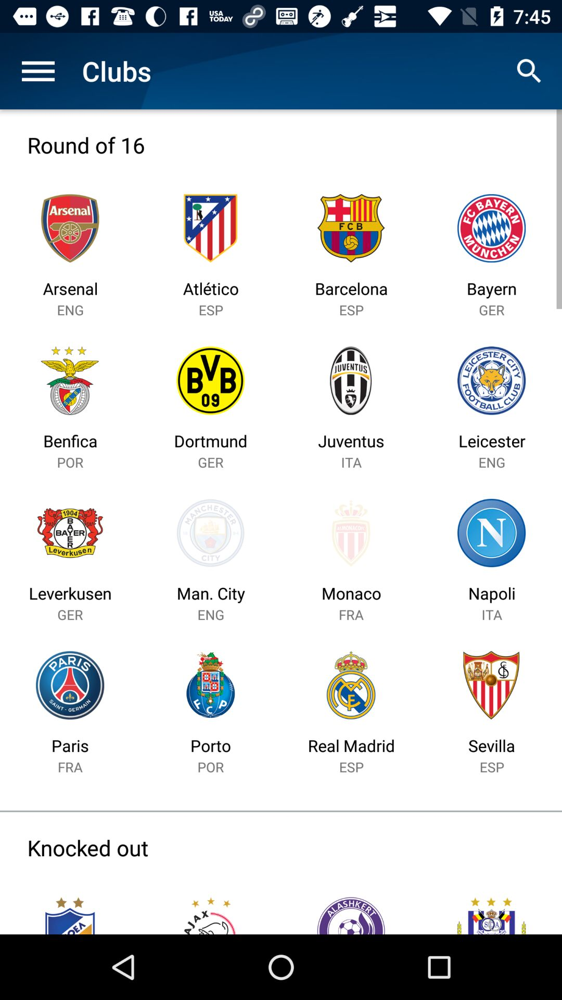

/home/toby/Screen2Vec/datasets/filtered_traces/com.uefa.ucl/trace_0/view_hierarchies/../screenshots/497.jpg
score:  0.03674545277255736
model name:  textonly
package name:  com.uefa.ucl
screen id:  com.uefa.ucl-trace_0-view_hierarchies-497




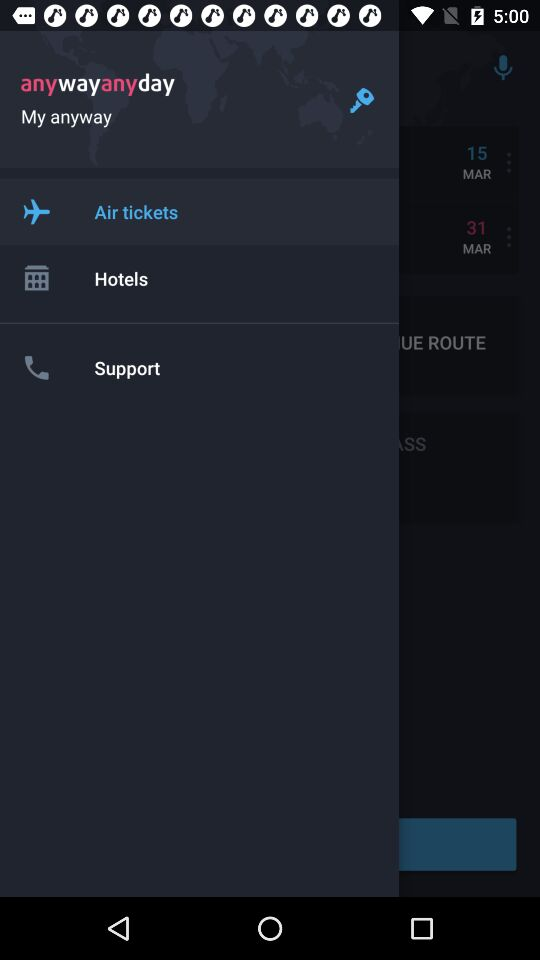

/home/toby/Screen2Vec/datasets/filtered_traces/com.anywayanyday.android/trace_0/view_hierarchies/../screenshots/2329.jpg
score:  0.036811908011532224
model name:  textonly
package name:  com.anywayanyday.android
screen id:  com.anywayanyday.android-trace_0-view_hierarchies-2329


[{'rico_id': 'com.gau.go.launcherex.gowidget.weatherwidget/trace_0/view_hierarchies/189.json', 'score': 0.03597887014749934}, {'rico_id': 'com.weathernowapp.weathernow/trace_0/view_hierarchies/614.json', 'score': 0.03645839706705978}, {'rico_id': 'com.boxed.prod/trace_0/view_hierarchies/192.json', 'score': 0.036670907634682615}, {'rico_id': 'com.uefa.ucl/trace_0/view_hierarchies/497.json', 'score': 0.03674545277255736}, {'rico_id': 'com.anywayanyday.android/trace_0/view_hierarchies/2329.json', 'score': 0.036811908011532224}] 


Source Screen:


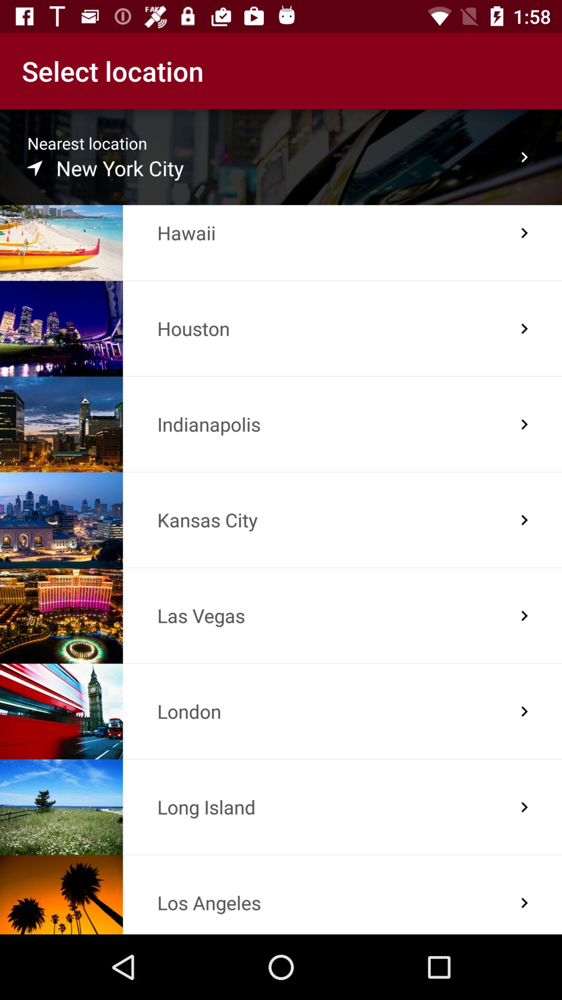

/home/toby/Screen2Vec/datasets/filtered_traces/com.google.zagat/trace_0/view_hierarchies/../screenshots/101.jpg

package name:  com.google.zagat
screen id:  com.google.zagat-trace_0-view_hierarchies-101




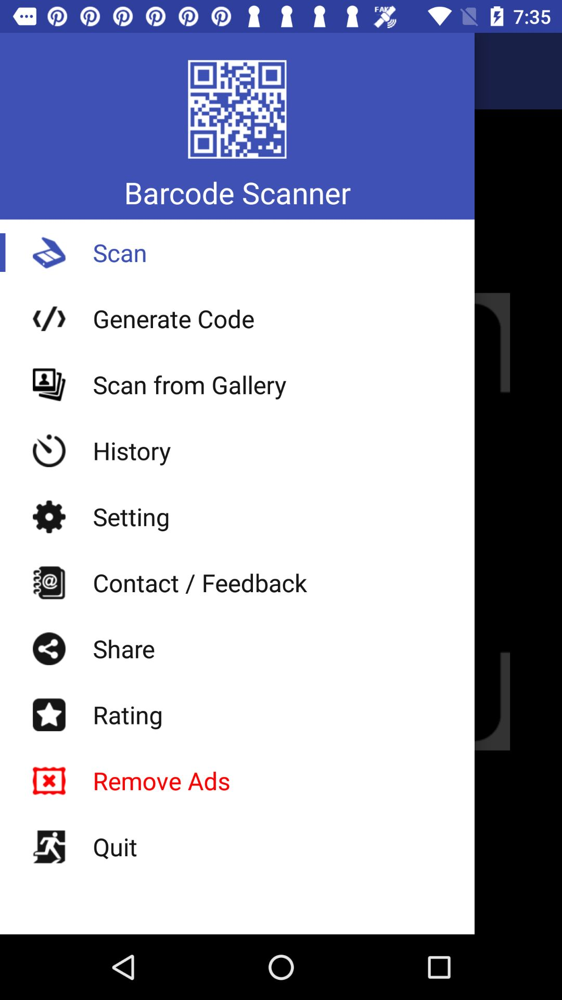

/home/toby/Screen2Vec/datasets/filtered_traces/com.qrbarcode.qrbarcodeScanner/trace_0/view_hierarchies/../screenshots/1423.jpg
score:  0.03626534901831979
model name:  layoutonly
package name:  com.qrbarcode.qrbarcodeScanner
screen id:  com.qrbarcode.qrbarcodeScanner-trace_0-view_hierarchies-1423




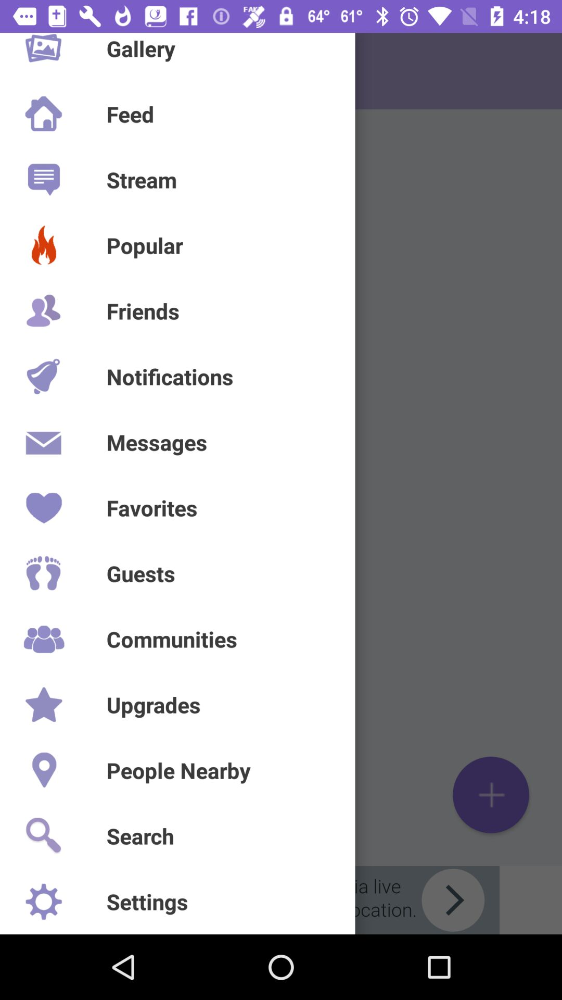

/home/toby/Screen2Vec/datasets/filtered_traces/media.media1e1a.arkadaslik/trace_0/view_hierarchies/../screenshots/854.jpg
score:  0.038544004658685904
model name:  layoutonly
package name:  media.media1e1a.arkadaslik
screen id:  media.media1e1a.arkadaslik-trace_0-view_hierarchies-854




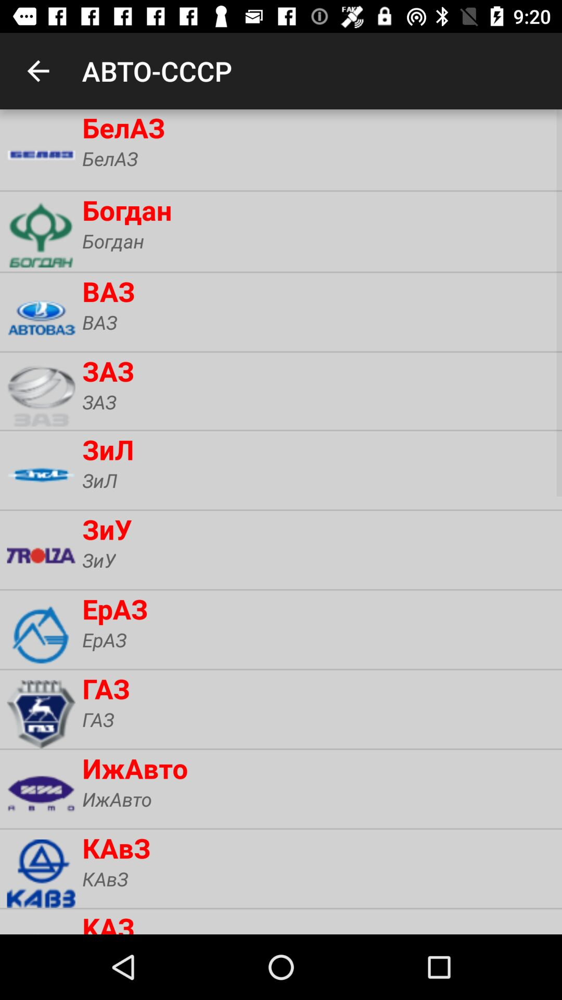

/home/toby/Screen2Vec/datasets/filtered_traces/turBO.avtoatua.mobile/trace_0/view_hierarchies/../screenshots/125.jpg
score:  0.03894499500445425
model name:  layoutonly
package name:  turBO.avtoatua.mobile
screen id:  turBO.avtoatua.mobile-trace_0-view_hierarchies-125




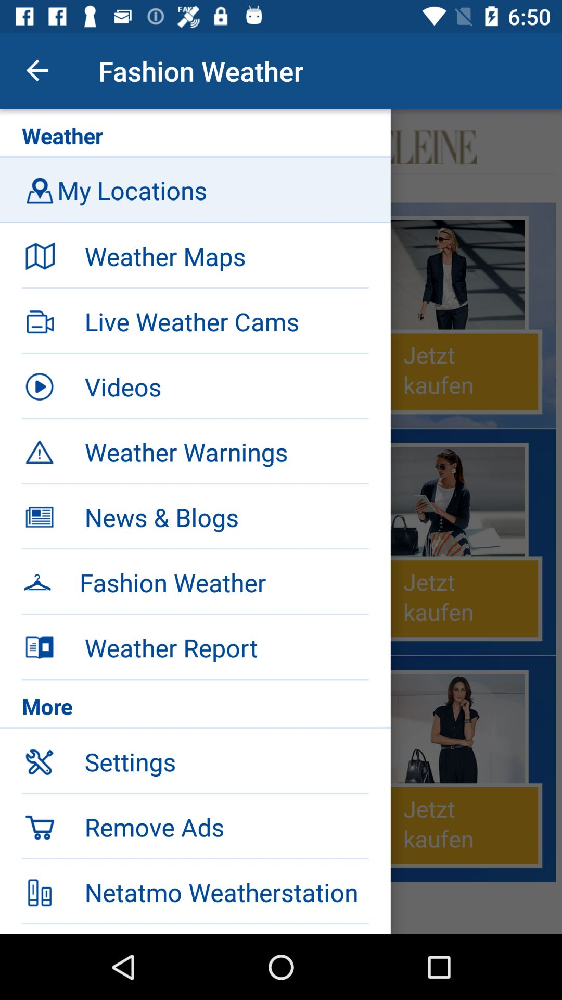

/home/toby/Screen2Vec/datasets/filtered_traces/com.wetter.androidclient/trace_0/view_hierarchies/../screenshots/538.jpg
score:  0.03911565707087916
model name:  layoutonly
package name:  com.wetter.androidclient
screen id:  com.wetter.androidclient-trace_0-view_hierarchies-538




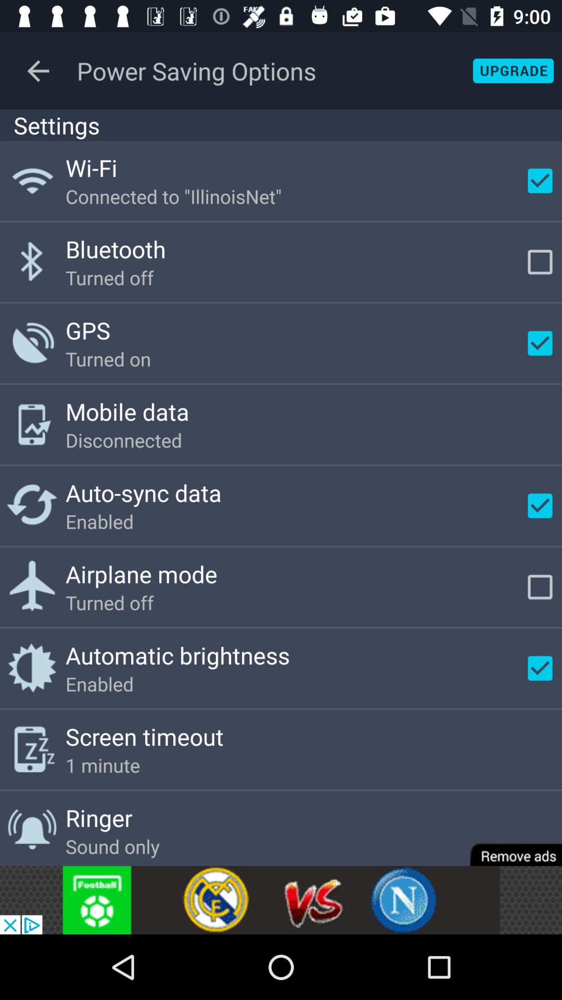

/home/toby/Screen2Vec/datasets/filtered_traces/com.antivirus/trace_0/view_hierarchies/../screenshots/730.jpg
score:  0.040647788075760194
model name:  layoutonly
package name:  com.antivirus
screen id:  com.antivirus-trace_0-view_hierarchies-730


[{'rico_id': 'com.qrbarcode.qrbarcodeScanner/trace_0/view_hierarchies/1423.json', 'score': 0.03626534901831979}, {'rico_id': 'media.media1e1a.arkadaslik/trace_0/view_hierarchies/854.json', 'score': 0.038544004658685904}, {'rico_id': 'turBO.avtoatua.mobile/trace_0/view_hierarchies/125.json', 'score': 0.03894499500445425}, {'rico_id': 'com.wetter.androidclient/trace_0/view_hierarchies/538.json', 'score': 0.03911565707087916}, {'rico_id': 'com.antivirus/trace_0/view_hierarchies/730.json', 'score': 0.040647788075760194}] 


Source Screen:


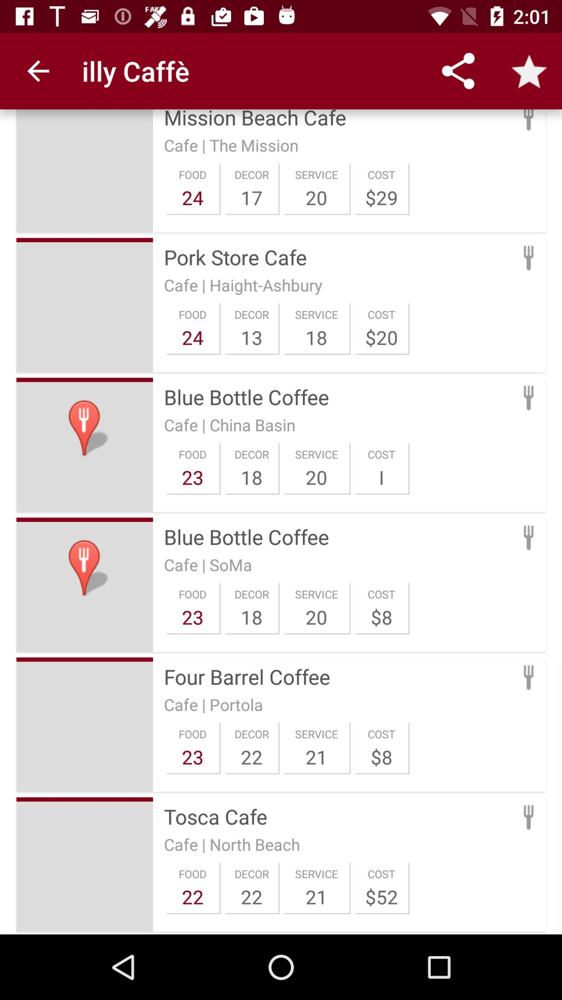

/home/toby/Screen2Vec/datasets/filtered_traces/com.google.zagat/trace_0/view_hierarchies/../screenshots/385.jpg

package name:  com.google.zagat
screen id:  com.google.zagat-trace_0-view_hierarchies-385




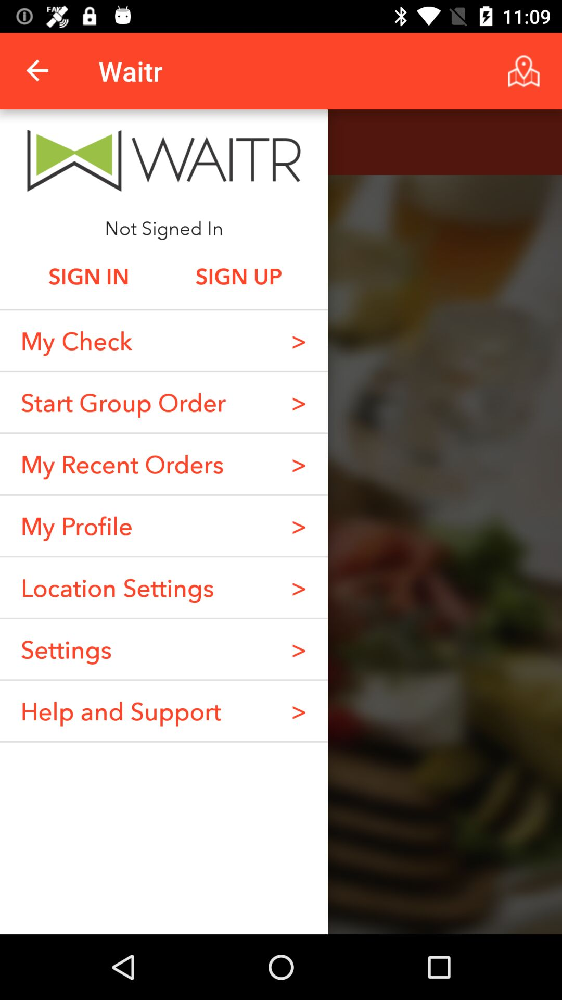

/home/toby/Screen2Vec/datasets/filtered_traces/com.waitrapp/trace_0/view_hierarchies/../screenshots/432.jpg
score:  0.10873098288800132
model name:  screen2vec
package name:  com.waitrapp
screen id:  com.waitrapp-trace_0-view_hierarchies-432




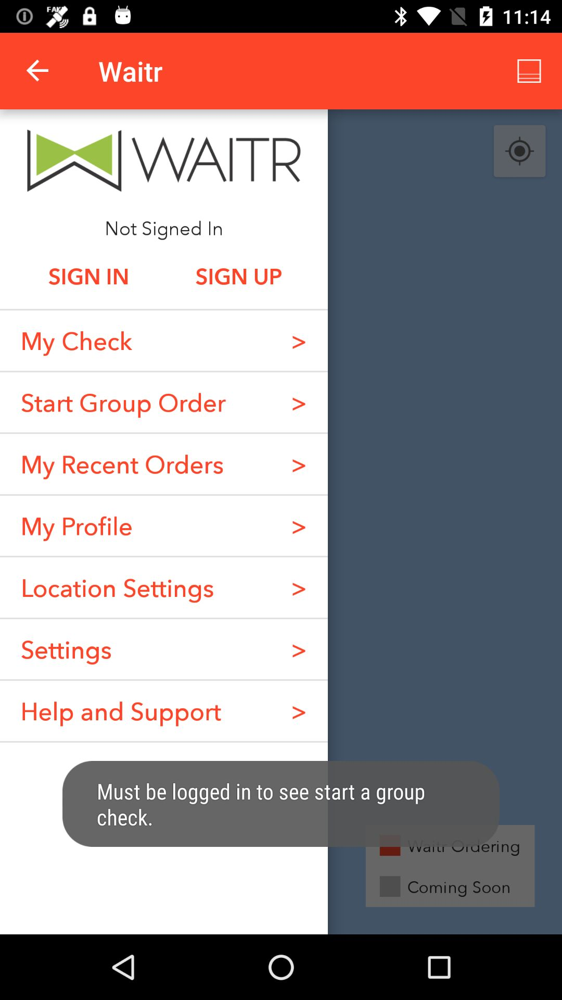

/home/toby/Screen2Vec/datasets/filtered_traces/com.waitrapp/trace_0/view_hierarchies/../screenshots/2212.jpg
score:  0.1088570712281951
model name:  screen2vec
package name:  com.waitrapp
screen id:  com.waitrapp-trace_0-view_hierarchies-2212




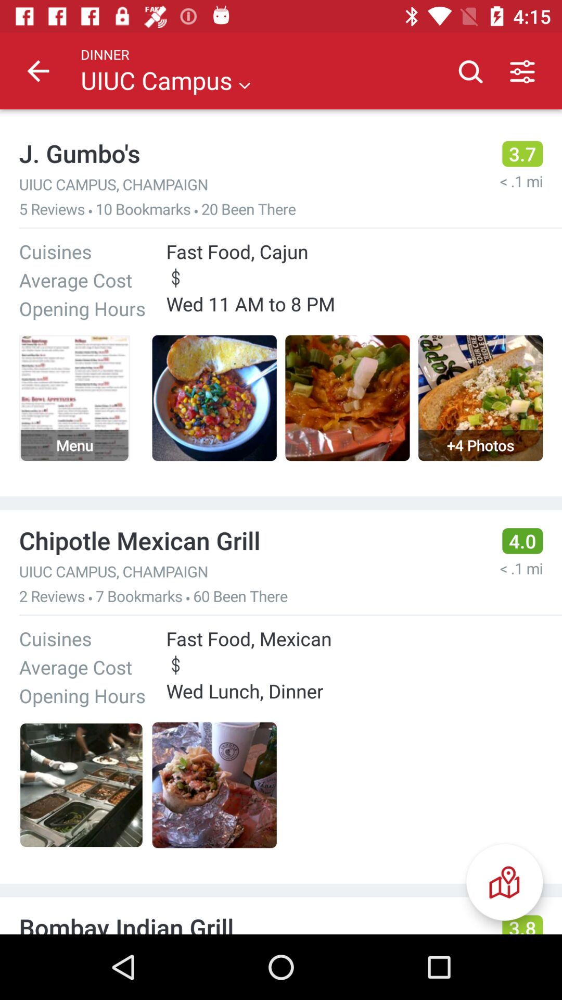

/home/toby/Screen2Vec/datasets/filtered_traces/com.application.zomato/trace_2/view_hierarchies/../screenshots/221.jpg
score:  0.11252836921293297
model name:  screen2vec
package name:  com.application.zomato
screen id:  com.application.zomato-trace_2-view_hierarchies-221




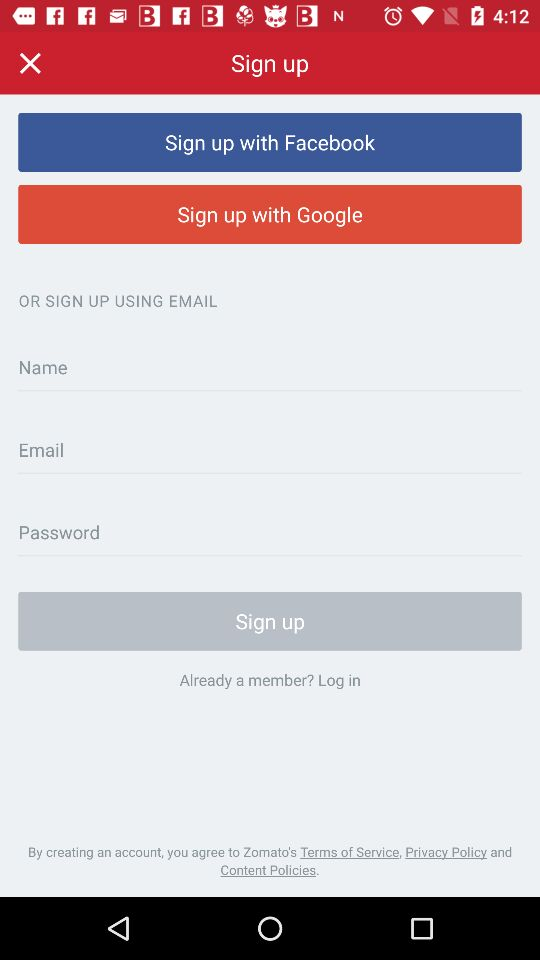

/home/toby/Screen2Vec/datasets/filtered_traces/com.application.zomato/trace_0/view_hierarchies/../screenshots/506.jpg
score:  0.11293882013907997
model name:  screen2vec
package name:  com.application.zomato
screen id:  com.application.zomato-trace_0-view_hierarchies-506




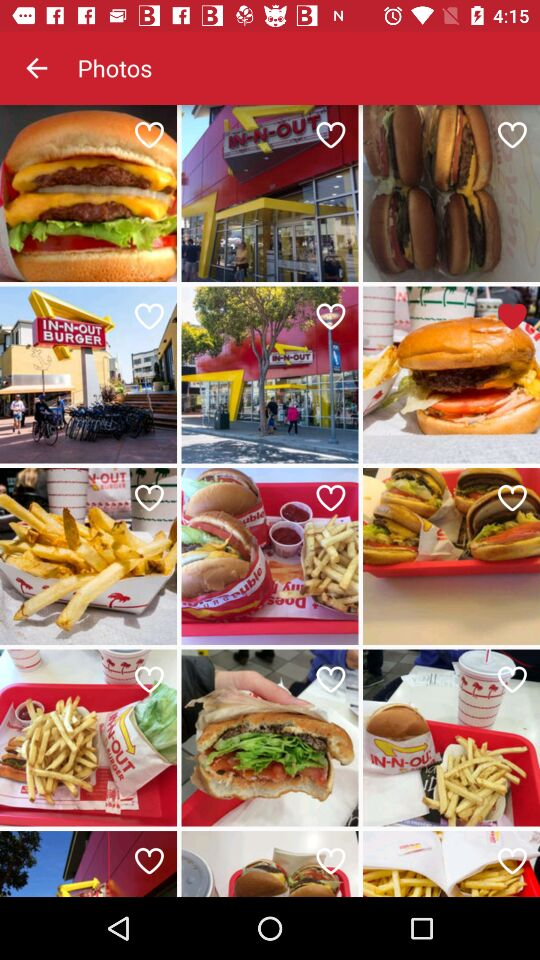

/home/toby/Screen2Vec/datasets/filtered_traces/com.application.zomato/trace_0/view_hierarchies/../screenshots/1621.jpg
score:  0.11650137885363743
model name:  screen2vec
package name:  com.application.zomato
screen id:  com.application.zomato-trace_0-view_hierarchies-1621


[{'rico_id': 'com.waitrapp/trace_0/view_hierarchies/432.json', 'score': 0.10873098288800132}, {'rico_id': 'com.waitrapp/trace_0/view_hierarchies/2212.json', 'score': 0.1088570712281951}, {'rico_id': 'com.application.zomato/trace_2/view_hierarchies/221.json', 'score': 0.11252836921293297}, {'rico_id': 'com.application.zomato/trace_0/view_hierarchies/506.json', 'score': 0.11293882013907997}, {'rico_id': 'com.application.zomato/trace_0/view_hierarchies/1621.json', 'score': 0.11650137885363743}] 


Source Screen:


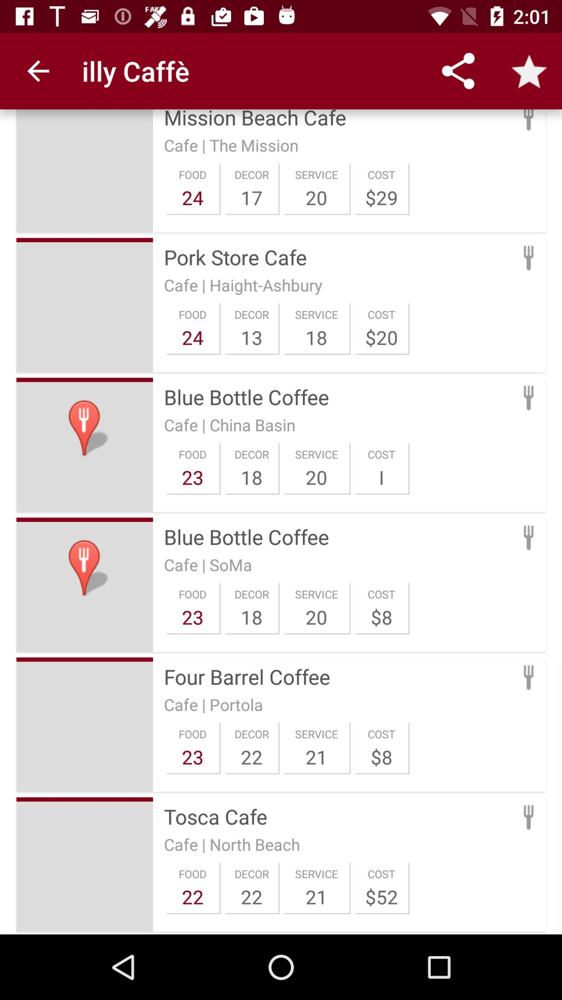

/home/toby/Screen2Vec/datasets/filtered_traces/com.google.zagat/trace_0/view_hierarchies/../screenshots/385.jpg

package name:  com.google.zagat
screen id:  com.google.zagat-trace_0-view_hierarchies-385




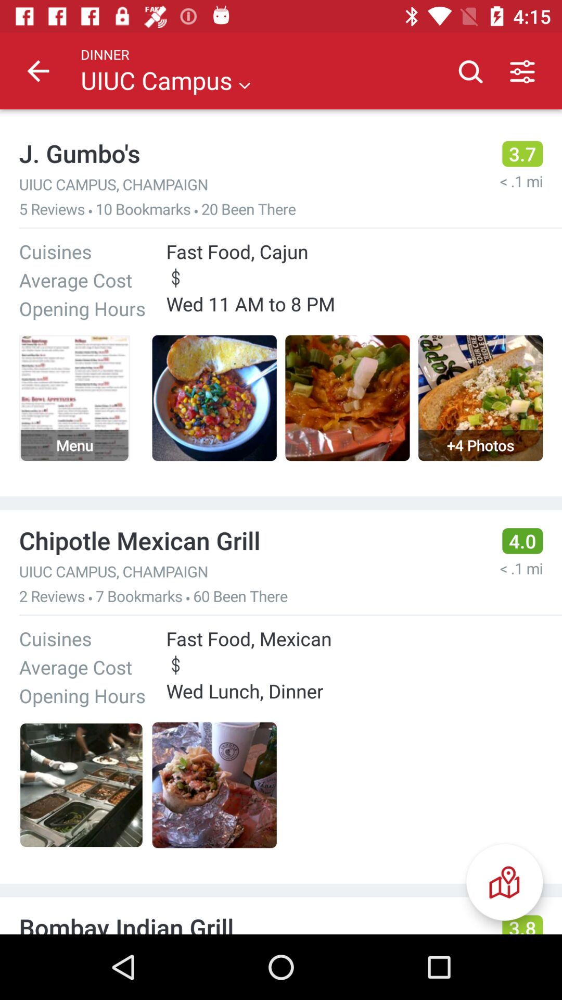

/home/toby/Screen2Vec/datasets/filtered_traces/com.application.zomato/trace_2/view_hierarchies/../screenshots/221.jpg
score:  0.02385326135457122
model name:  textonly
package name:  com.application.zomato
screen id:  com.application.zomato-trace_2-view_hierarchies-221




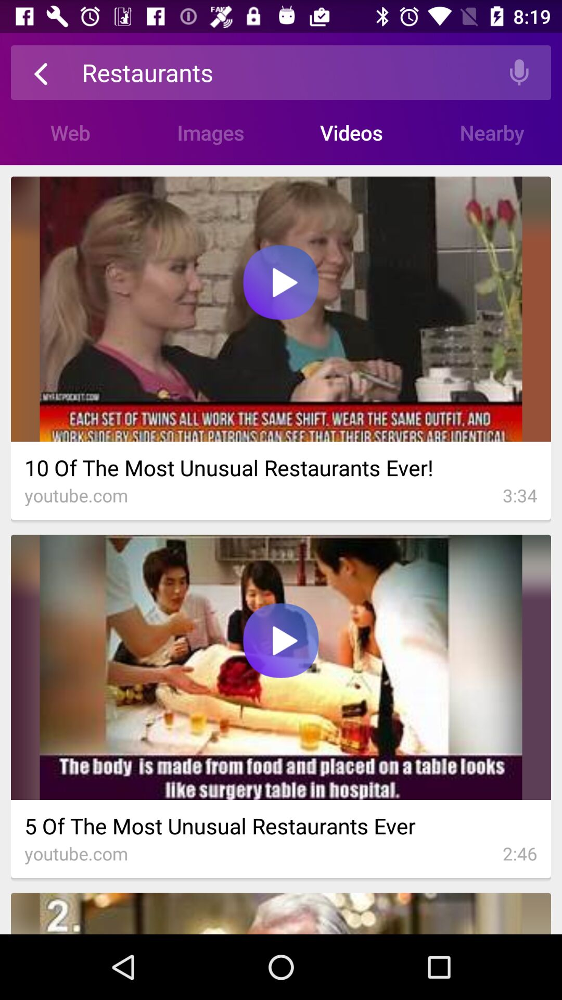

/home/toby/Screen2Vec/datasets/filtered_traces/com.yahoo.mobile.client.android.search/trace_0/view_hierarchies/../screenshots/138.jpg
score:  0.029080127647525655
model name:  textonly
package name:  com.yahoo.mobile.client.android.search
screen id:  com.yahoo.mobile.client.android.search-trace_0-view_hierarchies-138




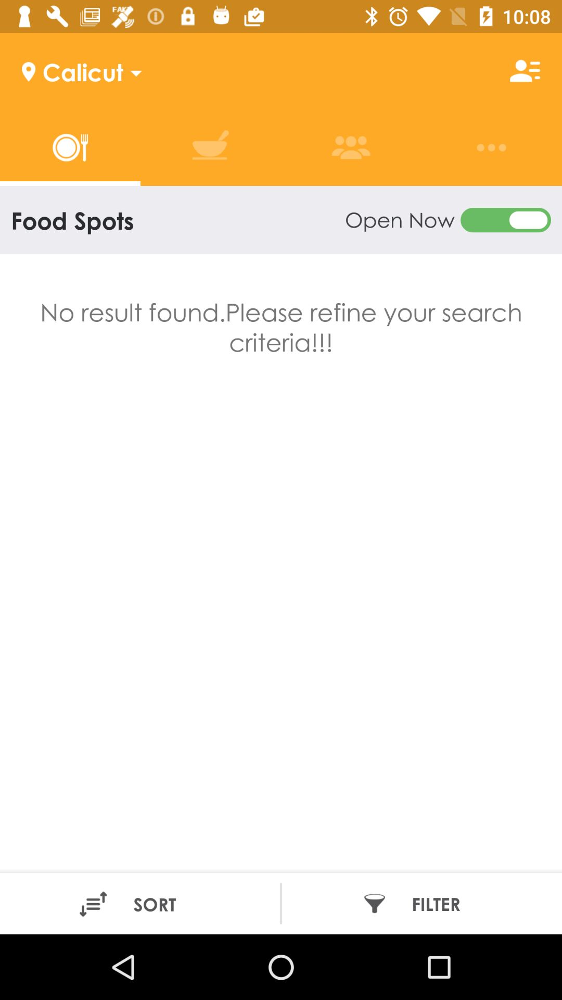

/home/toby/Screen2Vec/datasets/filtered_traces/com.tastyspots.views/trace_0/view_hierarchies/../screenshots/488.jpg
score:  0.029146464459356647
model name:  textonly
package name:  com.tastyspots.views
screen id:  com.tastyspots.views-trace_0-view_hierarchies-488




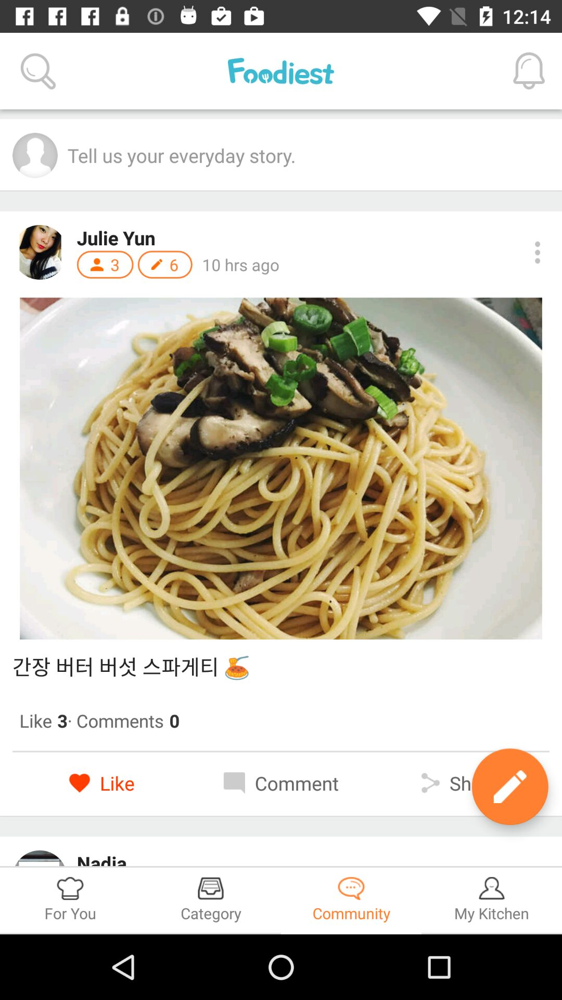

/home/toby/Screen2Vec/datasets/filtered_traces/com.vitalhint.haemukja/trace_0/view_hierarchies/../screenshots/1258.jpg
score:  0.029750503017119012
model name:  textonly
package name:  com.vitalhint.haemukja
screen id:  com.vitalhint.haemukja-trace_0-view_hierarchies-1258




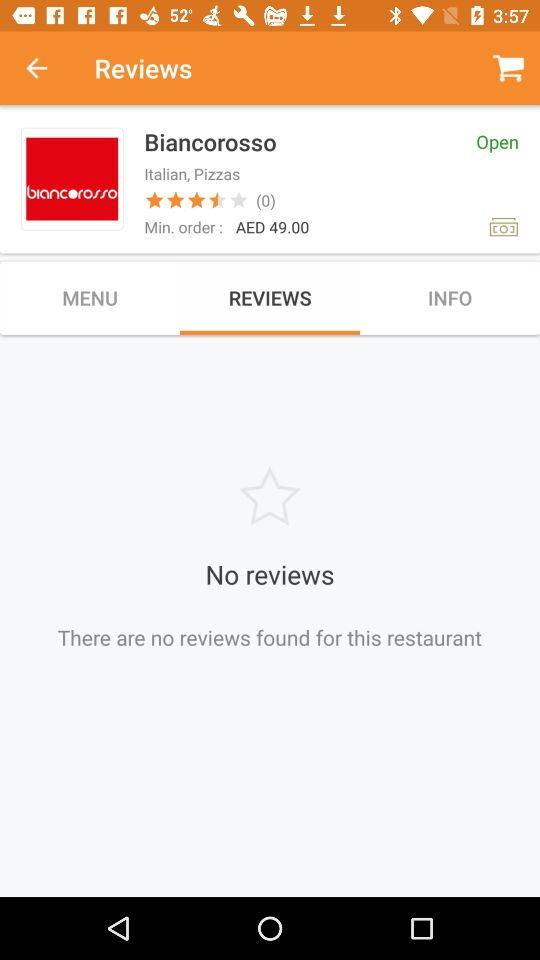

/home/toby/Screen2Vec/datasets/filtered_traces/com.talabat/trace_0/view_hierarchies/../screenshots/1007.jpg
score:  0.029899458640022414
model name:  textonly
package name:  com.talabat
screen id:  com.talabat-trace_0-view_hierarchies-1007


[{'rico_id': 'com.application.zomato/trace_2/view_hierarchies/221.json', 'score': 0.02385326135457122}, {'rico_id': 'com.yahoo.mobile.client.android.search/trace_0/view_hierarchies/138.json', 'score': 0.029080127647525655}, {'rico_id': 'com.tastyspots.views/trace_0/view_hierarchies/488.json', 'score': 0.029146464459356647}, {'rico_id': 'com.vitalhint.haemukja/trace_0/view_hierarchies/1258.json', 'score': 0.029750503017119012}, {'rico_id': 'com.talabat/trace_0/view_hierarchies/1007.json', 'score': 0.029899458640022414}] 


Source Screen:


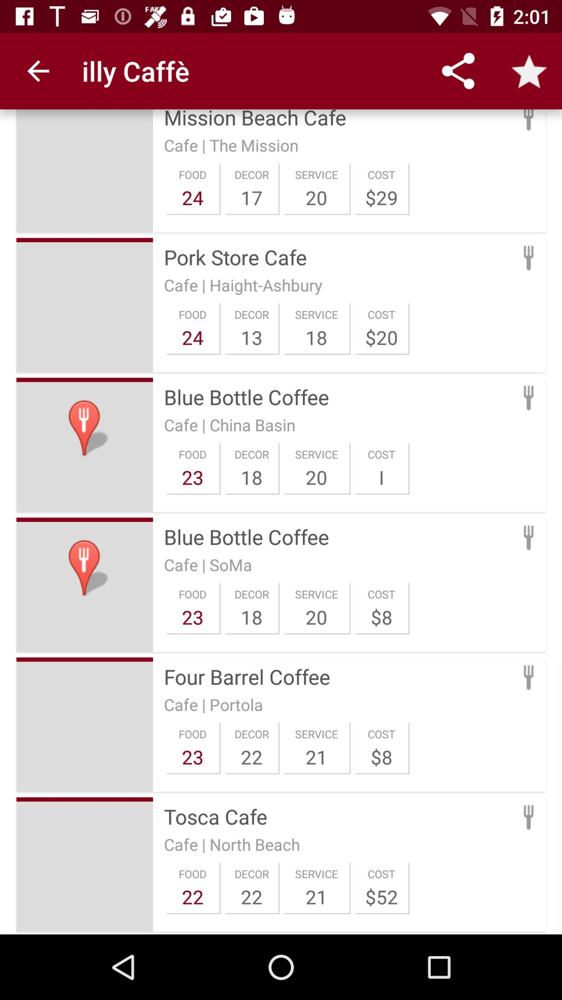

/home/toby/Screen2Vec/datasets/filtered_traces/com.google.zagat/trace_0/view_hierarchies/../screenshots/385.jpg

package name:  com.google.zagat
screen id:  com.google.zagat-trace_0-view_hierarchies-385




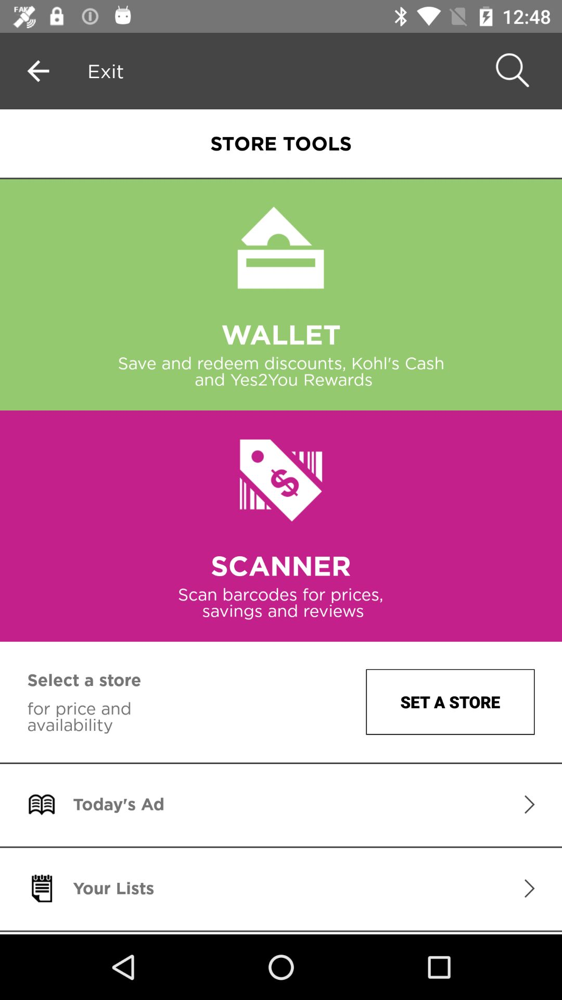

/home/toby/Screen2Vec/datasets/filtered_traces/com.kohls.mcommerce.opal/trace_0/view_hierarchies/../screenshots/1265.jpg
score:  0.04794159954199839
model name:  layoutonly
package name:  com.kohls.mcommerce.opal
screen id:  com.kohls.mcommerce.opal-trace_0-view_hierarchies-1265




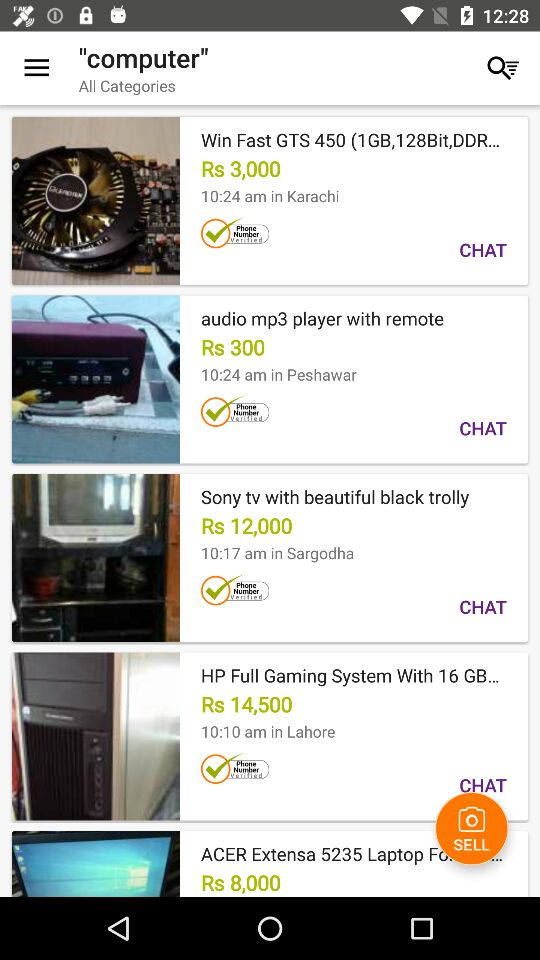

/home/toby/Screen2Vec/datasets/filtered_traces/com.olx.pk/trace_1/view_hierarchies/../screenshots/859.jpg
score:  0.04952918202183154
model name:  layoutonly
package name:  com.olx.pk
screen id:  com.olx.pk-trace_1-view_hierarchies-859




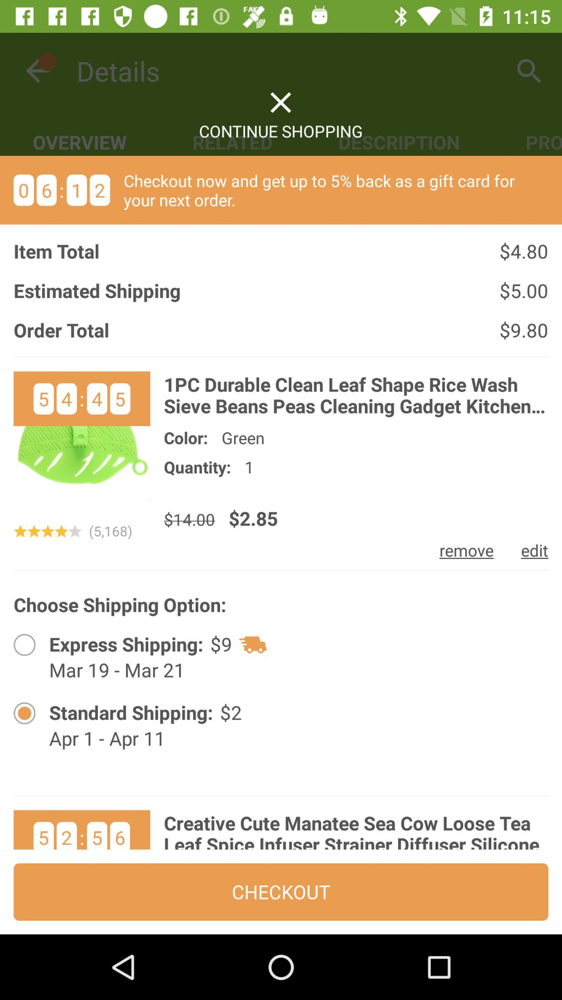

/home/toby/Screen2Vec/datasets/filtered_traces/com.contextlogic.geek/trace_0/view_hierarchies/../screenshots/2904.jpg
score:  0.049879043455433036
model name:  layoutonly
package name:  com.contextlogic.geek
screen id:  com.contextlogic.geek-trace_0-view_hierarchies-2904




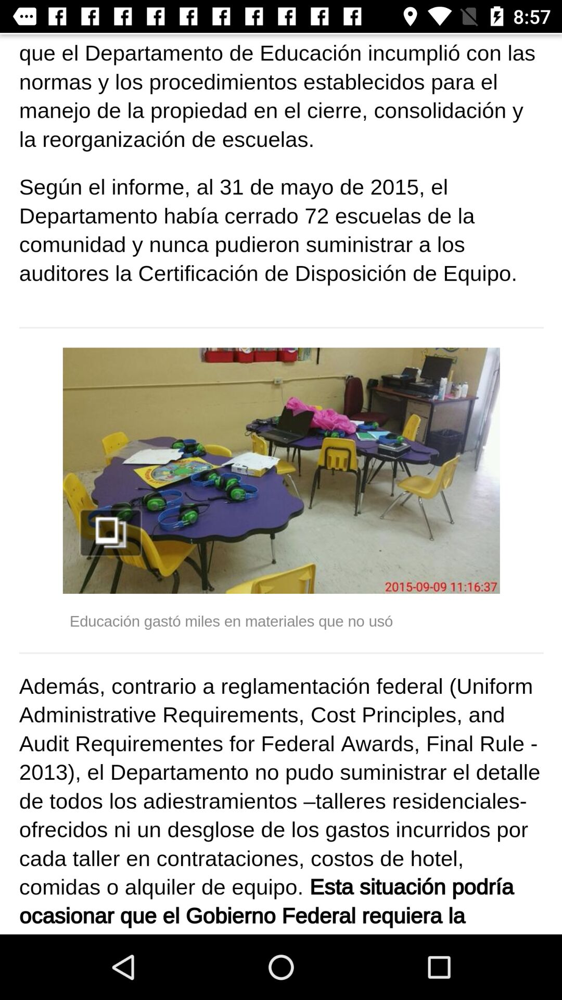

/home/toby/Screen2Vec/datasets/filtered_traces/com.nbcuni.telemundostations.puertorico/trace_0/view_hierarchies/../screenshots/656.jpg
score:  0.05370887849976613
model name:  layoutonly
package name:  com.nbcuni.telemundostations.puertorico
screen id:  com.nbcuni.telemundostations.puertorico-trace_0-view_hierarchies-656




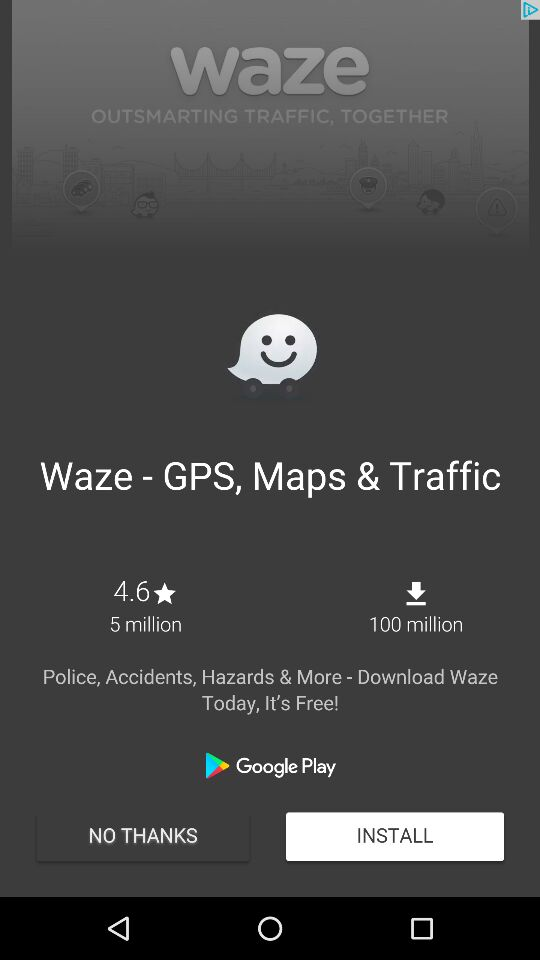

/home/toby/Screen2Vec/datasets/filtered_traces/com.ilmeteo.android.ilmeteo/trace_1/view_hierarchies/../screenshots/2057.jpg
score:  0.05517443337864936
model name:  layoutonly
package name:  com.ilmeteo.android.ilmeteo
screen id:  com.ilmeteo.android.ilmeteo-trace_1-view_hierarchies-2057


[{'rico_id': 'com.kohls.mcommerce.opal/trace_0/view_hierarchies/1265.json', 'score': 0.04794159954199839}, {'rico_id': 'com.olx.pk/trace_1/view_hierarchies/859.json', 'score': 0.04952918202183154}, {'rico_id': 'com.contextlogic.geek/trace_0/view_hierarchies/2904.json', 'score': 0.049879043455433036}, {'rico_id': 'com.nbcuni.telemundostations.puertorico/trace_0/view_hierarchies/656.json', 'score': 0.05370887849976613}, {'rico_id': 'com.ilmeteo.android.ilmeteo/trace_1/view_hierarchies/2057.json', 'score': 0.05517443337864936}] 


Source Screen:


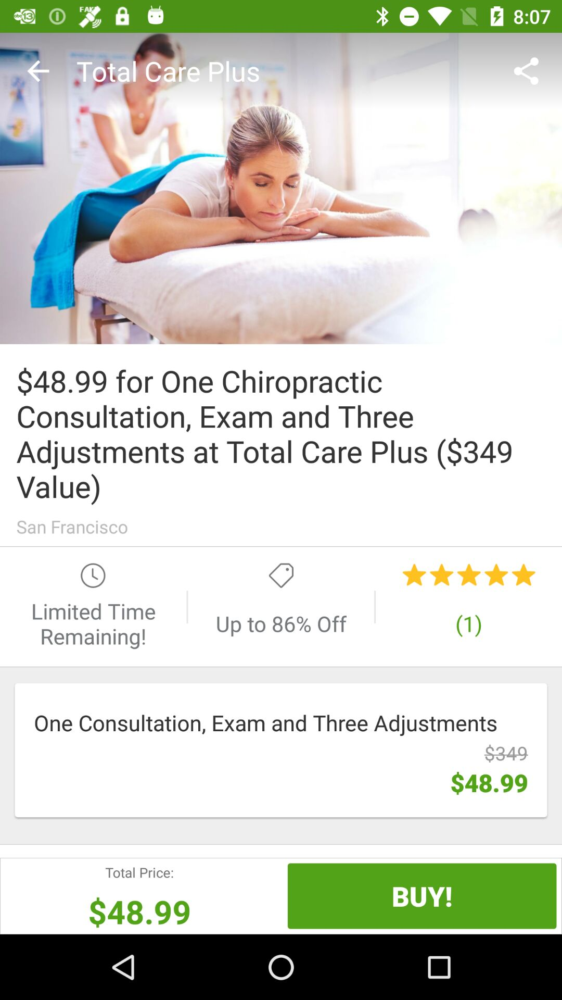

/home/toby/Screen2Vec/datasets/filtered_traces/com.groupon/trace_0/view_hierarchies/../screenshots/768.jpg

package name:  com.groupon
screen id:  com.groupon-trace_0-view_hierarchies-768




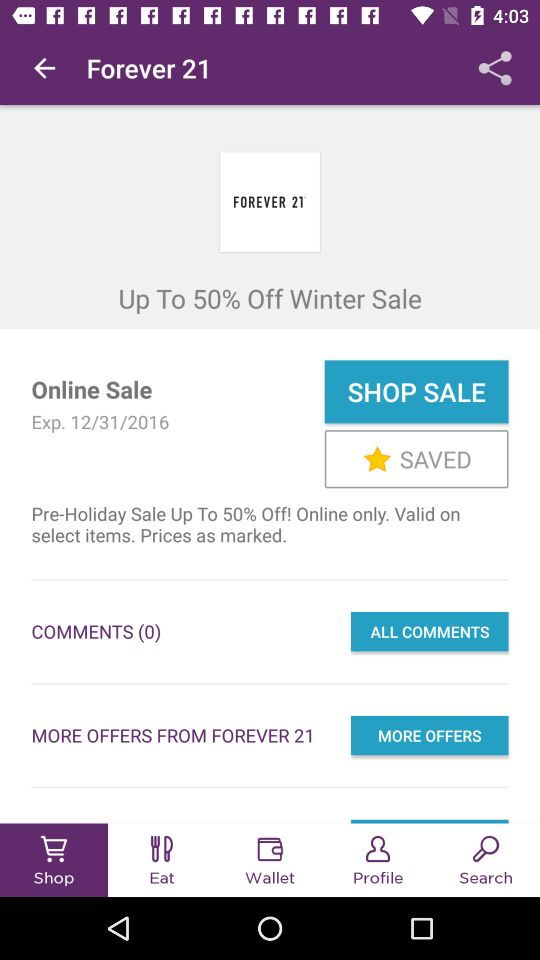

/home/toby/Screen2Vec/datasets/filtered_traces/com.whaleshark.retailmenot/trace_0/view_hierarchies/../screenshots/1866.jpg
score:  0.09815348672826407
model name:  screen2vec
package name:  com.whaleshark.retailmenot
screen id:  com.whaleshark.retailmenot-trace_0-view_hierarchies-1866




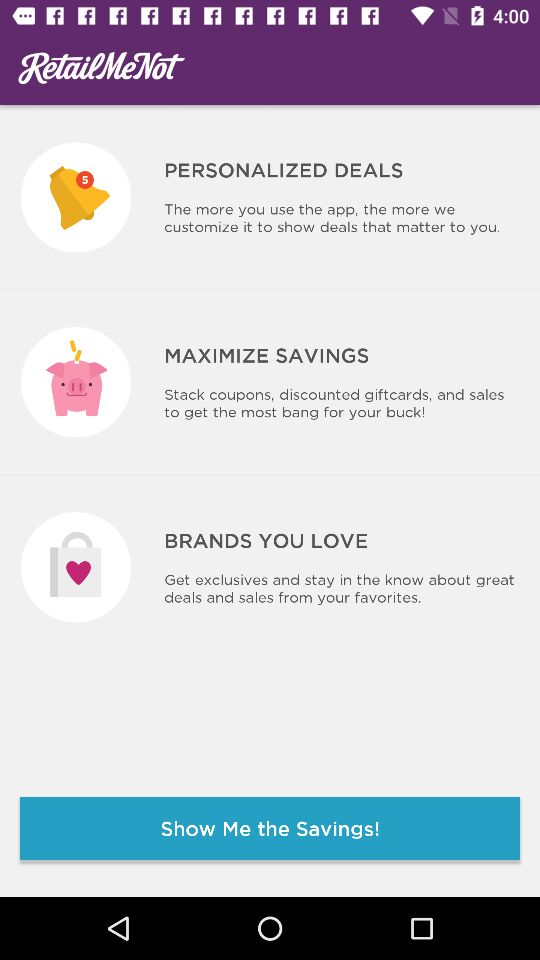

/home/toby/Screen2Vec/datasets/filtered_traces/com.whaleshark.retailmenot/trace_0/view_hierarchies/../screenshots/2.jpg
score:  0.10287633173751976
model name:  screen2vec
package name:  com.whaleshark.retailmenot
screen id:  com.whaleshark.retailmenot-trace_0-view_hierarchies-2




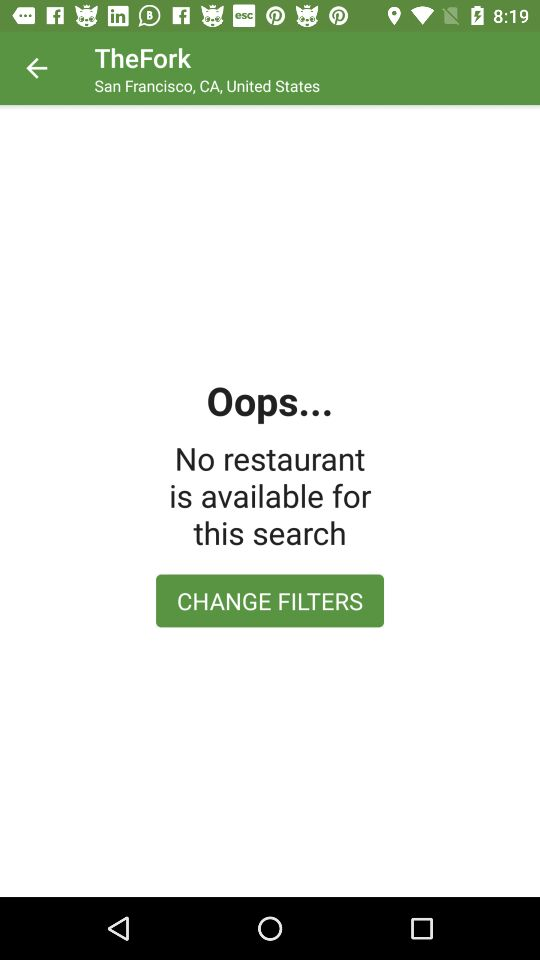

/home/toby/Screen2Vec/datasets/filtered_traces/com.lafourchette.lafourchette/trace_0/view_hierarchies/../screenshots/2215.jpg
score:  0.10693633176109218
model name:  screen2vec
package name:  com.lafourchette.lafourchette
screen id:  com.lafourchette.lafourchette-trace_0-view_hierarchies-2215




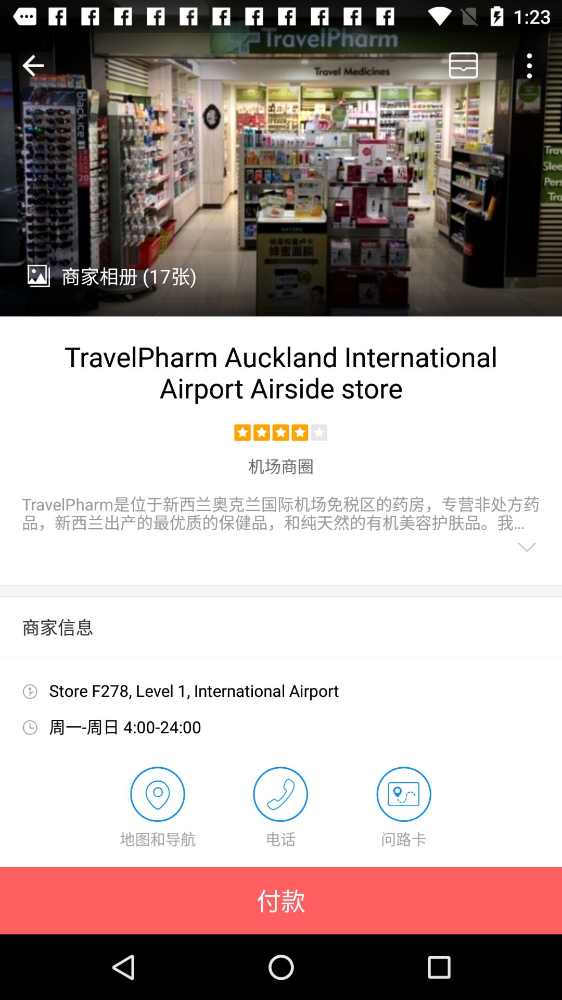

/home/toby/Screen2Vec/datasets/filtered_traces/com.eg.android.AlipayGphone/trace_0/view_hierarchies/../screenshots/636.jpg
score:  0.11310963026906395
model name:  screen2vec
package name:  com.eg.android.AlipayGphone
screen id:  com.eg.android.AlipayGphone-trace_0-view_hierarchies-636




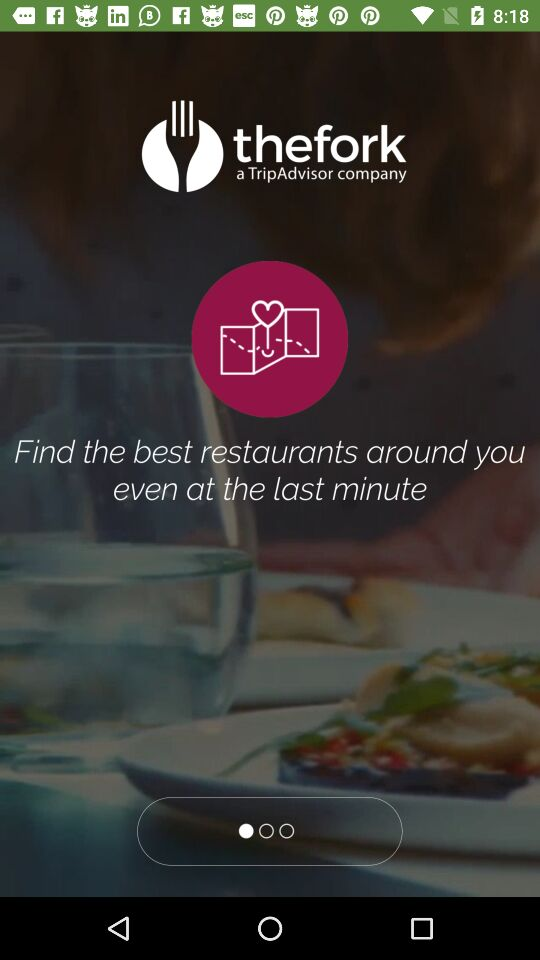

/home/toby/Screen2Vec/datasets/filtered_traces/com.lafourchette.lafourchette/trace_0/view_hierarchies/../screenshots/616.jpg
score:  0.11466993066916409
model name:  screen2vec
package name:  com.lafourchette.lafourchette
screen id:  com.lafourchette.lafourchette-trace_0-view_hierarchies-616


[{'rico_id': 'com.whaleshark.retailmenot/trace_0/view_hierarchies/1866.json', 'score': 0.09815348672826407}, {'rico_id': 'com.whaleshark.retailmenot/trace_0/view_hierarchies/2.json', 'score': 0.10287633173751976}, {'rico_id': 'com.lafourchette.lafourchette/trace_0/view_hierarchies/2215.json', 'score': 0.10693633176109218}, {'rico_id': 'com.eg.android.AlipayGphone/trace_0/view_hierarchies/636.json', 'score': 0.11310963026906395}, {'rico_id': 'com.lafourchette.lafourchette/trace_0/view_hierarchies/616.json', 'score': 0.11466993066916409}] 


Source Screen:


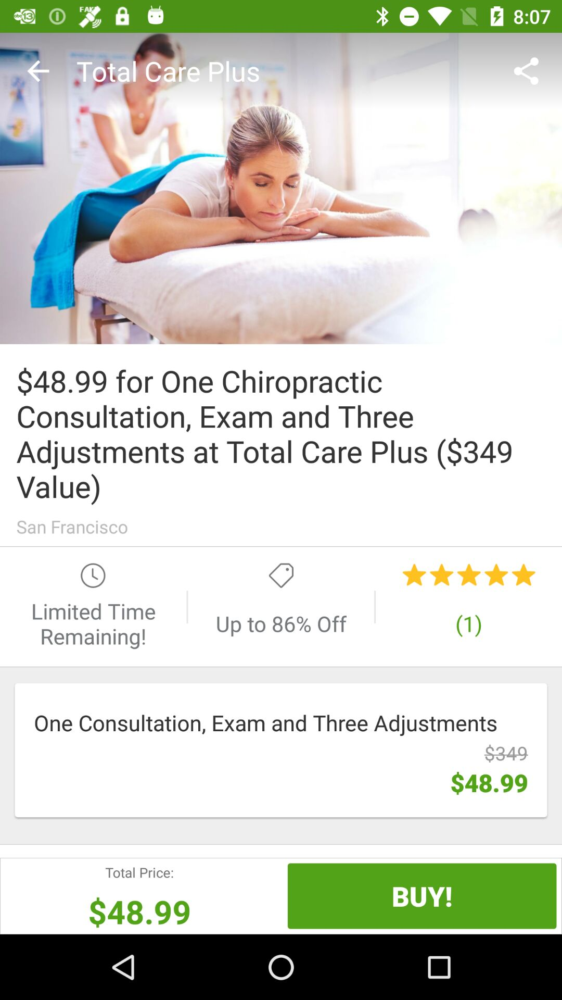

/home/toby/Screen2Vec/datasets/filtered_traces/com.groupon/trace_0/view_hierarchies/../screenshots/768.jpg

package name:  com.groupon
screen id:  com.groupon-trace_0-view_hierarchies-768




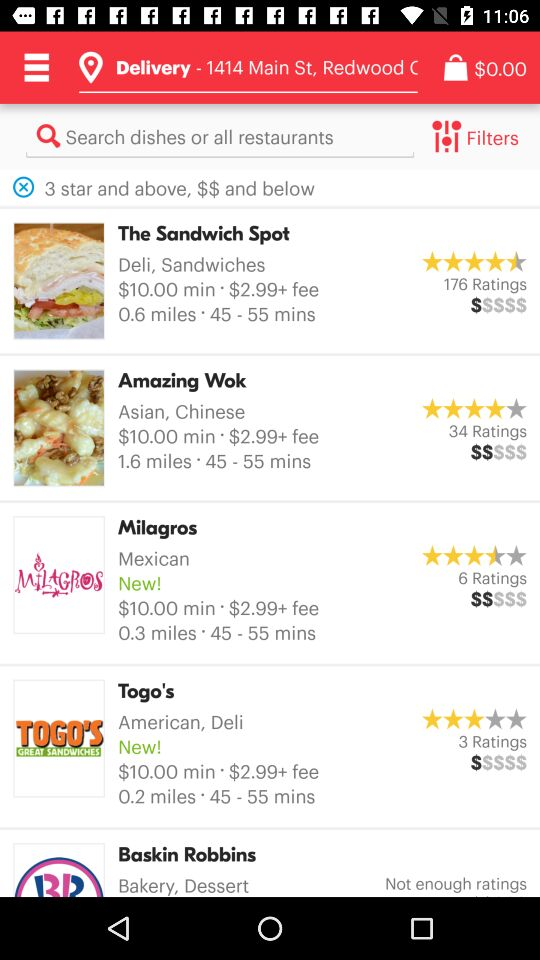

/home/toby/Screen2Vec/datasets/filtered_traces/com.grubhub.android/trace_0/view_hierarchies/../screenshots/941.jpg
score:  0.04245289739101288
model name:  textonly
package name:  com.grubhub.android
screen id:  com.grubhub.android-trace_0-view_hierarchies-941




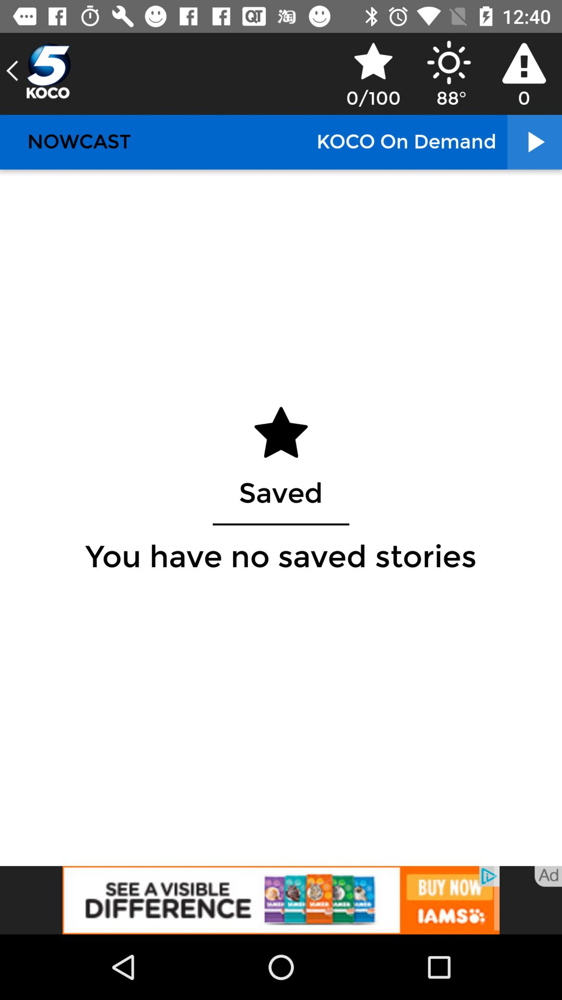

/home/toby/Screen2Vec/datasets/filtered_traces/com.hearst.android.koco/trace_0/view_hierarchies/../screenshots/909.jpg
score:  0.04260427818222956
model name:  textonly
package name:  com.hearst.android.koco
screen id:  com.hearst.android.koco-trace_0-view_hierarchies-909




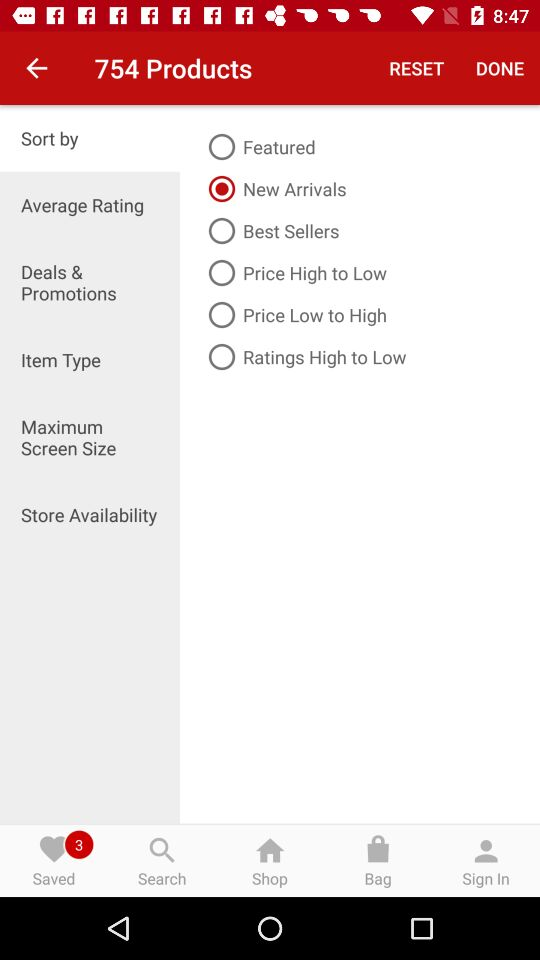

/home/toby/Screen2Vec/datasets/filtered_traces/com.jcp/trace_1/view_hierarchies/../screenshots/1704.jpg
score:  0.044941738194019476
model name:  textonly
package name:  com.jcp
screen id:  com.jcp-trace_1-view_hierarchies-1704




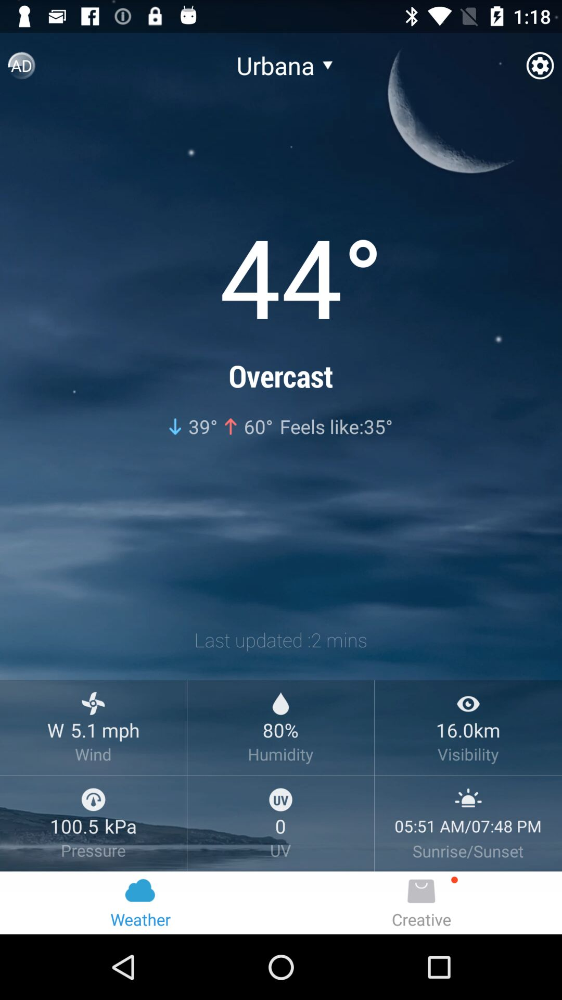

/home/toby/Screen2Vec/datasets/filtered_traces/mobi.infolife.ezweather.widget.histogram/trace_0/view_hierarchies/../screenshots/408.jpg
score:  0.04495684038654035
model name:  textonly
package name:  mobi.infolife.ezweather.widget.histogram
screen id:  mobi.infolife.ezweather.widget.histogram-trace_0-view_hierarchies-408




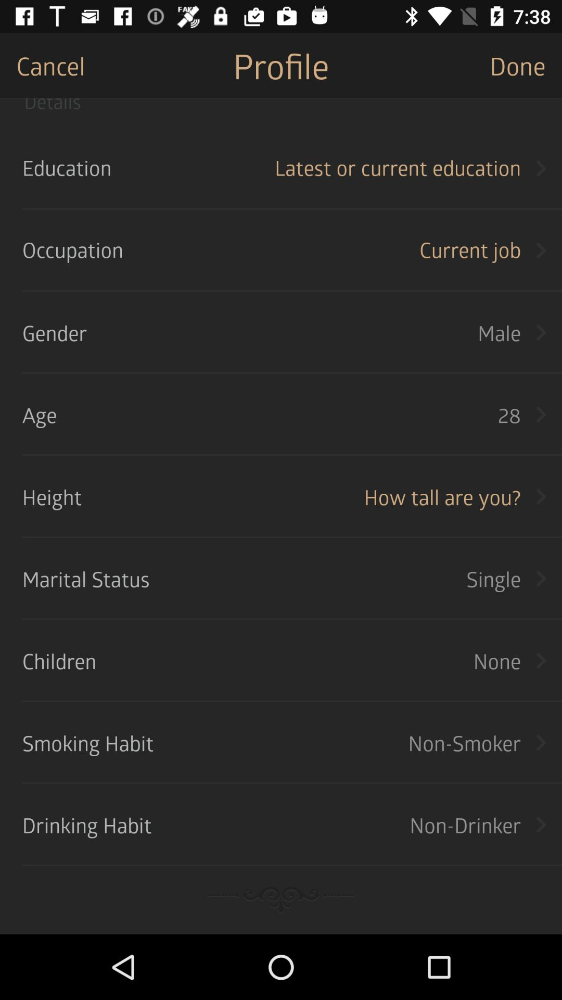

/home/toby/Screen2Vec/datasets/filtered_traces/com.luxy/trace_0/view_hierarchies/../screenshots/1745.jpg
score:  0.04515791265471214
model name:  textonly
package name:  com.luxy
screen id:  com.luxy-trace_0-view_hierarchies-1745


[{'rico_id': 'com.grubhub.android/trace_0/view_hierarchies/941.json', 'score': 0.04245289739101288}, {'rico_id': 'com.hearst.android.koco/trace_0/view_hierarchies/909.json', 'score': 0.04260427818222956}, {'rico_id': 'com.jcp/trace_1/view_hierarchies/1704.json', 'score': 0.044941738194019476}, {'rico_id': 'mobi.infolife.ezweather.widget.histogram/trace_0/view_hierarchies/408.json', 'score': 0.04495684038654035}, {'rico_id': 'com.luxy/trace_0/view_hierarchies/1745.json', 'score': 0.04515791265471214}] 


Source Screen:


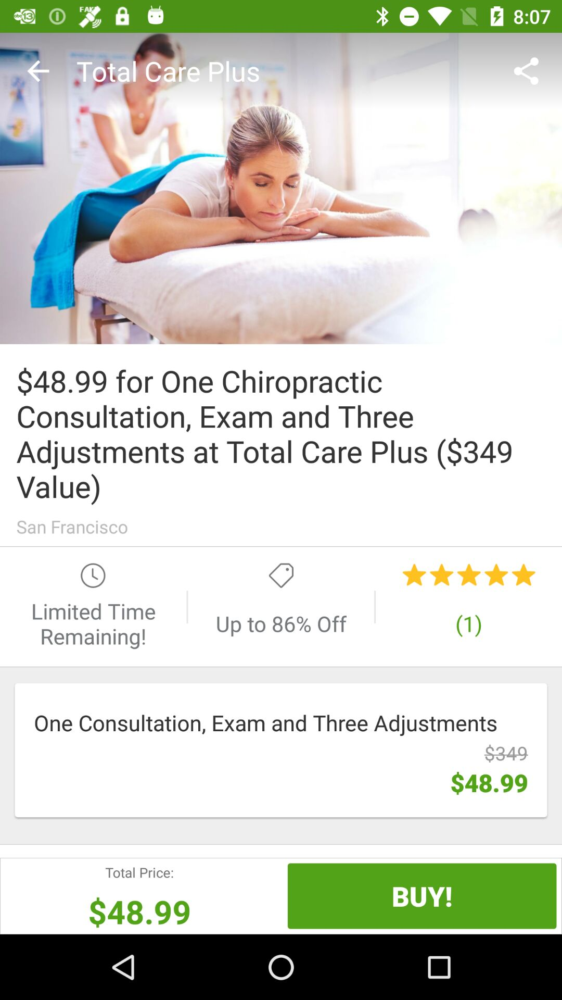

/home/toby/Screen2Vec/datasets/filtered_traces/com.groupon/trace_0/view_hierarchies/../screenshots/768.jpg

package name:  com.groupon
screen id:  com.groupon-trace_0-view_hierarchies-768




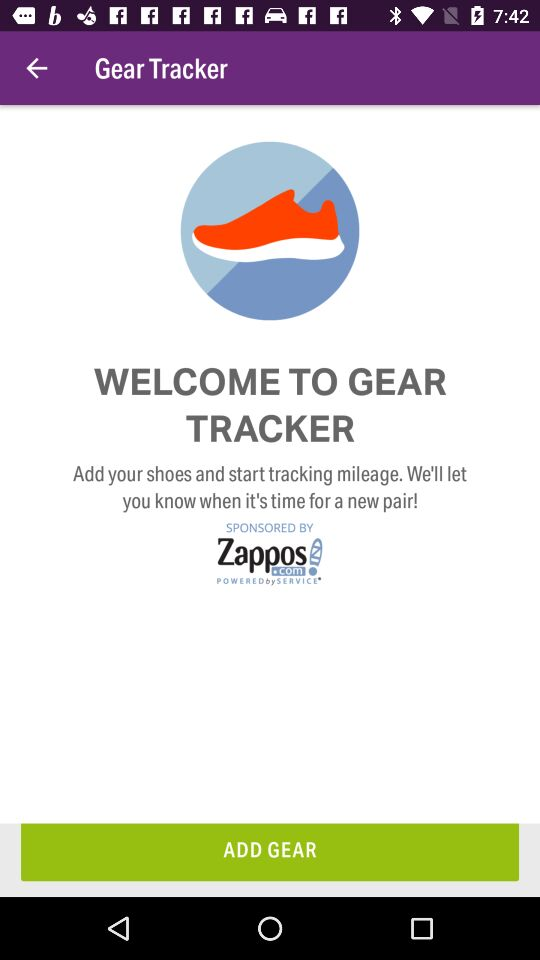

/home/toby/Screen2Vec/datasets/filtered_traces/com.mapmywalk.android2/trace_0/view_hierarchies/../screenshots/5609.jpg
score:  0.03656321791770245
model name:  layoutonly
package name:  com.mapmywalk.android2
screen id:  com.mapmywalk.android2-trace_0-view_hierarchies-5609




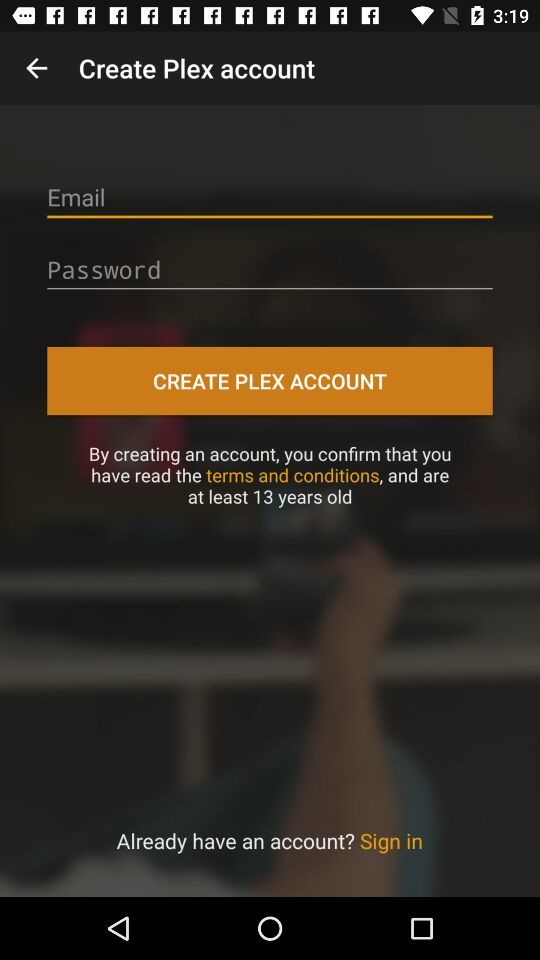

/home/toby/Screen2Vec/datasets/filtered_traces/com.plexapp.android/trace_1/view_hierarchies/../screenshots/26.jpg
score:  0.036847257047137094
model name:  layoutonly
package name:  com.plexapp.android
screen id:  com.plexapp.android-trace_1-view_hierarchies-26




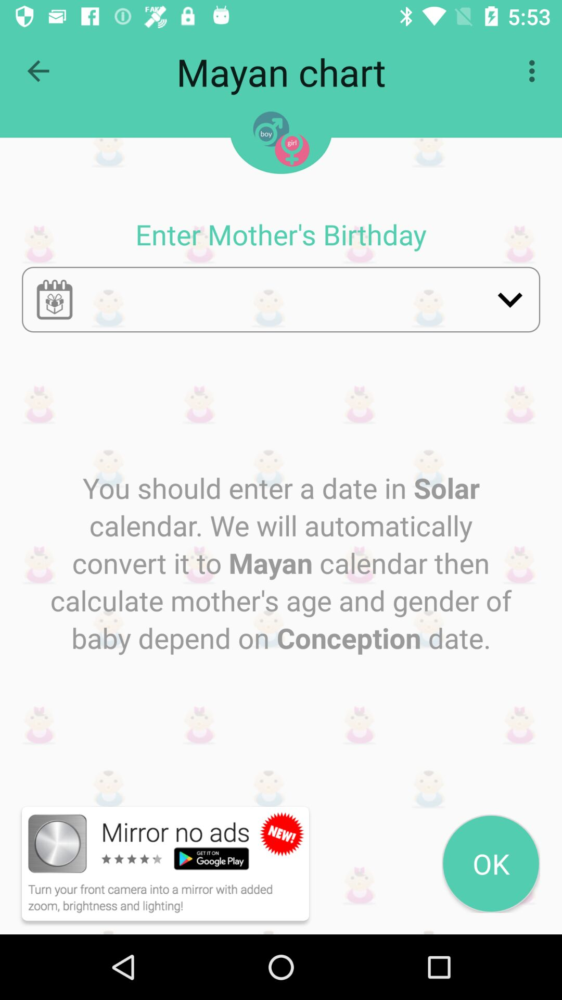

/home/toby/Screen2Vec/datasets/filtered_traces/culun.app.gender.chart/trace_0/view_hierarchies/../screenshots/90.jpg
score:  0.03817988919440729
model name:  layoutonly
package name:  culun.app.gender.chart
screen id:  culun.app.gender.chart-trace_0-view_hierarchies-90




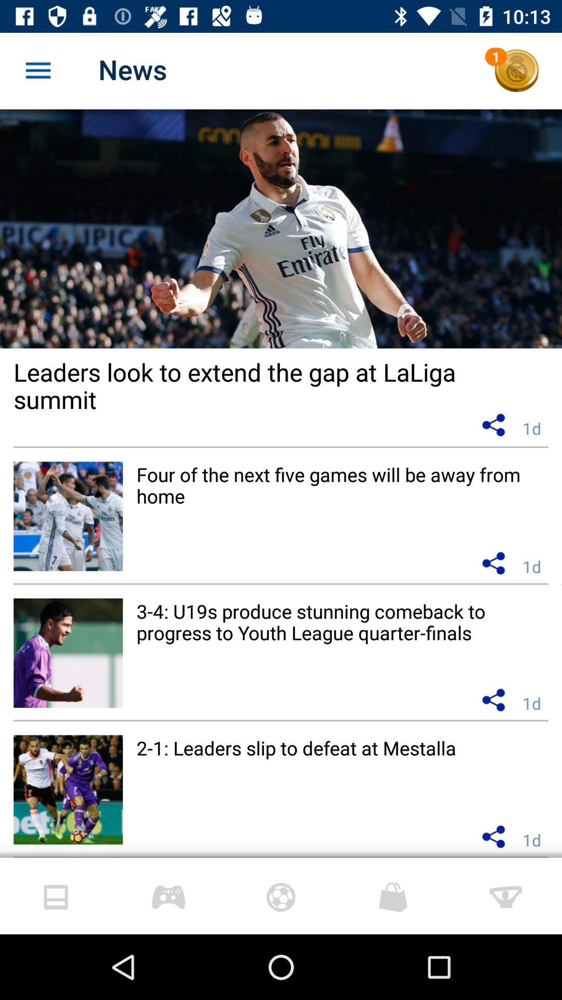

/home/toby/Screen2Vec/datasets/filtered_traces/com.mcentric.mcclient.MyMadrid/trace_0/view_hierarchies/../screenshots/1624.jpg
score:  0.03894472346150202
model name:  layoutonly
package name:  com.mcentric.mcclient.MyMadrid
screen id:  com.mcentric.mcclient.MyMadrid-trace_0-view_hierarchies-1624




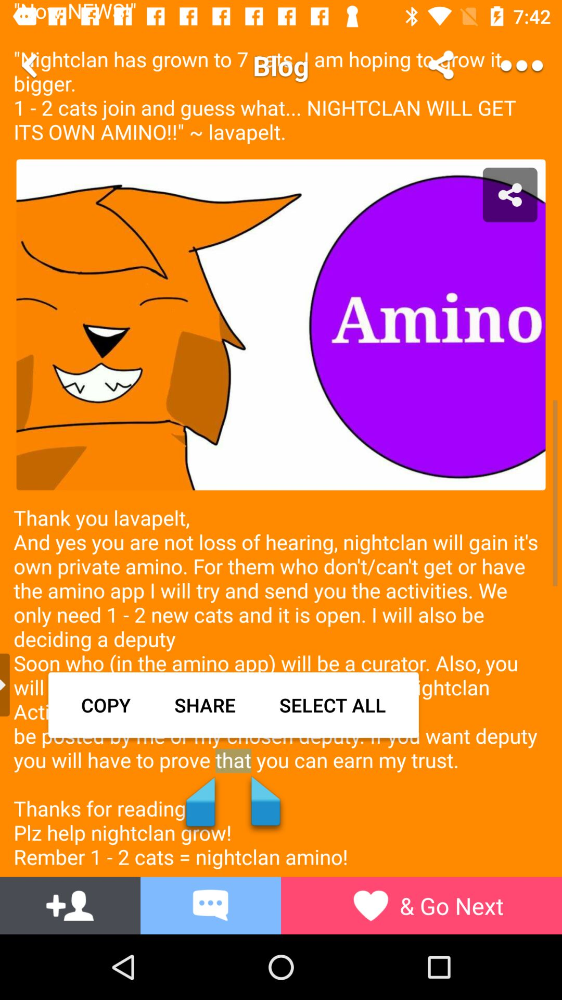

/home/toby/Screen2Vec/datasets/filtered_traces/com.narvii.amino.x80879609/trace_0/view_hierarchies/../screenshots/1712.jpg
score:  0.03923408285844454
model name:  layoutonly
package name:  com.narvii.amino.x80879609
screen id:  com.narvii.amino.x80879609-trace_0-view_hierarchies-1712


[{'rico_id': 'com.mapmywalk.android2/trace_0/view_hierarchies/5609.json', 'score': 0.03656321791770245}, {'rico_id': 'com.plexapp.android/trace_1/view_hierarchies/26.json', 'score': 0.036847257047137094}, {'rico_id': 'culun.app.gender.chart/trace_0/view_hierarchies/90.json', 'score': 0.03817988919440729}, {'rico_id': 'com.mcentric.mcclient.MyMadrid/trace_0/view_hierarchies/1624.json', 'score': 0.03894472346150202}, {'rico_id': 'com.narvii.amino.x80879609/trace_0/view_hierarchies/1712.json', 'score': 0.03923408285844454}] 


Source Screen:


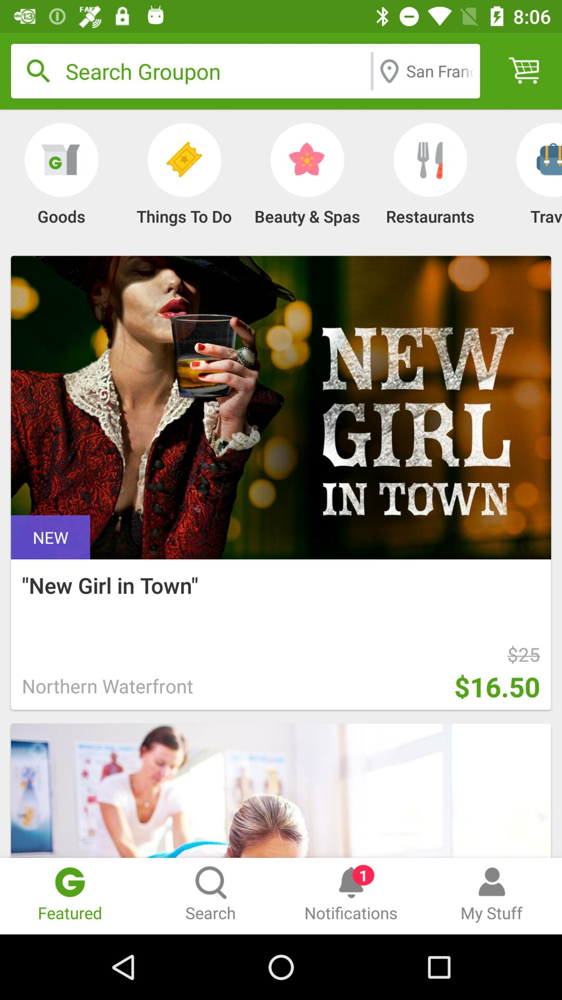

/home/toby/Screen2Vec/datasets/filtered_traces/com.groupon/trace_0/view_hierarchies/../screenshots/653.jpg

package name:  com.groupon
screen id:  com.groupon-trace_0-view_hierarchies-653




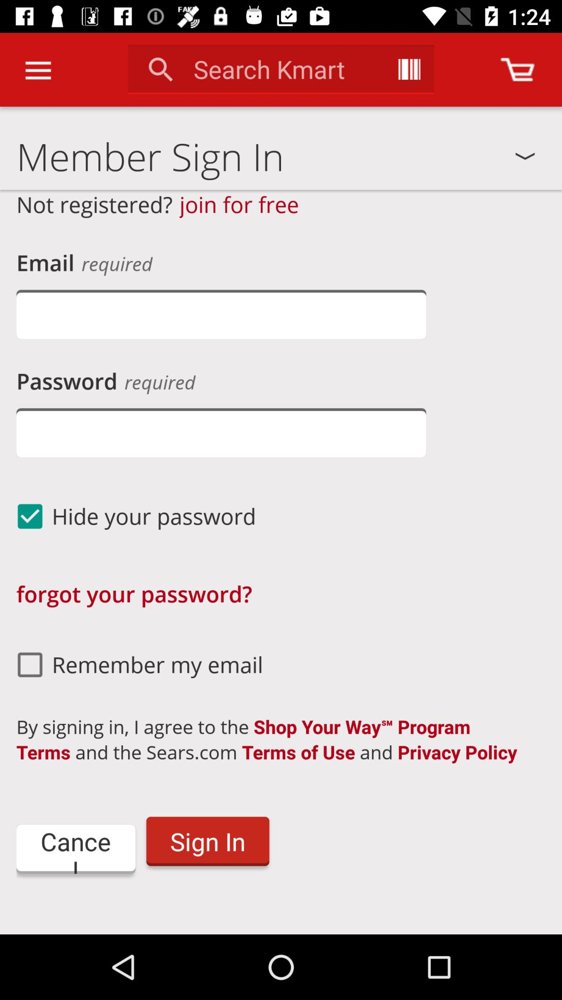

/home/toby/Screen2Vec/datasets/filtered_traces/com.kmart.android/trace_0/view_hierarchies/../screenshots/295.jpg
score:  0.11802493374671807
model name:  screen2vec
package name:  com.kmart.android
screen id:  com.kmart.android-trace_0-view_hierarchies-295




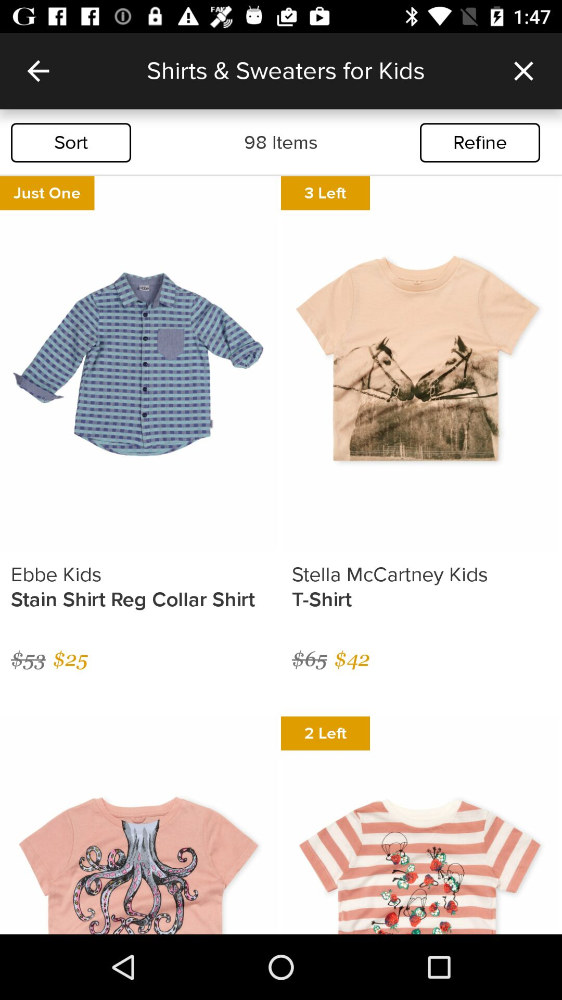

/home/toby/Screen2Vec/datasets/filtered_traces/com.gilt.android/trace_0/view_hierarchies/../screenshots/424.jpg
score:  0.11952780345320657
model name:  screen2vec
package name:  com.gilt.android
screen id:  com.gilt.android-trace_0-view_hierarchies-424




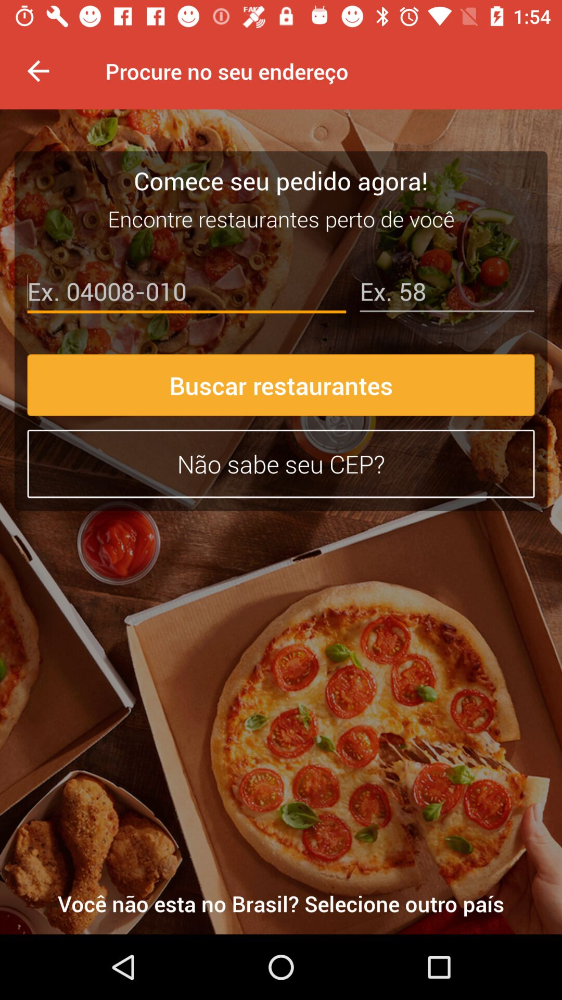

/home/toby/Screen2Vec/datasets/filtered_traces/com.pedidosya/trace_1/view_hierarchies/../screenshots/229.jpg
score:  0.1199883730385628
model name:  screen2vec
package name:  com.pedidosya
screen id:  com.pedidosya-trace_1-view_hierarchies-229




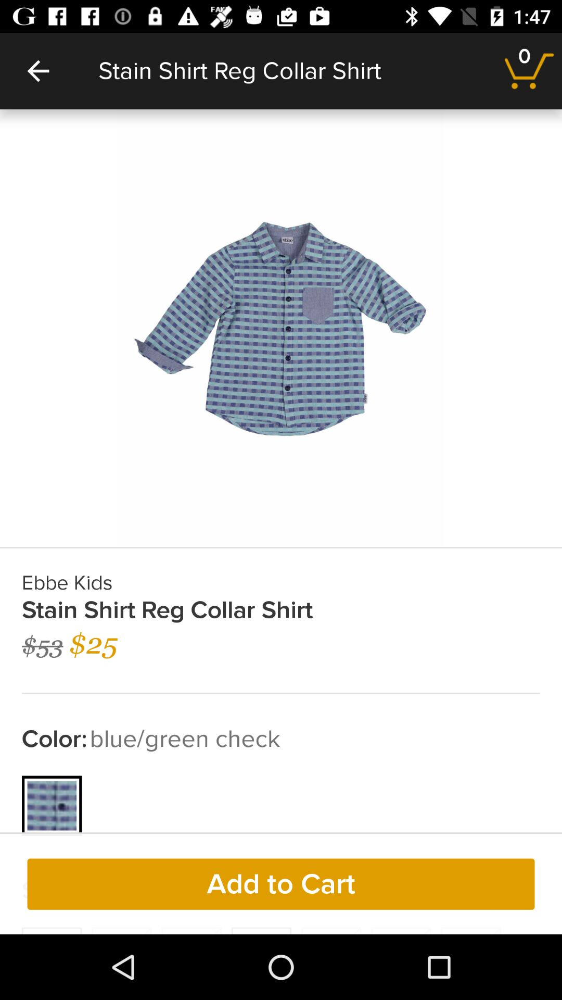

/home/toby/Screen2Vec/datasets/filtered_traces/com.gilt.android/trace_0/view_hierarchies/../screenshots/444.jpg
score:  0.12194599690024344
model name:  screen2vec
package name:  com.gilt.android
screen id:  com.gilt.android-trace_0-view_hierarchies-444




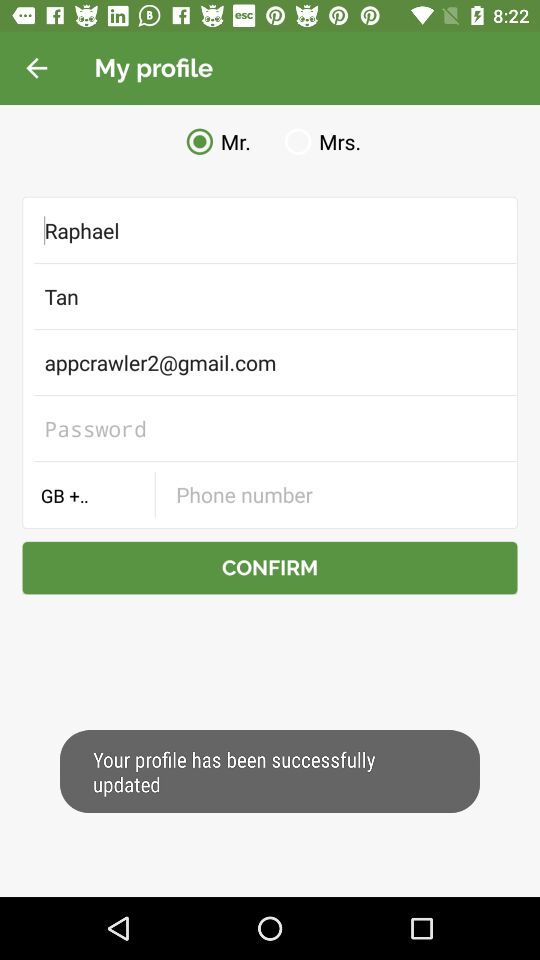

/home/toby/Screen2Vec/datasets/filtered_traces/com.lafourchette.lafourchette/trace_0/view_hierarchies/../screenshots/5284.jpg
score:  0.13287655605628368
model name:  screen2vec
package name:  com.lafourchette.lafourchette
screen id:  com.lafourchette.lafourchette-trace_0-view_hierarchies-5284


[{'rico_id': 'com.kmart.android/trace_0/view_hierarchies/295.json', 'score': 0.11802493374671807}, {'rico_id': 'com.gilt.android/trace_0/view_hierarchies/424.json', 'score': 0.11952780345320657}, {'rico_id': 'com.pedidosya/trace_1/view_hierarchies/229.json', 'score': 0.1199883730385628}, {'rico_id': 'com.gilt.android/trace_0/view_hierarchies/444.json', 'score': 0.12194599690024344}, {'rico_id': 'com.lafourchette.lafourchette/trace_0/view_hierarchies/5284.json', 'score': 0.13287655605628368}] 


Source Screen:


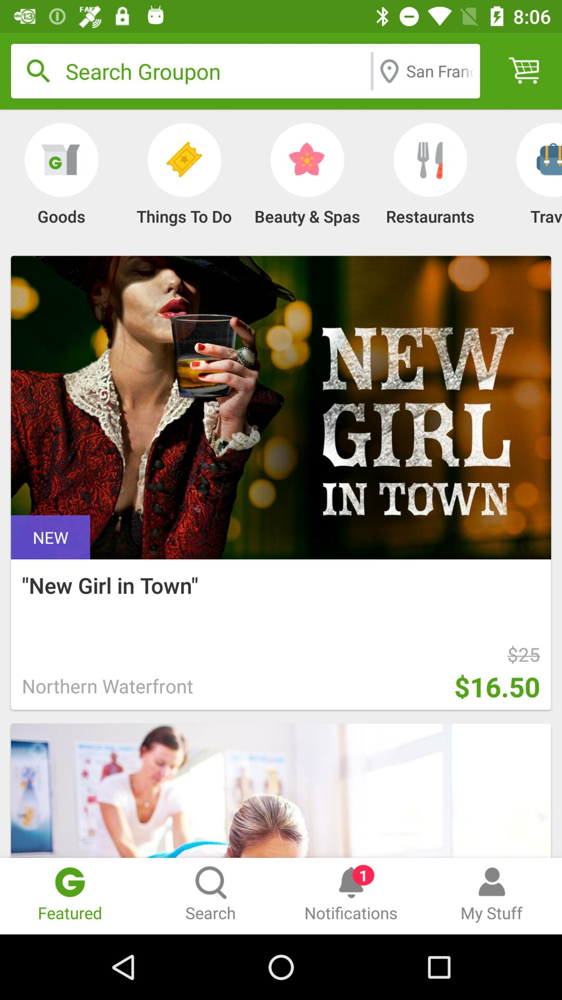

/home/toby/Screen2Vec/datasets/filtered_traces/com.groupon/trace_0/view_hierarchies/../screenshots/653.jpg

package name:  com.groupon
screen id:  com.groupon-trace_0-view_hierarchies-653




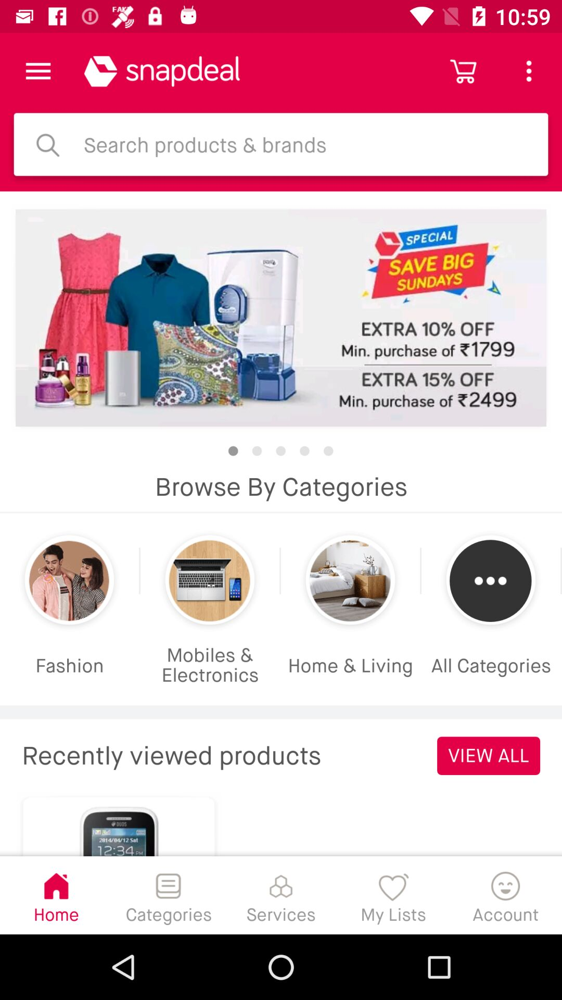

/home/toby/Screen2Vec/datasets/filtered_traces/com.snapdeal.main/trace_0/view_hierarchies/../screenshots/730.jpg
score:  0.018393876199391812
model name:  textonly
package name:  com.snapdeal.main
screen id:  com.snapdeal.main-trace_0-view_hierarchies-730




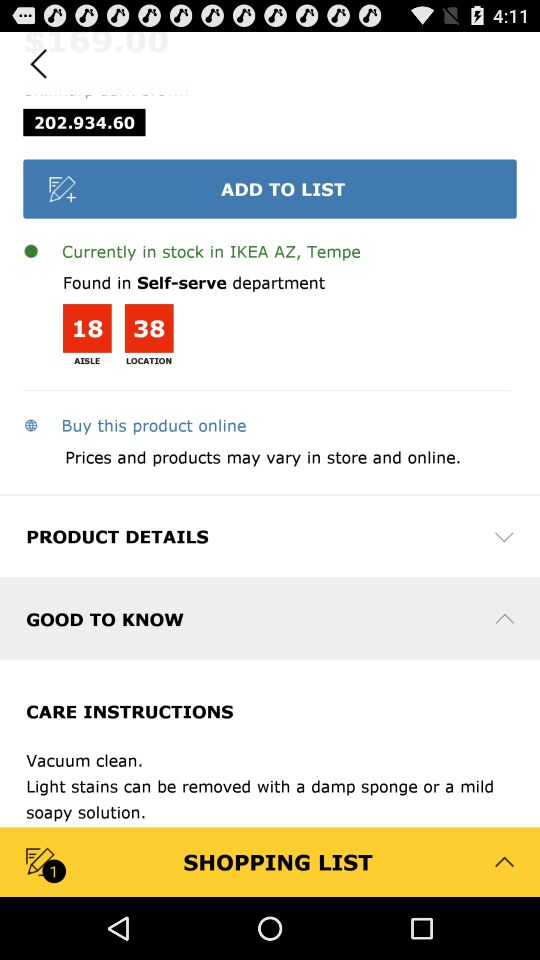

/home/toby/Screen2Vec/datasets/filtered_traces/com.ikea.kompis/trace_0/view_hierarchies/../screenshots/1656.jpg
score:  0.021767869225660874
model name:  textonly
package name:  com.ikea.kompis
screen id:  com.ikea.kompis-trace_0-view_hierarchies-1656




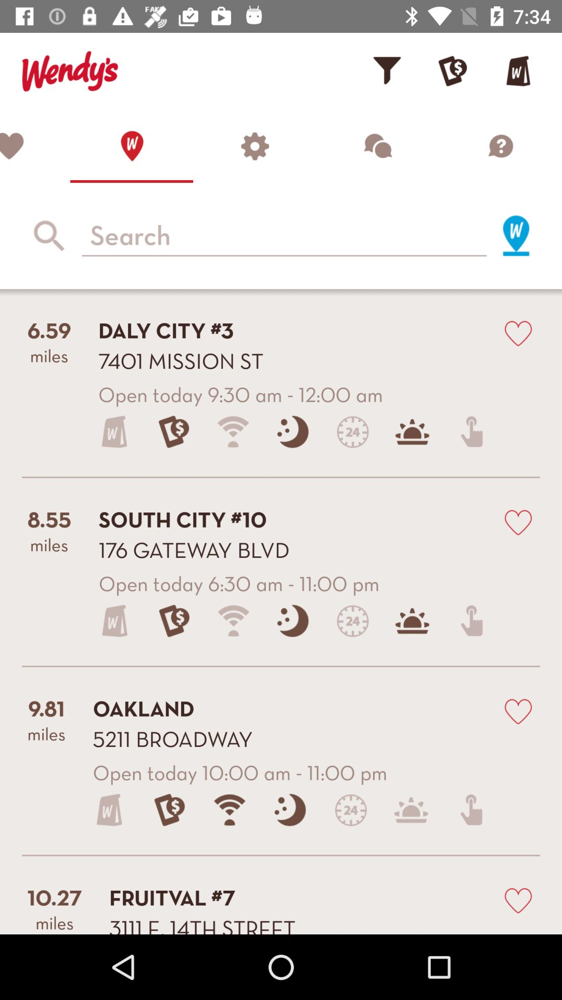

/home/toby/Screen2Vec/datasets/filtered_traces/com.wendys.nutritiontool/trace_0/view_hierarchies/../screenshots/95.jpg
score:  0.022606765652324334
model name:  textonly
package name:  com.wendys.nutritiontool
screen id:  com.wendys.nutritiontool-trace_0-view_hierarchies-95




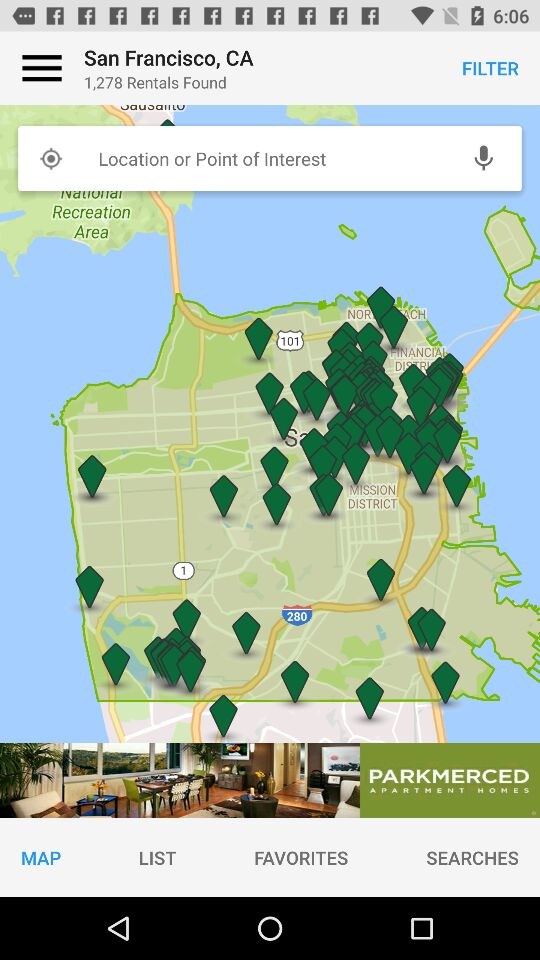

/home/toby/Screen2Vec/datasets/filtered_traces/com.apartments.mobile.android/trace_0/view_hierarchies/../screenshots/2556.jpg
score:  0.022653509867765265
model name:  textonly
package name:  com.apartments.mobile.android
screen id:  com.apartments.mobile.android-trace_0-view_hierarchies-2556




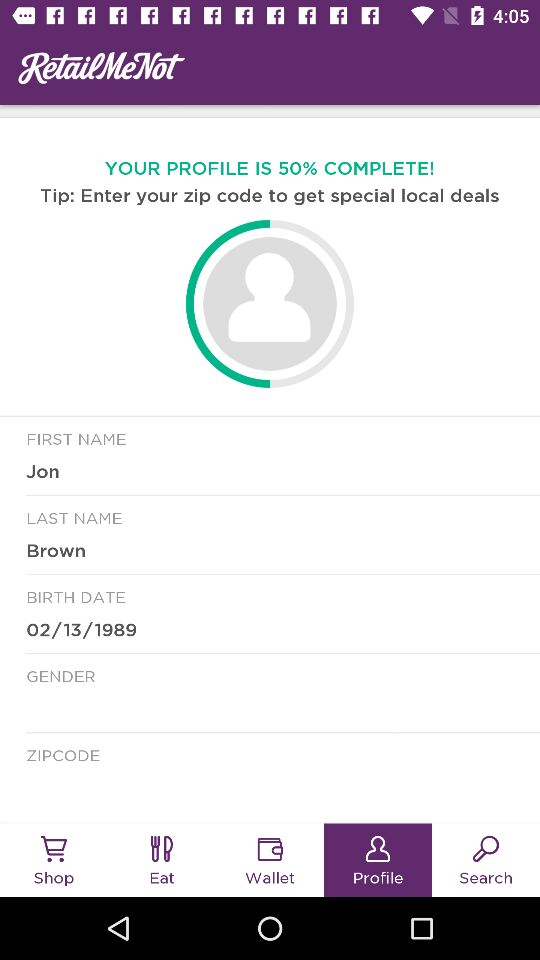

/home/toby/Screen2Vec/datasets/filtered_traces/com.whaleshark.retailmenot/trace_0/view_hierarchies/../screenshots/3249.jpg
score:  0.022846539504636887
model name:  textonly
package name:  com.whaleshark.retailmenot
screen id:  com.whaleshark.retailmenot-trace_0-view_hierarchies-3249


[{'rico_id': 'com.snapdeal.main/trace_0/view_hierarchies/730.json', 'score': 0.018393876199391812}, {'rico_id': 'com.ikea.kompis/trace_0/view_hierarchies/1656.json', 'score': 0.021767869225660874}, {'rico_id': 'com.wendys.nutritiontool/trace_0/view_hierarchies/95.json', 'score': 0.022606765652324334}, {'rico_id': 'com.apartments.mobile.android/trace_0/view_hierarchies/2556.json', 'score': 0.022653509867765265}, {'rico_id': 'com.whaleshark.retailmenot/trace_0/view_hierarchies/3249.json', 'score': 0.022846539504636887}] 


Source Screen:


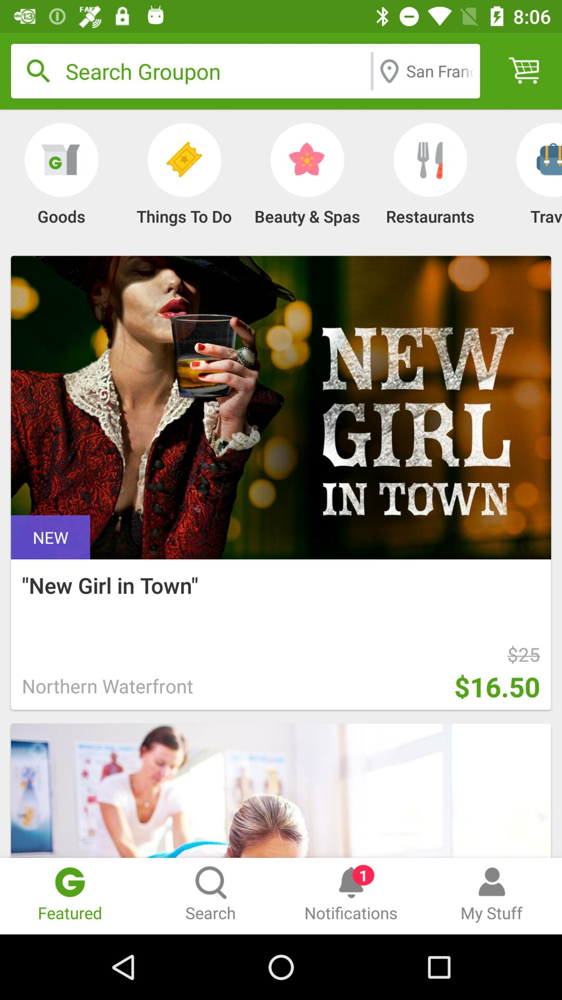

/home/toby/Screen2Vec/datasets/filtered_traces/com.groupon/trace_0/view_hierarchies/../screenshots/653.jpg

package name:  com.groupon
screen id:  com.groupon-trace_0-view_hierarchies-653




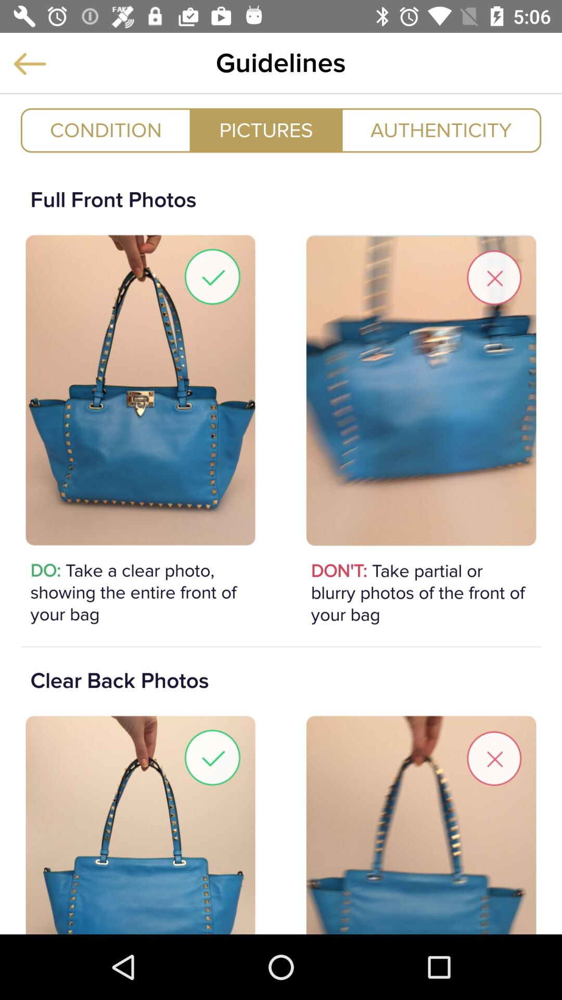

/home/toby/Screen2Vec/datasets/filtered_traces/com.rebagg.rebagg/trace_0/view_hierarchies/../screenshots/375.jpg
score:  0.0647981620567909
model name:  layoutonly
package name:  com.rebagg.rebagg
screen id:  com.rebagg.rebagg-trace_0-view_hierarchies-375




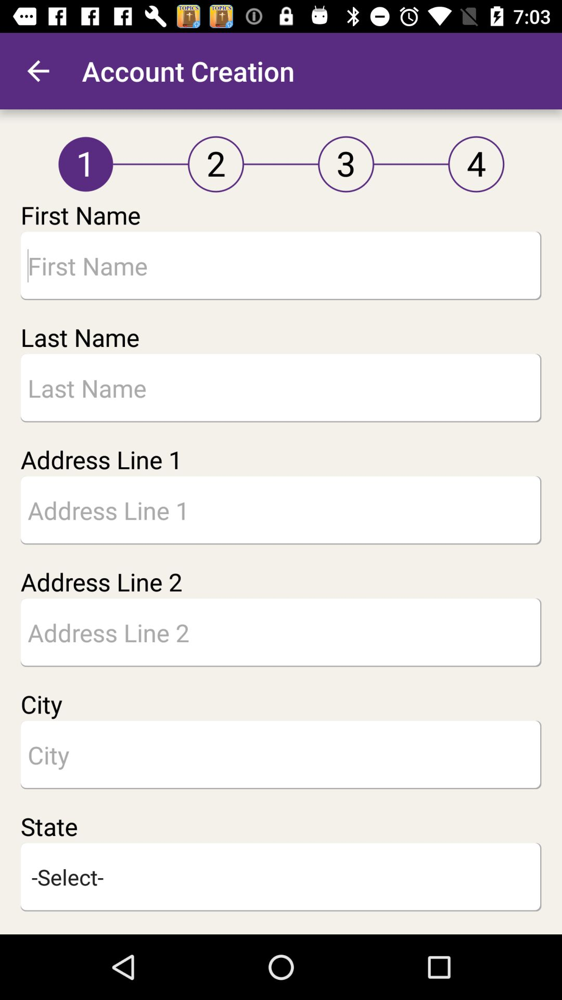

/home/toby/Screen2Vec/datasets/filtered_traces/net.gtl.mobile_app/trace_0/view_hierarchies/../screenshots/350.jpg
score:  0.07237472746915141
model name:  layoutonly
package name:  net.gtl.mobile_app
screen id:  net.gtl.mobile_app-trace_0-view_hierarchies-350




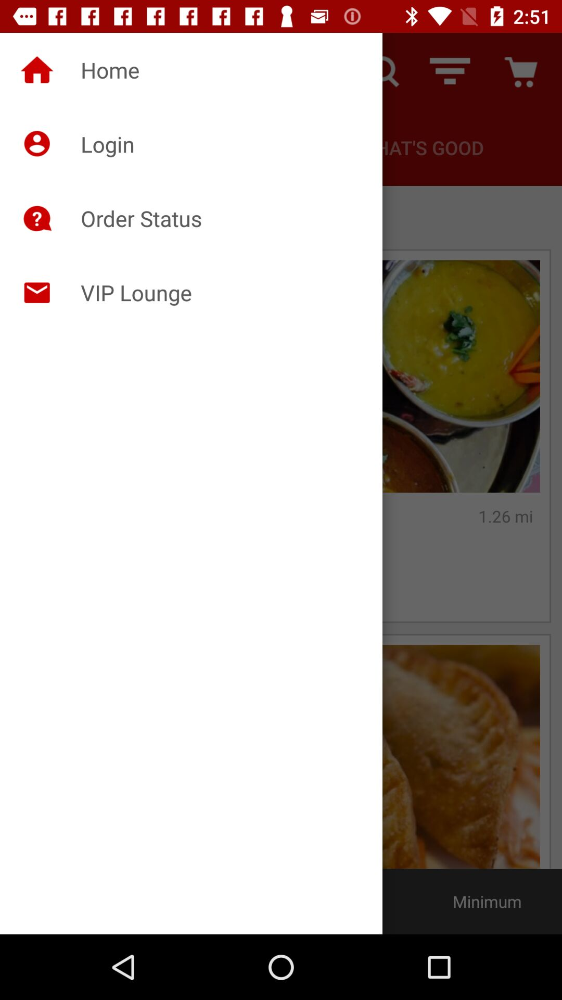

/home/toby/Screen2Vec/datasets/filtered_traces/com.eat24.app/trace_0/view_hierarchies/../screenshots/138.jpg
score:  0.07301905120529295
model name:  layoutonly
package name:  com.eat24.app
screen id:  com.eat24.app-trace_0-view_hierarchies-138




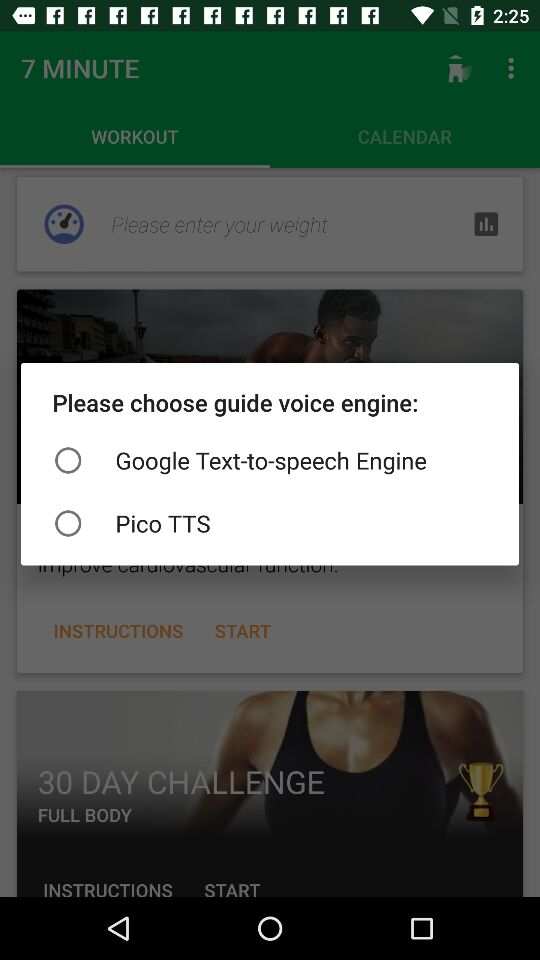

/home/toby/Screen2Vec/datasets/filtered_traces/com.popularapp.sevenmins/trace_0/view_hierarchies/../screenshots/92.jpg
score:  0.07473007399099196
model name:  layoutonly
package name:  com.popularapp.sevenmins
screen id:  com.popularapp.sevenmins-trace_0-view_hierarchies-92




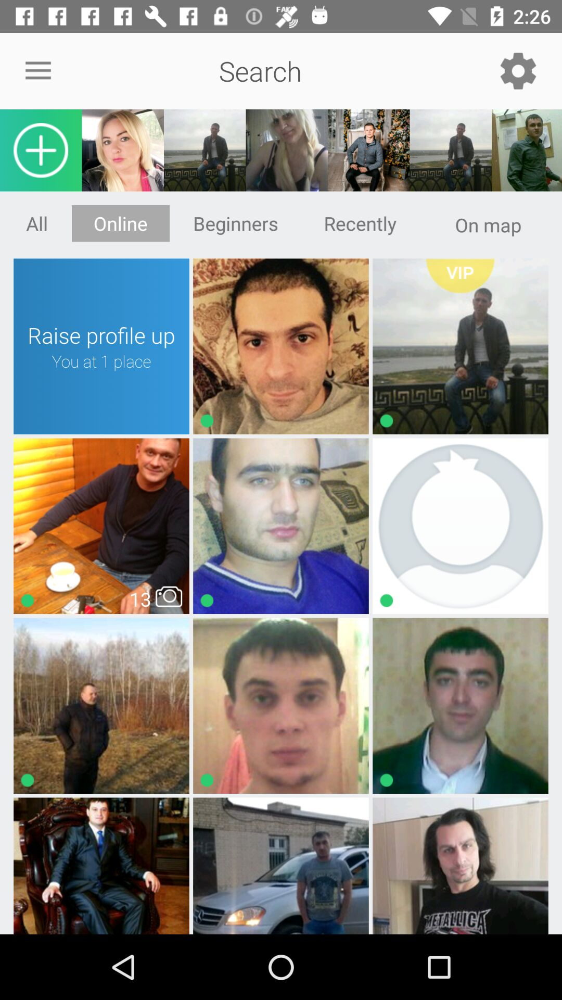

/home/toby/Screen2Vec/datasets/filtered_traces/ru.mylove.dating/trace_0/view_hierarchies/../screenshots/319.jpg
score:  0.07587774155318305
model name:  layoutonly
package name:  ru.mylove.dating
screen id:  ru.mylove.dating-trace_0-view_hierarchies-319


[{'rico_id': 'com.rebagg.rebagg/trace_0/view_hierarchies/375.json', 'score': 0.0647981620567909}, {'rico_id': 'net.gtl.mobile_app/trace_0/view_hierarchies/350.json', 'score': 0.07237472746915141}, {'rico_id': 'com.eat24.app/trace_0/view_hierarchies/138.json', 'score': 0.07301905120529295}, {'rico_id': 'com.popularapp.sevenmins/trace_0/view_hierarchies/92.json', 'score': 0.07473007399099196}, {'rico_id': 'ru.mylove.dating/trace_0/view_hierarchies/319.json', 'score': 0.07587774155318305}] 




In [94]:
# Generating the MTurk test data

"""
    #1 Nordstrom Rack Profile
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.nordstrom.rack.app/trace_0/view_hierarchies/630.json',
    #2 Nordstrom Rack Category
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.nordstrom.rack.app/trace_0/view_hierarchies/2.json',
    #3 Lyft Main Menu
    '/home/toby/Screen2Vec/datasets/filtered_traces/me.lyft.android/trace_0/view_hierarchies/1294.json',
    #4 Cinemark Movie Selection
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.cinemark.mobile/trace_0/view_hierarchies/2751.json',
    #5 CitiBank Feedback
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.citibank.mobile.cn/trace_0/view_hierarchies/484.json',
    #6 WeightWatcher Feed
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.weightwatchers.fitbreak/trace_0/view_hierarchies/1424.json',
    #7 WebMD Main
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.webmd.android/trace_0/view_hierarchies/1.json',
    #8 WebMD Baby Main
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.webmd.baby/trace_0/view_hierarchies/632.json',
    #9 Wayfair Item List
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.wayfair.wayfair/trace_1/view_hierarchies/607.json',
    #10 Wayfair Item Detail
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.wayfair.wayfair/trace_1/view_hierarchies/1363.json',
    #11 Venmo Hamburger Menu
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.venmo/trace_0/view_hierarchies/1133.json',
    #12 Venmo Pay Screen
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.venmo/trace_0/view_hierarchies/1025.json',
    #13 Venmo Sync FB Friends
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.venmo/trace_0/view_hierarchies/571.json',
    #14 AirBnb Home Search Result
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.airbnb.android/trace_0/view_hierarchies/420.json',
    #15 AirBnb Experience
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.airbnb.android/trace_0/view_hierarchies/781.json',
    #16 Amazon Music Billing
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.amazon.mp3/trace_0/view_hierarchies/2942.json',
    #17 Amtrak Main
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.amtrak.rider/trace_0/view_hierarchies/247.json',
    #18 Amtrak Station Info
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.amtrak.rider/trace_0/view_hierarchies/341.json',
    #19 Pregnancy Tracker
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.babycenter.pregnancytracker/trace_0/view_hierarchies/2869.json',
    #20 Pregnancy Tracker - Product Search
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.babycenter.pregnancytracker/trace_0/view_hierarchies/3176.json',
    #21 Best Western Hotel Booking
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.bestwestern.android/trace_0/view_hierarchies/145.json',
    #22 Disney Item Details
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.disney.shopdisneyparks_goo/trace_0/view_hierarchies/527.json',
    #23 Dominos Main
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.dominospizza/trace_0/view_hierarchies/1989.json',
    #24 Duolino Language Selection
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.duolingo/trace_0/view_hierarchies/947.json',
    #25 Duolino Translation
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.duolingo/trace_0/view_hierarchies/3958.json',
    #26 eBay Item List
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.ebay.mobile/trace_0/view_hierarchies/73.json',
    #27 eBay Item List car
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.ebay.mobile/trace_1/view_hierarchies/528.json',
    #28 eBay select location
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.ebay.mobile/trace_1/view_hierarchies/858.json',
    #29 Etsy shop items
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.etsy.android/trace_0/view_hierarchies/1391.json',
    #30 Etsy Featured
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.etsy.android/trace_0/view_hierarchies/1205.json',
    #31 Etsy Favorite Items
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.etsy.android/trace_0/view_hierarchies/1066.json',
    #32 Expedia Hotel Booking
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.expedia.bookings/trace_0/view_hierarchies/82.json',
    #33 Expedia Hotel List
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.expedia.bookings/trace_0/view_hierarchies/147.json',
    #34 Facebook Add Friend
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.facebook.katana/trace_0/view_hierarchies/525.json',
    #35 Fanatics Hamburger Menu
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.fanatics/trace_0/view_hierarchies/296.json',
    #36 Fanatics Jersey Items
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.fanatics/trace_0/view_hierarchies/285.json',
    #37 Regal Cinema Hamburger Menu
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.fandango.regal/trace_1/view_hierarchies/389.json',
    #38 Fidelity market
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.fidelity.android/trace_1/view_hierarchies/148.json',
    #39 Flower 1800 Categories
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.flowers1800.androidapp2/trace_0/view_hierarchies/289.json',
    #40 Flower 1800 Items
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.flowers1800.androidapp2/trace_0/view_hierarchies/363.json',
    #41 Fox News Hamburger Menu
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.foxnews.android/trace_1/view_hierarchies/577.json',
    #42 Fox News Main News
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.foxnews.android/trace_1/view_hierarchies/385.json',
    #43 Cheapo Air Flight Search
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.fp.cheapoair/trace_0/view_hierarchies/139.json',
    #44 Cheapo Air Hotel Result
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.fp.cheapoair/trace_0/view_hierarchies/3627.json',
    """
selected_screens = [
    
    #45 Chevrolet Ownership App
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.gm.chevrolet.nomad.ownership/trace_0/view_hierarchies/183.json',
    #46 YouTube Playing
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.google.android.youtube/trace_0/view_hierarchies/334.json',
    #47 Zagat Location Choose
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.google.zagat/trace_0/view_hierarchies/101.json',
    #48 Zagat Search Result
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.google.zagat/trace_0/view_hierarchies/385.json',
    #49 Groupon Item
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.groupon/trace_0/view_hierarchies/768.json',
    #50 Groupon Main
    '/home/toby/Screen2Vec/datasets/filtered_traces/com.groupon/trace_0/view_hierarchies/653.json'
    
]
target_dir = '/home/toby/Screen2Vec_sampleData'
models = [('screen2vec', screen2vec_embeddings), ('textonly', textonly_embeddings), ('layoutonly', layoutonly_embeddings)]
n = 5

if not os.path.exists(target_dir):
    os.makedirs(target_dir)
for selected_screen in selected_screens:
    selected_screen_id = get_id_from_path(selected_screen)
    selected_screen_dir = target_dir + '/' + selected_screen_id
    # create selected screen dir
    if not os.path.exists(selected_screen_dir):
        os.makedirs(selected_screen_dir)
    # copy the src json
    copy2(selected_screen, selected_screen_dir + '/src.json')
    # copy the src image
    copy2(get_screenshot_path_for_screen_path(selected_screen), selected_screen_dir + '/src.png')
    for model_name, model_embedding in models:
        # create model dir
        model_dir = selected_screen_dir + '/' + model_name
        if not os.path.exists(model_dir):
            os.makedirs(model_dir)
       
        print ('Source Screen:')
        show_rico_image(get_screenshot_path_for_screen_path(selected_screen))
        print ()
        print ('package name: ', get_app_package_name_from_screen_path(selected_screen))
        print ('screen id: ', selected_screen_id)
        print ('\n')
        if selected_screen in model_embedding:
            results = (get_most_relevant_embeddings(selected_screen, model_embedding, n, home_dataset_path, filter_duplicated_activity=True))
        elif get_relative_path_from_full_path(selected_screen) in model_embedding:
            results = (get_most_relevant_embeddings(get_relative_path_from_full_path(selected_screen), model_embedding, n, home_dataset_path, filter_duplicated_activity=True))
        else:
            print ('ERROR: can\'t find the id: ', selected_screen, " in model ", model_name)
        for result in results:
             # copy the result json
            copy2(get_full_path_from_relative_path_if_not_available(result['rico_id'], home_dataset_path), model_dir)
            # copy the result image
            copy2(get_screenshot_path_for_screen_path(get_full_path_from_relative_path_if_not_available(result['rico_id'], home_dataset_path)), model_dir)
            show_rico_image(get_screenshot_path_for_screen_path(get_full_path_from_relative_path_if_not_available(result['rico_id'], home_dataset_path)))
            result_screen_id = get_id_from_path(get_full_path_from_relative_path_if_not_available(result['rico_id'], home_dataset_path))
            print ('score: ', result['score'])
            print ('model name: ', model_name)
            print ('package name: ', get_app_package_name_from_screen_path(get_full_path_from_relative_path_if_not_available(result['rico_id'], home_dataset_path)))
            print ('screen id: ', result_screen_id)
            print ('\n')

        print (results, '\n\n')


In [62]:
from dataset.rico_dao import load_rico_screen_dict
from dataset.rico_utils import get_all_texts_from_rico_screen

# Test the text embedding
json_file = '/home/toby/Screen2Vec/datasets/filtered_traces/com.nordstrom.rack.app/trace_0/view_hierarchies/630.json'
with open(json_file) as f:
    rico_screen = load_rico_screen_dict(json.load(f))
    text = get_all_texts_from_rico_screen(rico_screen)
    print (text)
word_embs = sentence_bert_model.encode(text)
word_avg_emb = np.mean(word_embs, axis=0)
    
json_file2 = '/home/toby/Screen2Vec/datasets/filtered_traces/com.lonelyplanet.guides/trace_0/view_hierarchies/42.json'
with open(json_file2) as f:
    rico_screen = load_rico_screen_dict(json.load(f))
    text2 = get_all_texts_from_rico_screen(rico_screen)
    print (text2)
word_embs2 = sentence_bert_model.encode(text2)
word_avg_emb2 = np.mean(word_embs2, axis=0)

print (scipy.spatial.distance.cosine(word_avg_emb, word_avg_emb2))
print (scipy.spatial.distance.cosine(word_avg_emb2, word_avg_emb))


['Profile', 'Create one account for Nordstrom Rack and Hautelook', 'John', 'Smith', 'appcrawler4@gmail.com', 'Gender: ', 'Female', 'Male', 'Unspecified', '94102', 'United States', 'SAVE', 'Terms', '|', 'Your Privacy Rights', '|', 'Interest Based Ads', 'Rack', 'HauteLook', 'Cart', 'John Smith', 'appcrawler4@gmail.com', 'SIGN OUT', 'Shop', 'Account', 'Orders', 'Shipping Addresses', 'Payment Methods', 'Notifications', 'Profile', 'More', 'Customer Care', 'Shipping and Returns Policy', 'Rate Our App / Give Feedback']



['YOUR ACCOUNT', 'Log In to Lonely Planet', 'Edit Profile', 'Logout', 'NOTIFICATIONS', 'App Tips', 'Requested City Added', 'Travel Alerts', 'Customer Support', 'Distance Units', 'Imperial (mi,ft)', 'INFORMATION', 'About This App', 'Vote for next city', 'Privacy Statement', 'Feedback and Support', 'Review on Google Play', '"It is not down in any map; true places never are."', '— Herman Melville', 'Settings', 'REMOVE CITY?']



0.05709946155548096
0.05709946155548096


66261
in.droom/trace_0/view_hierarchies/137.json
in.droom/trace_0/view_hierarchies/1235.json
in.droom/trace_0/view_hierarchies/349.json
com.GDVGames.LoneWolfBiblio/trace_0/view_hierarchies/33.json
org.schoolsfirstfcu.mobile/trace_0/view_hierarchies/107.json
com.joindouble.android/trace_0/view_hierarchies/213.json
com.joindouble.android/trace_0/view_hierarchies/703.json
com.joindouble.android/trace_0/view_hierarchies/51.json
com.joindouble.android/trace_0/view_hierarchies/203.json
com.joindouble.android/trace_0/view_hierarchies/236.json
com.joindouble.android/trace_0/view_hierarchies/3.json
com.joindouble.android/trace_0/view_hierarchies/225.json
com.joindouble.android/trace_0/view_hierarchies/751.json
arab.ringwe.com/trace_0/view_hierarchies/4.json
arab.ringwe.com/trace_0/view_hierarchies/192.json
arab.ringwe.com/trace_0/view_hierarchies/20.json
arab.ringwe.com/trace_0/view_hierarchies/62.json
com.oodles.download.free.ebooks.reader/trace_0/view_hierarchies/2730.json
com.oodles.download